<a href="https://colab.research.google.com/github/ShinyRyo/new_rep/blob/main/HOME_CREDIT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib
print(matplotlib.matplotlib_fname())

/usr/local/lib/python3.10/dist-packages/matplotlib/mpl-data/matplotlibrc


In [ ]:
ls /

bin@      dev/   lib32@   mnt/                      python-apt/  srv/    usr/
boot/     etc/   lib64@   NGC-DL-CONTAINER-LICENSE  root/        sys/    var/
content/  home/  libx32@  opt/                      run/         tmp/
datalab/  lib@   media/   proc/                     sbin@        tools/


In [ ]:
!pwd

/content


In [ ]:
ls

sample_data/  test.csv  train.csv


# とにかくスコアを出す

## Optunaでハイパーパラメータチューニング

## データ分析のための機械学習

データ分析
1. 最小限の前処理と決定木分析(LightGBM)で数を絞る
1. ヒストグラム(分布を見る)、散布図(数値データ同士)、箱ひげ図(目的変数(カテゴリーデータ)と数値データの比較で外れ値を検出)、
ペアプロットやヒートマップを見て相関の強い変数を確認する
1. 新しい特徴量を作る

In [ ]:
import pandas as pd
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [ ]:
y_col=list(train.columns)
for i in list(test.columns):
    y_col.remove(i)
y_col

['TARGET']

In [ ]:
data = pd.concat([train,test], axis=0)

In [ ]:
data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0.0,Cash loans,F,N,N,0,112500.0,755190.0,36328.5,...,NaN,0.0,0.0,0.0,0.0,-292.0,NaN,NaN,NaN,NaN
1,1,0.0,Cash loans,F,N,Y,0,225000.0,585000.0,16893.0,...,0.553165,0.0,0.0,0.0,0.0,-617.0,0.0,0.0,0.0,1.0
2,2,0.0,Cash loans,F,N,Y,0,54000.0,334152.0,18256.5,...,NaN,4.0,0.0,4.0,0.0,-542.0,NaN,NaN,NaN,NaN
3,3,0.0,Cash loans,F,N,Y,0,67500.0,152820.0,8901.0,...,0.767523,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,1.0,Cash loans,M,N,N,0,157500.0,271066.5,21546.0,...,0.669057,0.0,0.0,0.0,0.0,-1243.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61495,232697,NaN,Cash loans,F,Y,Y,0,315000.0,1288350.0,37800.0,...,0.307737,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,1.0,1.0
61496,232698,NaN,Cash loans,F,NaN,NaN,0,90000.0,273636.0,15408.0,...,0.434733,0.0,0.0,0.0,0.0,-2732.0,0.0,0.0,0.0,0.0
61497,232699,NaN,Cash loans,F,N,Y,0,144000.0,291384.0,26725.5,...,NaN,0.0,0.0,0.0,0.0,-615.0,0.0,0.0,1.0,0.0
61498,232700,NaN,Cash loans,F,N,Y,1,193500.0,746280.0,59094.0,...,NaN,2.0,0.0,2.0,0.0,-1610.0,0.0,0.0,1.0,3.0


In [ ]:
data.shape

(232702, 51)

In [ ]:
categorical_features=list(data.describe(include=['O']).columns)
print(categorical_features)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']


In [ ]:
from sklearn import preprocessing
labels={}
for column in categorical_features:
    # print(train[column].shape)
    le= preprocessing.LabelEncoder()
    le.fit(data[column].astype(str))
    label={column:list(le.classes_)}
    labels.update(label)
    data[column]=le.transform(data[column].astype(str))

In [ ]:
labels

{'NAME_CONTRACT_TYPE': ['Cash loans', 'Revolving loans'],
 'CODE_GENDER': ['F', 'M', 'XNA'],
 'FLAG_OWN_CAR': ['N', 'Y', 'nan'],
 'FLAG_OWN_REALTY': ['N', 'Y', 'nan'],
 'NAME_TYPE_SUITE': ['Children',
  'Family',
  'Group of people',
  'Other_A',
  'Other_B',
  'Spouse, partner',
  'Unaccompanied',
  'nan'],
 'NAME_INCOME_TYPE': ['Businessman',
  'Commercial associate',
  'Maternity leave',
  'Pensioner',
  'State servant',
  'Student',
  'Unemployed',
  'Working'],
 'NAME_EDUCATION_TYPE': ['Academic degree',
  'Higher education',
  'Incomplete higher',
  'Lower secondary',
  'Secondary / secondary special'],
 'NAME_FAMILY_STATUS': ['Civil marriage',
  'Married',
  'Separated',
  'Single / not married',
  'Unknown',
  'Widow'],
 'NAME_HOUSING_TYPE': ['Co-op apartment',
  'House / apartment',
  'Municipal apartment',
  'Office apartment',
  'Rented apartment',
  'With parents'],
 'OCCUPATION_TYPE': ['Accountants',
  'Cleaning staff',
  'Cooking staff',
  'Core staff',
  'Drivers',
  'HR

In [ ]:
train.shape

(171202, 51)

In [ ]:
train=data[:len(train)]
test=data[len(train):]

In [ ]:
if y_col[0] in categorical_features:
    categorical_features.remove(y_col[0])
print(categorical_features)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']


In [ ]:
features=list(data.columns)
features.remove(y_col[0])
print(features)

['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_

In [ ]:
train.shape

(171202, 51)

In [ ]:
X=train[features]
y=train[y_col[0]]

In [ ]:
X.shape

(171202, 50)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y,test_size=0.20, random_state=2)

In [ ]:
!pip install optuna -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 9.2 MB/s eta 0:00:00


In [ ]:
import optuna.integration.lightgbm as lgb
lgb_train = lgb.Dataset(X_train, y_train,)
                       # categorical_feature=categorical_features)
lgb_eval = lgb.Dataset(X_val, y_val, reference=lgb_train,)
                      # categorical_feature=categorical_features)

In [ ]:
import lightgbm as lgb
# LightGBMのデータセットを作成します
train_data = lgb.Dataset(X_train, label=y_train, categorical_feature=categorical_features)
val_data = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

In [ ]:
y.nunique()

2

In [ ]:
# LightGBMのデータセットを作成するために、カテゴリカル変数を適切な形式に変換します
X_train[categorical_features] = X_train[categorical_features].astype('category')
X_val[categorical_features] = X_val[categorical_features].astype('category')

# LightGBMのデータセットを作成します
train_data = lgb.Dataset(X_train, label=y_train)
train_data.set_categorical_feature(categorical_features)

val_data = lgb.Dataset(X_val, label=y_val)
val_data.set_categorical_feature(categorical_features)

/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:2068: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_CONTRACT_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'NAME_INCOME_TYPE', 'NAME_TYPE_SUITE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']
  _log_warning('categorical_feature in Dataset is overridden.\n'


In [ ]:
# パラメータを指定します
params = {
    'objective': 'binary',
    'metric': 'auc'
}

In [ ]:
from optuna.integration import _lightgbm_tuner as lightgbm_tuner

In [ ]:
gbm = lightgbm_tuner.train(params,
                    lgb_train,
                    valid_sets=lgb_eval,
                    num_boost_round=10000,
                    early_stopping_rounds=100,
                    verbose_eval=50,
                    )

[I 2023-06-22 02:06:27,309] A new study created in memory with name: no-name-c2b7f146-5dc6-4a5a-9ef1-366e2c37b831
feature_fraction, val_score: -inf:   0%|          | 0/7 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.750805
[100]	valid_0's auc: 0.751931
[150]	valid_0's auc: 0.74985


feature_fraction, val_score: 0.752743:  14%|#4        | 1/7 [00:04<00:27,  4.55s/it]

Early stopping, best iteration is:
[71]	valid_0's auc: 0.752743


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.750206
[100]	valid_0's auc: 0.751119
[150]	valid_0's auc: 0.750416


feature_fraction, val_score: 0.752743:  29%|##8       | 2/7 [00:08<00:19,  3.97s/it]

Early stopping, best iteration is:
[63]	valid_0's auc: 0.751861


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.747821
[100]	valid_0's auc: 0.749764
[150]	valid_0's auc: 0.749887
[200]	valid_0's auc: 0.749081
[250]	valid_0's auc: 0.748482
Early stopping, best iteration is:
[162]	valid_0's auc: 0.750139


feature_fraction, val_score: 0.752743:  43%|####2     | 3/7 [00:16<00:24,  6.03s/it]/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.75006
[100]	valid_0's auc: 0.749521
[150]	valid_0's auc: 0.748937


feature_fraction, val_score: 0.752743:  57%|#####7    | 4/7 [00:23<00:18,  6.24s/it]

Early stopping, best iteration is:
[76]	valid_0's auc: 0.750929


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032919 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.750245
[100]	valid_0's auc: 0.752531
[150]	valid_0's auc: 0.752101
[200]	valid_0's auc: 0.751859


feature_fraction, val_score: 0.752755:  71%|#######1  | 5/7 [00:29<00:12,  6.19s/it]

Early stopping, best iteration is:
[113]	valid_0's auc: 0.752755


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034872 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.749575
[100]	valid_0's auc: 0.750503
[150]	valid_0's auc: 0.750004
[200]	valid_0's auc: 0.748942


feature_fraction, val_score: 0.752755:  86%|########5 | 6/7 [00:33<00:05,  5.37s/it]

Early stopping, best iteration is:
[133]	valid_0's auc: 0.750996


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.751678
[100]	valid_0's auc: 0.752469
[150]	valid_0's auc: 0.751248


feature_fraction, val_score: 0.752816: 100%|##########| 7/7 [00:36<00:00,  5.17s/it]


Early stopping, best iteration is:
[78]	valid_0's auc: 0.752816


num_leaves, val_score: 0.752816:   0%|          | 0/20 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.74841
[100]	valid_0's auc: 0.74682


num_leaves, val_score: 0.752816:   5%|5         | 1/20 [00:04<01:26,  4.55s/it]

Early stopping, best iteration is:
[47]	valid_0's auc: 0.748774


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.75114
[100]	valid_0's auc: 0.748547


num_leaves, val_score: 0.752816:  10%|#         | 2/20 [00:07<01:07,  3.76s/it]

[150]	valid_0's auc: 0.748303
Early stopping, best iteration is:
[51]	valid_0's auc: 0.751332


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.748657
[100]	valid_0's auc: 0.74506


num_leaves, val_score: 0.752816:  15%|#5        | 3/20 [00:14<01:26,  5.09s/it]

[150]	valid_0's auc: 0.743386
Early stopping, best iteration is:
[52]	valid_0's auc: 0.749009


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033807 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.740911
[100]	valid_0's auc: 0.741033
[150]	valid_0's auc: 0.739627
[200]	valid_0's auc: 0.735874


num_leaves, val_score: 0.752816:  20%|##        | 4/20 [00:21<01:31,  5.71s/it]

Early stopping, best iteration is:
[112]	valid_0's auc: 0.74196


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.743886
[100]	valid_0's auc: 0.740876


num_leaves, val_score: 0.752816:  25%|##5       | 5/20 [00:27<01:30,  6.05s/it]

Early stopping, best iteration is:
[48]	valid_0's auc: 0.74415


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.745601
[100]	valid_0's auc: 0.743204


num_leaves, val_score: 0.752816:  30%|###       | 6/20 [00:32<01:19,  5.68s/it]

Early stopping, best iteration is:
[49]	valid_0's auc: 0.745806


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.73914
[100]	valid_0's auc: 0.746506
[150]	valid_0's auc: 0.749306
[200]	valid_0's auc: 0.751203
[250]	valid_0's auc: 0.75186
[300]	valid_0's auc: 0.752442
[350]	valid_0's auc: 0.753114
[400]	valid_0's auc: 0.753426
[450]	valid_0's auc: 0.753501
[500]	valid_0's auc: 0.754006
[550]	valid_0's auc: 0.753877
[600]	valid_0's auc: 0.754162
[650]	valid_0's au

num_leaves, val_score: 0.754576:  35%|###5      | 7/20 [00:41<01:27,  6.73s/it]

Early stopping, best iteration is:
[642]	valid_0's auc: 0.754576


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029375 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.749947
[100]	valid_0's auc: 0.750687
[150]	valid_0's auc: 0.75019


num_leaves, val_score: 0.754576:  40%|####      | 8/20 [00:44<01:07,  5.59s/it]

Early stopping, best iteration is:
[79]	valid_0's auc: 0.751523


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.064088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.747521
[100]	valid_0's auc: 0.751218
[150]	valid_0's auc: 0.751454
[200]	valid_0's auc: 0.751006
[250]	valid_0's auc: 0.75184
[300]	valid_0's auc: 0.751003


num_leaves, val_score: 0.754576:  45%|####5     | 9/20 [00:51<01:03,  5.81s/it]

[350]	valid_0's auc: 0.75015
Early stopping, best iteration is:
[250]	valid_0's auc: 0.75184


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.065941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.74654
[100]	valid_0's auc: 0.744109


num_leaves, val_score: 0.754576:  50%|#####     | 10/20 [00:55<00:54,  5.44s/it]

[150]	valid_0's auc: 0.741614
Early stopping, best iteration is:
[53]	valid_0's auc: 0.74754


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028753 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.748348
[100]	valid_0's auc: 0.748855
[150]	valid_0's auc: 0.746288


num_leaves, val_score: 0.754576:  55%|#####5    | 11/20 [01:01<00:48,  5.43s/it]

Early stopping, best iteration is:
[99]	valid_0's auc: 0.749072


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033986 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.722296
[100]	valid_0's auc: 0.733121
[150]	valid_0's auc: 0.738568
[200]	valid_0's auc: 0.741435
[250]	valid_0's auc: 0.74317
[300]	valid_0's auc: 0.744628
[350]	valid_0's auc: 0.745612
[400]	valid_0's auc: 0.746359
[450]	valid_0's auc: 0.747043
[500]	valid_0's auc: 0.74755
[550]	valid_0's auc: 0.747793
[600]	valid_0's auc: 0.74795
[650]	valid_0's auc

num_leaves, val_score: 0.754576:  60%|######    | 12/20 [01:19<01:16,  9.52s/it]

Early stopping, best iteration is:
[1947]	valid_0's auc: 0.749945


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.748172
[100]	valid_0's auc: 0.745293


num_leaves, val_score: 0.754576:  65%|######5   | 13/20 [01:24<00:56,  8.13s/it]

Early stopping, best iteration is:
[46]	valid_0's auc: 0.748466


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028538 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.742258
[100]	valid_0's auc: 0.740741


num_leaves, val_score: 0.754576:  70%|#######   | 14/20 [01:29<00:42,  7.14s/it]

Early stopping, best iteration is:
[49]	valid_0's auc: 0.742555


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.748366
[100]	valid_0's auc: 0.747386


num_leaves, val_score: 0.754576:  75%|#######5  | 15/20 [01:34<00:32,  6.54s/it]

[150]	valid_0's auc: 0.744488
Early stopping, best iteration is:
[56]	valid_0's auc: 0.748882


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.095197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.751403
[100]	valid_0's auc: 0.751558
[150]	valid_0's auc: 0.749387


num_leaves, val_score: 0.754576:  80%|########  | 16/20 [01:43<00:29,  7.30s/it]

Early stopping, best iteration is:
[66]	valid_0's auc: 0.752342


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.537265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.7448
[100]	valid_0's auc: 0.741913


num_leaves, val_score: 0.754576:  85%|########5 | 17/20 [01:54<00:24,  8.20s/it]

[150]	valid_0's auc: 0.739957
Early stopping, best iteration is:
[53]	valid_0's auc: 0.744857


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.751604
[100]	valid_0's auc: 0.753156
[150]	valid_0's auc: 0.752336


num_leaves, val_score: 0.754576:  90%|######### | 18/20 [02:01<00:15,  7.93s/it]

Early stopping, best iteration is:
[87]	valid_0's auc: 0.753244


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.750875
[100]	valid_0's auc: 0.750789


num_leaves, val_score: 0.754576:  95%|#########5| 19/20 [02:04<00:06,  6.46s/it]

[150]	valid_0's auc: 0.749745
Early stopping, best iteration is:
[65]	valid_0's auc: 0.751592


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.751995
[100]	valid_0's auc: 0.751529
[150]	valid_0's auc: 0.751085


num_leaves, val_score: 0.754576: 100%|##########| 20/20 [02:07<00:00,  6.40s/it]


Early stopping, best iteration is:
[71]	valid_0's auc: 0.752695


bagging, val_score: 0.754576:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.110986 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

bagging, val_score: 0.755843:  10%|#         | 1/10 [00:15<02:23, 15.98s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755843


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738828
[100]	valid_0's auc: 0.746482
[150]	valid_0's auc: 0.749667
[200]	valid_0's auc: 0.750902
[250]	valid_0's auc: 0.751865
[300]	valid_0's auc: 0.752462
[350]	valid_0's auc: 0.752559
[400]	valid_0's auc: 0.752824
[450]	valid_0's auc: 0.753547
[500]	valid_0's auc: 0.753606
[550]	valid_0's auc: 0.753974
[600]	valid_0's auc: 0.753587
[650]	valid_0's 

bagging, val_score: 0.755843:  20%|##        | 2/10 [00:28<01:52, 14.11s/it]

[850]	valid_0's auc: 0.754961
Early stopping, best iteration is:
[752]	valid_0's auc: 0.755134


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029658 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.739328
[100]	valid_0's auc: 0.746322
[150]	valid_0's auc: 0.749172
[200]	valid_0's auc: 0.750215
[250]	valid_0's auc: 0.751578
[300]	valid_0's auc: 0.751784
[350]	valid_0's auc: 0.751999
[400]	valid_0's auc: 0.752228
[450]	valid_0's auc: 0.752849
[500]	valid_0's auc: 0.752649
[550]	valid_0's auc: 0.753013
[600]	valid_0's auc: 0.752774
[650]	valid_0's 

bagging, val_score: 0.755843:  30%|###       | 3/10 [00:41<01:34, 13.52s/it]

[850]	valid_0's auc: 0.753862
Early stopping, best iteration is:
[755]	valid_0's auc: 0.753981


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.739548
[100]	valid_0's auc: 0.74694
[150]	valid_0's auc: 0.749034
[200]	valid_0's auc: 0.75119
[250]	valid_0's auc: 0.75207
[300]	valid_0's auc: 0.752805
[350]	valid_0's auc: 0.753084
[400]	valid_0's auc: 0.753317
[450]	valid_0's auc: 0.754191
[500]	valid_0's auc: 0.754173
[550]	valid_0's auc: 0.754493
[600]	valid_0's auc: 0.754655
[650]	valid_0's auc

bagging, val_score: 0.755843:  40%|####      | 4/10 [00:53<01:18, 13.07s/it]

Early stopping, best iteration is:
[719]	valid_0's auc: 0.755461


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.739046
[100]	valid_0's auc: 0.745885
[150]	valid_0's auc: 0.749252
[200]	valid_0's auc: 0.750867
[250]	valid_0's auc: 0.751874
[300]	valid_0's auc: 0.752035
[350]	valid_0's auc: 0.752191
[400]	valid_0's auc: 0.752279
[450]	valid_0's auc: 0.753338
[500]	valid_0's auc: 0.753234
[550]	valid_0's auc: 0.7536
[600]	valid_0's auc: 0.753395


bagging, val_score: 0.755843:  50%|#####     | 5/10 [01:04<01:00, 12.09s/it]

[650]	valid_0's auc: 0.753477
Early stopping, best iteration is:
[551]	valid_0's auc: 0.753623


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.063240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738281
[100]	valid_0's auc: 0.745997
[150]	valid_0's auc: 0.748314
[200]	valid_0's auc: 0.75004
[250]	valid_0's auc: 0.751017
[300]	valid_0's auc: 0.751859
[350]	valid_0's auc: 0.75241
[400]	valid_0's auc: 0.752519
[450]	valid_0's auc: 0.75354
[500]	valid_0's auc: 0.753673
[550]	valid_0's auc: 0.754051
[600]	valid_0's auc: 0.753975
[650]	valid_0's auc: 0.754449
[700]	valid_0's auc: 0.754603
[750]	valid_0's auc: 0.

bagging, val_score: 0.755843:  60%|######    | 6/10 [01:18<00:50, 12.65s/it]

Early stopping, best iteration is:
[798]	valid_0's auc: 0.754954


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.739601
[100]	valid_0's auc: 0.746694
[150]	valid_0's auc: 0.749417
[200]	valid_0's auc: 0.750779
[250]	valid_0's auc: 0.752182
[300]	valid_0's auc: 0.752789
[350]	valid_0's auc: 0.75292
[400]	valid_0's auc: 0.753104
[450]	valid_0's auc: 0.753583
[500]	valid_0's auc: 0.753424


bagging, val_score: 0.755843:  70%|#######   | 7/10 [01:29<00:36, 12.30s/it]

[550]	valid_0's auc: 0.753525
Early stopping, best iteration is:
[461]	valid_0's auc: 0.753688


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.739486
[100]	valid_0's auc: 0.746915
[150]	valid_0's auc: 0.74897
[200]	valid_0's auc: 0.750932
[250]	valid_0's auc: 0.75214
[300]	valid_0's auc: 0.752365
[350]	valid_0's auc: 0.752743
[400]	valid_0's auc: 0.753057
[450]	valid_0's auc: 0.753979
[500]	valid_0's auc: 0.753985


bagging, val_score: 0.755843:  80%|########  | 8/10 [01:38<00:22, 11.33s/it]

[550]	valid_0's auc: 0.753953
Early stopping, best iteration is:
[460]	valid_0's auc: 0.754145


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738875
[100]	valid_0's auc: 0.746199
[150]	valid_0's auc: 0.748811
[200]	valid_0's auc: 0.74988
[250]	valid_0's auc: 0.75118
[300]	valid_0's auc: 0.751309
[350]	valid_0's auc: 0.752164
[400]	valid_0's auc: 0.752237
[450]	valid_0's auc: 0.752624
[500]	valid_0's auc: 0.753413
[550]	valid_0's auc: 0.754223
[600]	valid_0's auc: 0.753831


bagging, val_score: 0.755843:  90%|######### | 9/10 [01:48<00:10, 10.83s/it]

[650]	valid_0's auc: 0.753902
Early stopping, best iteration is:
[551]	valid_0's auc: 0.754231


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.739194
[100]	valid_0's auc: 0.745951
[150]	valid_0's auc: 0.749455
[200]	valid_0's auc: 0.750882
[250]	valid_0's auc: 0.751878
[300]	valid_0's auc: 0.75252
[350]	valid_0's auc: 0.753328
[400]	valid_0's auc: 0.753603
[450]	valid_0's auc: 0.753996
[500]	valid_0's auc: 0.754324
[550]	valid_0's auc: 0.754335


bagging, val_score: 0.755843: 100%|##########| 10/10 [01:57<00:00, 11.80s/it]


Early stopping, best iteration is:
[485]	valid_0's auc: 0.75453


feature_fraction_stage2, val_score: 0.755843:   0%|          | 0/6 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738981
[100]	valid_0's auc: 0.747227
[150]	valid_0's auc: 0.749658
[200]	valid_0's auc: 0.751284
[250]	valid_0's auc: 0.752562
[300]	valid_0's auc: 0.752589
[350]	valid_0's auc: 0.752887
[400]	valid_0's auc: 0.752712
[450]	valid_0's auc: 0.753669
[500]	valid_0's auc: 0.753474
[550]	valid_0's auc: 0.753464


feature_fraction_stage2, val_score: 0.755843:  17%|#6        | 1/6 [00:07<00:39,  7.96s/it]

Early stopping, best iteration is:
[469]	valid_0's auc: 0.753915


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028986 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.739214
[100]	valid_0's auc: 0.746219
[150]	valid_0's auc: 0.749228
[200]	valid_0's auc: 0.750494
[250]	valid_0's auc: 0.752169
[300]	valid_0's auc: 0.752132
[350]	valid_0's auc: 0.752152
[400]	valid_0's auc: 0.752223
[450]	valid_0's auc: 0.753141
[500]	valid_0's auc: 0.752991
[550]	valid_0's auc: 0.753244
[600]	valid_0's auc: 0.752976


feature_fraction_stage2, val_score: 0.755843:  33%|###3      | 2/6 [00:18<00:37,  9.38s/it]

[650]	valid_0's auc: 0.753162
Early stopping, best iteration is:
[551]	valid_0's auc: 0.753246


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738717
[100]	valid_0's auc: 0.746007
[150]	valid_0's auc: 0.748581
[200]	valid_0's auc: 0.750456
[250]	valid_0's auc: 0.751679
[300]	valid_0's auc: 0.7517
[350]	valid_0's auc: 0.752078
[400]	valid_0's auc: 0.752165
[450]	valid_0's auc: 0.752736
[500]	valid_0's auc: 0.752789


feature_fraction_stage2, val_score: 0.755843:  50%|#####     | 3/6 [00:27<00:27,  9.32s/it]

[550]	valid_0's auc: 0.752929
Early stopping, best iteration is:
[461]	valid_0's auc: 0.753


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738784
[100]	valid_0's auc: 0.746522
[150]	valid_0's auc: 0.748616
[200]	valid_0's auc: 0.75032
[250]	valid_0's auc: 0.751429
[300]	valid_0's auc: 0.751708
[350]	valid_0's auc: 0.751973
[400]	valid_0's auc: 0.752178
[450]	valid_0's auc: 0.75266
[500]	valid_0's auc: 0.752829
[550]	valid_0's auc: 0.752894


feature_fraction_stage2, val_score: 0.755843:  67%|######6   | 4/6 [00:37<00:18,  9.40s/it]

Early stopping, best iteration is:
[482]	valid_0's auc: 0.752973


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.73873
[100]	valid_0's auc: 0.745407
[150]	valid_0's auc: 0.748492
[200]	valid_0's auc: 0.749972
[250]	valid_0's auc: 0.751238
[300]	valid_0's auc: 0.751746
[350]	valid_0's auc: 0.751992
[400]	valid_0's auc: 0.751926
[450]	valid_0's auc: 0.752778
[500]	valid_0's auc: 0.752918
[550]	valid_0's auc: 0.75301
[600]	valid_0's auc: 0.753118
[650]	valid_0's au

feature_fraction_stage2, val_score: 0.755843:  83%|########3 | 5/6 [00:52<00:11, 11.63s/it]

Early stopping, best iteration is:
[987]	valid_0's auc: 0.755069


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.739455
[100]	valid_0's auc: 0.746195
[150]	valid_0's auc: 0.749128
[200]	valid_0's auc: 0.751138
[250]	valid_0's auc: 0.752571
[300]	valid_0's auc: 0.752379
[350]	valid_0's auc: 0.752889
[400]	valid_0's auc: 0.753034
[450]	valid_0's auc: 0.754158
[500]	valid_0's auc: 0.753851
[550]	valid_0's auc: 0.754289
[600]	valid_0's auc: 0.754036
[650]	valid_0's 

feature_fraction_stage2, val_score: 0.755843: 100%|##########| 6/6 [01:12<00:00, 12.02s/it]


Early stopping, best iteration is:
[1127]	valid_0's auc: 0.755526


regularization_factors, val_score: 0.755843:   0%|          | 0/20 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755843:   5%|5         | 1/20 [00:14<04:43, 14.93s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755843


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755843:  10%|#         | 2/20 [00:30<04:32, 15.12s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755843


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.160306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755843:  15%|#5        | 3/20 [00:45<04:20, 15.32s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755843


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755843:  20%|##        | 4/20 [01:00<04:02, 15.13s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755843


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755843:  25%|##5       | 5/20 [01:15<03:47, 15.17s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755843


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.418532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755843:  30%|###       | 6/20 [01:32<03:39, 15.66s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755843


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755843:  35%|###5      | 7/20 [01:49<03:27, 15.98s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755843


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755844:  40%|####      | 8/20 [02:05<03:14, 16.20s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755844


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755844:  45%|####5     | 9/20 [02:37<03:50, 20.95s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755844


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752301
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755844:  50%|#####     | 10/20 [03:14<04:19, 25.92s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755844


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755844:  55%|#####5    | 11/20 [03:30<03:26, 22.93s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755844


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029386 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746411
[150]	valid_0's auc: 0.748711
[200]	valid_0's auc: 0.750095
[250]	valid_0's auc: 0.75199
[300]	valid_0's auc: 0.752338
[350]	valid_0's auc: 0.752953
[400]	valid_0's auc: 0.753125
[450]	valid_0's auc: 0.754409
[500]	valid_0's auc: 0.753953


regularization_factors, val_score: 0.755844:  60%|######    | 12/20 [03:38<02:26, 18.37s/it]

[550]	valid_0's auc: 0.754355
Early stopping, best iteration is:
[459]	valid_0's auc: 0.754545


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.271812 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746411
[150]	valid_0's auc: 0.748711
[200]	valid_0's auc: 0.750095
[250]	valid_0's auc: 0.751991
[300]	valid_0's auc: 0.752338
[350]	valid_0's auc: 0.752953
[400]	valid_0's auc: 0.753125
[450]	valid_0's auc: 0.754409
[500]	valid_0's auc: 0.753953


regularization_factors, val_score: 0.755844:  65%|######5   | 13/20 [03:47<01:48, 15.52s/it]

[550]	valid_0's auc: 0.754355
Early stopping, best iteration is:
[459]	valid_0's auc: 0.754545


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746411
[150]	valid_0's auc: 0.748711
[200]	valid_0's auc: 0.750095
[250]	valid_0's auc: 0.751991
[300]	valid_0's auc: 0.752338
[350]	valid_0's auc: 0.752953
[400]	valid_0's auc: 0.753125
[450]	valid_0's auc: 0.754409
[500]	valid_0's auc: 0.753953


regularization_factors, val_score: 0.755844:  70%|#######   | 14/20 [03:56<01:21, 13.61s/it]

[550]	valid_0's auc: 0.754355
Early stopping, best iteration is:
[459]	valid_0's auc: 0.754545


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746411
[150]	valid_0's auc: 0.748711
[200]	valid_0's auc: 0.750095
[250]	valid_0's auc: 0.75199
[300]	valid_0's auc: 0.752339
[350]	valid_0's auc: 0.752927
[400]	valid_0's auc: 0.753096
[450]	valid_0's auc: 0.754532
[500]	valid_0's auc: 0.754467
[550]	valid_0's auc: 0.754552


regularization_factors, val_score: 0.755844:  75%|#######5  | 15/20 [04:05<01:01, 12.35s/it]

Early stopping, best iteration is:
[474]	valid_0's auc: 0.75468


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752301
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755844:  80%|########  | 16/20 [04:20<00:52, 13.13s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755843


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029722 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746409
[150]	valid_0's auc: 0.748774
[200]	valid_0's auc: 0.750666
[250]	valid_0's auc: 0.752223
[300]	valid_0's auc: 0.752265
[350]	valid_0's auc: 0.752646
[400]	valid_0's auc: 0.752773
[450]	valid_0's auc: 0.753665
[500]	valid_0's auc: 0.7535


regularization_factors, val_score: 0.755844:  85%|########5 | 17/20 [04:30<00:35, 11.96s/it]

[550]	valid_0's auc: 0.753611
Early stopping, best iteration is:
[459]	valid_0's auc: 0.75382


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755844:  90%|######### | 18/20 [04:45<00:26, 13.07s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755844


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755844:  95%|#########5| 19/20 [05:01<00:13, 13.96s/it]

Early stopping, best iteration is:
[918]	valid_0's auc: 0.755844


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748716
[200]	valid_0's auc: 0.750436
[250]	valid_0's auc: 0.751662
[300]	valid_0's auc: 0.751828
[350]	valid_0's auc: 0.752302
[400]	valid_0's auc: 0.752912
[450]	valid_0's auc: 0.753887
[500]	valid_0's auc: 0.753839
[550]	valid_0's auc: 0.754125
[600]	valid_0's auc: 0.753912
[650]	valid_0's 

regularization_factors, val_score: 0.755844: 100%|##########| 20/20 [05:17<00:00, 15.90s/it]


Early stopping, best iteration is:
[918]	valid_0's auc: 0.755844


min_data_in_leaf, val_score: 0.755844:   0%|          | 0/5 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.072700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.749097
[200]	valid_0's auc: 0.750652
[250]	valid_0's auc: 0.751874
[300]	valid_0's auc: 0.751946
[350]	valid_0's auc: 0.752099
[400]	valid_0's auc: 0.752734
[450]	valid_0's auc: 0.753829
[500]	valid_0's auc: 0.753863
[550]	valid_0's auc: 0.754003
[600]	valid_0's auc: 0.753935
[650]	valid_0's auc: 0.754409
[700]	valid_0's auc: 0.754841
[750]	valid_0's auc:

min_data_in_leaf, val_score: 0.755844:  20%|##        | 1/5 [00:14<00:57, 14.27s/it]

Early stopping, best iteration is:
[830]	valid_0's auc: 0.755663


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748872
[200]	valid_0's auc: 0.7505
[250]	valid_0's auc: 0.752134
[300]	valid_0's auc: 0.752004
[350]	valid_0's auc: 0.752549
[400]	valid_0's auc: 0.752585
[450]	valid_0's auc: 0.753514
[500]	valid_0's auc: 0.753497
[550]	valid_0's auc: 0.753498
[600]	valid_0's auc: 0.753146


min_data_in_leaf, val_score: 0.755844:  40%|####      | 2/5 [00:24<00:35, 11.76s/it]

Early stopping, best iteration is:
[531]	valid_0's auc: 0.753632


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748673
[200]	valid_0's auc: 0.750242
[250]	valid_0's auc: 0.751691
[300]	valid_0's auc: 0.752164
[350]	valid_0's auc: 0.752924
[400]	valid_0's auc: 0.753195
[450]	valid_0's auc: 0.75407
[500]	valid_0's auc: 0.753878


min_data_in_leaf, val_score: 0.755844:  60%|######    | 3/5 [00:33<00:21, 10.59s/it]

[550]	valid_0's auc: 0.753904
Early stopping, best iteration is:
[461]	valid_0's auc: 0.754222


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748813
[200]	valid_0's auc: 0.750311
[250]	valid_0's auc: 0.752027
[300]	valid_0's auc: 0.751874
[350]	valid_0's auc: 0.752331
[400]	valid_0's auc: 0.752626
[450]	valid_0's auc: 0.753852
[500]	valid_0's auc: 0.753333


min_data_in_leaf, val_score: 0.755844:  80%|########  | 4/5 [00:42<00:10, 10.05s/it]

[550]	valid_0's auc: 0.753385
Early stopping, best iteration is:
[462]	valid_0's auc: 0.753991


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3628
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.738474
[100]	valid_0's auc: 0.746444
[150]	valid_0's auc: 0.748977
[200]	valid_0's auc: 0.750724
[250]	valid_0's auc: 0.752248
[300]	valid_0's auc: 0.752166
[350]	valid_0's auc: 0.752711
[400]	valid_0's auc: 0.752782
[450]	valid_0's auc: 0.753368
[500]	valid_0's auc: 0.75379
[550]	valid_0's auc: 0.754035
[600]	valid_0's auc: 0.753751
[650]	valid_0's a

min_data_in_leaf, val_score: 0.755844: 100%|##########| 5/5 [00:55<00:00, 11.12s/it]

[850]	valid_0's auc: 0.754641
Early stopping, best iteration is:
[756]	valid_0's auc: 0.754856


In [ ]:
gbm.params

{'objective': 'binary',
 'metric': 'auc',
 'feature_pre_filter': False,
 'lambda_l1': 4.7452303992689574e-08,
 'lambda_l2': 0.00041420787623963,
 'num_leaves': 4,
 'feature_fraction': 0.8,
 'bagging_fraction': 0.8265491890228123,
 'bagging_freq': 4,
 'min_child_samples': 20,
 'num_iterations': 10000,
 'early_stopping_round': 100}

In [ ]:
import numpy as np
y_pred=gbm.predict(X_val)
y_pred=np.argmax(y_pred,axis=1)

In [ ]:
# 特徴量の重要度を取得します
feature_importance = lgb.feature_importance()

# 重要度の結果を表示します
feature_names = X_train.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance}).sort_values(by='Importance', ascending=False)
print(importance_df)

AttributeError: ignored

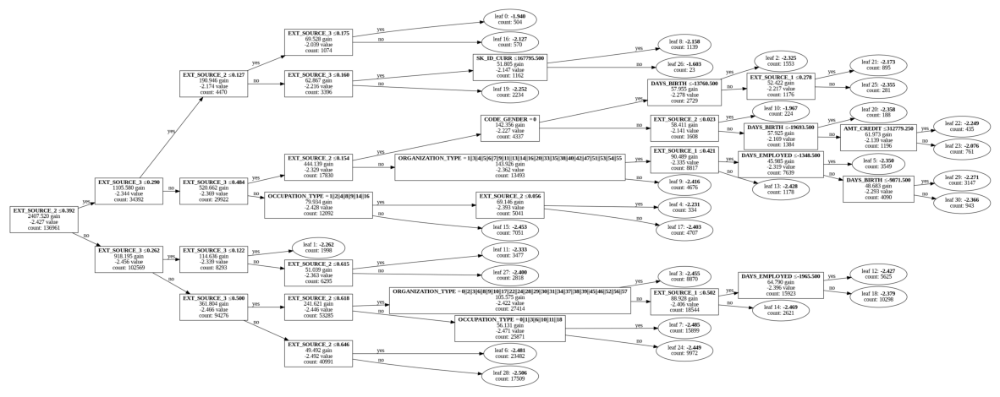

In [ ]:
import matplotlib.pyplot as plt
import graphviz
import pickle
# モデルを保存します
model.save_model('model.txt')

# モデルをロードします
loaded_model = lgb.Booster(model_file='model.txt')

# ツリーを可視化します
tree_index = 0  # 可視化したいツリーのインデックス
fig = lgb.plot_tree(loaded_model, tree_index=tree_index, figsize=(15, 10), show_info=['split_gain', 'internal_value', 'internal_count', 'leaf_count'])

# 画像ファイルとして保存します（dpiを指定して品質を調整）
fig.figure.savefig('tree_image.png', dpi=500)

# ツリーを表示します
plt.show()

# データを分析して新しい特徴量を生成する

#データの取得

In [ ]:
#kaggle.jsonをGoogle Drive からひっぱってくるやつ
from googleapiclient.discovery import build
import io, os
from googleapiclient.http import MediaIoBaseDownload
from google.colab import auth

auth.authenticate_user()

drive_service = build('drive', 'v3')
results = drive_service.files().list(
        q="name = 'kaggle.json'", fields="files(id)").execute()
kaggle_api_key = results.get('files', [])

filename = "/root/.kaggle/kaggle.json"
os.makedirs(os.path.dirname(filename), exist_ok=True)

request = drive_service.files().get_media(fileId=kaggle_api_key[0]['id'])
fh = io.FileIO(filename, 'wb')
downloader = MediaIoBaseDownload(fh, request)
done = False
while done is False:
    status, done = downloader.next_chunk()
    print("Download %d%%." % int(status.progress() * 100))
os.chmod(filename, 600)

In [ ]:
!pip install kaggle -q

In [ ]:
!kaggle competitions download -c home-credit-default-risk
#--competition-id=269 --path='move/'

100% 685M/688M [00:30<00:00, 23.7MB/s]
100% 688M/688M [00:30<00:00, 23.7MB/s]


In [ ]:
import shutil
shutil.unpack_archive('home-credit-default-risk.zip')

# データの読み込み

In [ ]:
import pandas as pd

# CSVファイルの読み込み
application_train = pd.read_csv('application_train.csv')
application_test = pd.read_csv('application_test.csv')
bureau = pd.read_csv('bureau.csv')
bureau_balance = pd.read_csv('bureau_balance.csv')
previous_application = pd.read_csv('previous_application.csv')
credit_card_balance = pd.read_csv('credit_card_balance.csv')
installments_payments = pd.read_csv('installments_payments.csv')
POS_CASH_balance = pd.read_csv('POS_CASH_balance.csv')

# データの基本的な統計を表示
print(application_train.describe())
print(application_test.describe())
print(bureau.describe())
print(bureau_balance.describe())
print(previous_application.describe())
print(credit_card_balance.describe())
print(installments_payments.describe())
print(POS_CASH_balance.describe())


          SK_ID_CURR         TARGET   CNT_CHILDREN  AMT_INCOME_TOTAL  \
count  307511.000000  307511.000000  307511.000000      3.075110e+05   
mean   278180.518577       0.080729       0.417052      1.687979e+05   
std    102790.175348       0.272419       0.722121      2.371231e+05   
min    100002.000000       0.000000       0.000000      2.565000e+04   
25%    189145.500000       0.000000       0.000000      1.125000e+05   
50%    278202.000000       0.000000       0.000000      1.471500e+05   
75%    367142.500000       0.000000       1.000000      2.025000e+05   
max    456255.000000       1.000000      19.000000      1.170000e+08   

         AMT_CREDIT    AMT_ANNUITY  AMT_GOODS_PRICE  \
count  3.075110e+05  307499.000000     3.072330e+05   
mean   5.990260e+05   27108.573909     5.383962e+05   
std    4.024908e+05   14493.737315     3.694465e+05   
min    4.500000e+04    1615.500000     4.050000e+04   
25%    2.700000e+05   16524.000000     2.385000e+05   
50%    5.135310e+05  

train,testデータで見比べるべきこと：データの分布が同じになっているか？


In [ ]:
bureau

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN


In [ ]:
application_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
application_test

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,3.0,1.0
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


# 欠損値の可視化

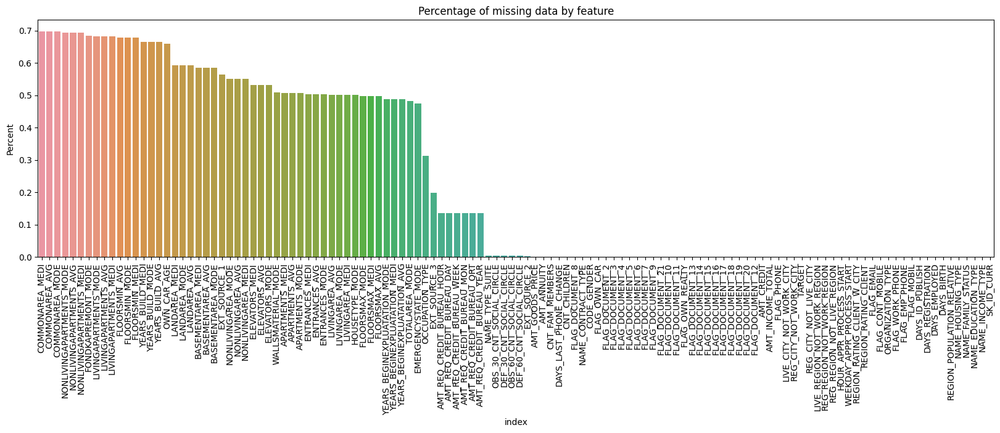

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

for df in [application_train]:

    missing_values = df.isnull().sum().sort_values(ascending=False)
    percent_missing = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)

    missing_data = pd.concat([missing_values, percent_missing], axis=1, keys=['Total', 'Percent'])
    missing_data.head(20)

    plt.figure(figsize=(20, 5))
    sns.barplot(x='index', y='Percent', data=missing_data.reset_index())
    plt.xticks(rotation=90)
    plt.title('Percentage of missing data by feature')
    plt.show()


In [ ]:
print(application_test.columns)

Index(['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=121)


In [ ]:
application_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
X = application_train[application_train.describe().columns].drop('TARGET', axis=1)
y = application_train['TARGET']

In [ ]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split

# データの分割
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# LightGBMのデータセットを作成
lgb_train = lgb.Dataset(X_train, label=y_train)
lgb_valid = lgb.Dataset(X_valid, label=y_valid)

# LightGBMのパラメータ設定
params = {
    'objective': 'binary',
    'metric': 'binary_logloss',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': -1
}

# early stoppingコールバックの設定
early_stopping = lgb.early_stopping(stopping_rounds=10)

# log_evaluationコールバックの設定
log_evaluation = lgb.log_evaluation(period=10)

# LightGBMモデルの学習
model = lgb.train(params, lgb_train, num_boost_round=1000,
                  valid_sets=[lgb_train, lgb_valid],
                  early_stopping_rounds=10,
                  callbacks=[early_stopping, log_evaluation])

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


Training until validation scores don't improve for 10 rounds
[10]	training's binary_logloss: 0.264063	valid_1's binary_logloss: 0.263925
[20]	training's binary_logloss: 0.256924	valid_1's binary_logloss: 0.257321
[30]	training's binary_logloss: 0.252963	valid_1's binary_logloss: 0.253864
[40]	training's binary_logloss: 0.250443	valid_1's binary_logloss: 0.251867
[50]	training's binary_logloss: 0.248469	valid_1's binary_logloss: 0.250544
[60]	training's binary_logloss: 0.24693	valid_1's binary_logloss: 0.249618
[70]	training's binary_logloss: 0.245538	valid_1's binary_logloss: 0.248928
[80]	training's binary_logloss: 0.244446	valid_1's binary_logloss: 0.248432
[90]	training's binary_logloss: 0.24344	valid_1's binary_logloss: 0.248116
[100]	training's binary_logloss: 0.242526	valid_1's binary_logloss: 0.247814
[110]	training's binary_logloss: 0.241587	valid_1's binary_logloss: 0.24758
[120]	training's binary_logloss: 0.240728	valid_1's binary_logloss: 0.247481
[130]	training's binary_log

In [ ]:
X_test = application_test[X.columns]

In [ ]:
# モデルの予測
y_pred = model.predict(X_test)

In [ ]:
import pandas as pd

# sample_submission.csvの読み込み
submission = pd.read_csv('sample_submission.csv')

# 予測結果を置換
submission['TARGET'] = y_pred

# 置換した結果をCSVファイルとして保存
submission.to_csv('submission.csv', index=False)


In [ ]:
submission

,SK_ID_CURR,TARGET
0,100001,0.044294
1,100005,0.073444
2,100013,0.021105
3,100028,0.029949
4,100038,0.177917
...,...,...
48739,456221,0.030144
48740,456222,0.097866
48741,456223,0.030874
48742,456224,0.068367


In [ ]:
!kaggle competitions submit -c home-credit-default-risk -f submission.csv -m "merge"

100% 1.26M/1.26M [00:03<00:00, 356kB/s]
Successfully submitted to Home Credit Default Risk

# 2回目

In [ ]:

# Import necessary libraries
import pandas as pd

# Load the training data, test data, and additional data files
train = pd.read_csv('application_train.csv')
test = pd.read_csv('application_test.csv')
pos_cash_balance = pd.read_csv('POS_CASH_balance.csv')
credit_card_balance = pd.read_csv('credit_card_balance.csv')
previous_application = pd.read_csv('previous_application.csv')
installments_payments = pd.read_csv('installments_payments.csv')

# Aggregate the additional data files for each SK_ID_CURR (client)
pos_cash_balance_agg = pos_cash_balance.groupby('SK_ID_CURR').agg(['mean', 'max', 'min', 'sum']).reset_index()
credit_card_balance_agg = credit_card_balance.groupby('SK_ID_CURR').agg(['mean', 'max', 'min', 'sum']).reset_index()
previous_application_agg = previous_application.groupby('SK_ID_CURR').agg(['mean', 'max', 'min', 'sum']).reset_index()
installments_payments_agg = installments_payments.groupby('SK_ID_CURR').agg(['mean', 'max', 'min', 'sum']).reset_index()

# Merge the aggregated additional data with the training and test data
train = pd.merge(train, pos_cash_balance_agg, on='SK_ID_CURR', how='left')
train = pd.merge(train, credit_card_balance_agg, on='SK_ID_CURR', how='left')
train = pd.merge(train, previous_application_agg, on='SK_ID_CURR', how='left')
train = pd.merge(train, installments_payments_agg, on='SK_ID_CURR', how='left')

test = pd.merge(test, pos_cash_balance_agg, on='SK_ID_CURR', how='left')
test = pd.merge(test, credit_card_balance_agg, on='SK_ID_CURR', how='left')
test = pd.merge(test, previous_application_agg, on='SK_ID_CURR', how='left')
test = pd.merge(test, installments_payments_agg, on='SK_ID_CURR', how='left')

<ipython-input-6-795b5bdaf5c8>:13: FutureWarning: ['NAME_CONTRACT_STATUS'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  pos_cash_balance_agg = pos_cash_balance.groupby('SK_ID_CURR').agg(['mean', 'max', 'min', 'sum']).reset_index()
<ipython-input-6-795b5bdaf5c8>:14: FutureWarning: ['NAME_CONTRACT_STATUS'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  credit_card_balance_agg = credit_card_balance.groupby('SK_ID_CURR').agg(['mean', 'max', 'min', 'sum']).reset_index()
<ipython-input-6-795b5bdaf5c8>:15: FutureWarning: ['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_T

In [ ]:
train.shape

(307511, 338)

In [ ]:
test.shape

(48744, 337)

In [ ]:

# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier
from sklearn.preprocessing import LabelEncoder

# Load the training data and test data
train = pd.read_csv('application_train.csv')
test = pd.read_csv('application_test.csv')

# Fill missing values with a special value
train.fillna(-999, inplace=True)
test.fillna(-999, inplace=True)

# Convert categorical features to integers
for f in train.columns:
    if train[f].dtype=='object':
        lbl = LabelEncoder()
        lbl.fit(list(train[f].values) + list(test[f].values))
        train[f] = lbl.transform(list(train[f].values))
        test[f] = lbl.transform(list(test[f].values))

# Split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(train.drop('TARGET', axis=1), train['TARGET'], test_size=0.2, random_state=42)

# Create a LightGBM model
model = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.1,
    num_leaves=123,
    colsample_bytree=.8,
    subsample=.9,
    max_depth=15,
    reg_alpha=.1,
    reg_lambda=.1,
    min_split_gain=.01,
    min_child_weight=2
)

# Train the model
model.fit(
    X_train,
    y_train,
    eval_set= [(X_train, y_train), (X_val, y_val)],
    verbose=100,
    early_stopping_rounds=100
)

# Make predictions
predictions = model.predict_proba(test)[:, 1]

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	training's binary_logloss: 0.202772	valid_1's binary_logloss: 0.246654


In [ ]:

# Import necessary libraries
import pandas as pd
from kaggle.api.kaggle_api_extended import KaggleApi

# Load the sample submission file
submission = pd.read_csv('sample_submission.csv')

# Fill the target column with the predictions
submission['TARGET'] = predictions

In [ ]:
submission

,SK_ID_CURR,TARGET
0,100001,0.033257
1,100005,0.110999
2,100013,0.016963
3,100028,0.038563
4,100038,0.164595
...,...,...
48739,456221,0.020651
48740,456222,0.086251
48741,456223,0.024717
48742,456224,0.028304


In [ ]:

# Save the submission file
submission.to_csv('submission.csv', index=False)

# Submit the predictions to Kaggle
api = KaggleApi()
api.competition_submit('submission.csv', 'My submission message', 'home-credit-default-risk')

ApiException: ignored

#簡単なシミュレーション

In [ ]:

import lightgbm as lgb
import pandas as pd

# データの読み込み
train_data = pd.read_csv('/content/application_train.csv')
test_data = pd.read_csv('/content/application_test.csv')

# 特徴量とターゲットの分割
X_train = train_data.drop('TARGET', axis=1)
y_train = train_data['TARGET']

# LightGBMのデータセットに変換
train_dataset = lgb.Dataset(X_train, label=y_train)

# LightGBMのパラメータ設定
params = {
    'objective': 'binary',
    'metric': 'auc',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 0
}

# モデルのトレーニング
model = lgb.train(params, train_dataset, num_boost_round=100)

# テストデータの予測
predictions = model.predict(test_data)

# 予測結果の表示
print(predictions)

ValueError: ignored

In [ ]:

import lightgbm as lgb
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# データの読み込み
train_data = pd.read_csv('/content/application_train.csv')
test_data = pd.read_csv('/content/application_test.csv')

# ラベルエンコーダの作成
label_encoder = LabelEncoder()

# カテゴリカルな特徴量をラベルエンコーディング
for feature in ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']:
    train_data[feature] = label_encoder.fit_transform(train_data[feature].astype(str))
    test_data[feature] = label_encoder.transform(test_data[feature].astype(str))

# 特徴量とターゲットの分割
X_train = train_data.drop('TARGET', axis=1)
y_train = train_data['TARGET']

# カテゴリカルな特徴量を指定
categorical_features = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']

# LightGBMのデータセットに変換
train_dataset = lgb.Dataset(X_train, label=y_train, categorical_feature=categorical_features)

# LightGBMのパラメータ設定
params = {
    'objective': 'binary',
    'metric': 'auc',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 0
}

# モデルのトレーニング
model = lgb.train(params, train_dataset, num_boost_round=100)

# テストデータの予測
predictions = model.predict(test_data)

# 予測結果の表示
print(predictions)

/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 1.368885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[0.04967567 0.11537017 0.02747239 ... 0.04206028 0.06473037 0.17827261]


# GCIのデータ1

In [ ]:
df = pd.read_csv('train.csv')

In [ ]:
df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0,Cash loans,F,N,N,0,112500.0,755190.0,36328.5,...,NaN,0.0,0.0,0.0,0.0,-292.0,NaN,NaN,NaN,NaN
1,1,0,Cash loans,F,N,Y,0,225000.0,585000.0,16893.0,...,0.553165,0.0,0.0,0.0,0.0,-617.0,0.0,0.0,0.0,1.0
2,2,0,Cash loans,F,N,Y,0,54000.0,334152.0,18256.5,...,NaN,4.0,0.0,4.0,0.0,-542.0,NaN,NaN,NaN,NaN
3,3,0,Cash loans,F,N,Y,0,67500.0,152820.0,8901.0,...,0.767523,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,1,Cash loans,M,N,N,0,157500.0,271066.5,21546.0,...,0.669057,0.0,0.0,0.0,0.0,-1243.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10154,10154,1,Cash loans,M,N,Y,0,112500.0,136287.0,10894.5,...,NaN,1.0,0.0,1.0,0.0,-2109.0,0.0,0.0,0.0,7.0
10155,10155,0,Cash loans,F,Y,Y,0,81000.0,590337.0,25141.5,...,0.517297,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
10156,10156,1,Cash loans,M,N,N,0,81180.0,405000.0,15556.5,...,0.320163,3.0,1.0,3.0,1.0,-755.0,0.0,1.0,1.0,0.0
10157,10157,0,Cash loans,F,N,N,2,225000.0,900000.0,25924.5,...,NaN,2.0,1.0,2.0,1.0,-1977.0,0.0,0.0,0.0,2.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10159 entries, 0 to 10158
Data columns (total 51 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   SK_ID_CURR                   10159 non-null  int64  
 1   TARGET                       10159 non-null  int64  
 2   NAME_CONTRACT_TYPE           10159 non-null  object 
 3   CODE_GENDER                  10159 non-null  object 
 4   FLAG_OWN_CAR                 8147 non-null   object 
 5   FLAG_OWN_REALTY              8147 non-null   object 
 6   CNT_CHILDREN                 10159 non-null  int64  
 7   AMT_INCOME_TOTAL             10159 non-null  float64
 8   AMT_CREDIT                   10159 non-null  float64
 9   AMT_ANNUITY                  10159 non-null  float64
 10  AMT_GOODS_PRICE              10150 non-null  float64
 11  NAME_TYPE_SUITE              10116 non-null  object 
 12  NAME_INCOME_TYPE             10158 non-null  object 
 13  NAME_EDUCATION_T

In [ ]:

import lightgbm as lgb
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# データ読み込み
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')

# ラベルエンコーダの作成
label_encoder = LabelEncoder()

# カテゴリカルな特徴量をラベルエンコーディング
for feature in [test_data.describe(include='O')]:
    train_data[feature] = label_encoder.fit_transform(train_data[feature].astype(str))
    test_data[feature] = label_encoder.transform(test_data[feature].astype(str))

# 特徴量とターゲットの分割
X_train = train_data.drop('TARGET', axis=1)
y_train = train_data['TARGET']

# カテゴリカルな特徴量を指定
categorical_features = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']

# LightGBMのデータセットに変換
train_dataset = lgb.Dataset(X_train, label=y_train, categorical_feature=categorical_features)

# LightGBMのパラメータ設定
params = {
    'objective': 'binary',
    'metric': 'auc',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 0
}

# モデルのトレーニング
model = lgb.train(params, train_dataset, num_boost_round=100)

# テストデータの予測
predictions = model.predict(test_data)

# 予測結果の表示
print(predictions)

ValueError: ignored

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score

# データの読み込み (仮定としてdataという変数名でデータが読み込まれているとします)

# カテゴリ変数のエンコーディング
data = pd.get_dummies(df)

# 欠損値の処理
imputer = SimpleImputer(strategy='mean')
data_imputed = imputer.fit_transform(data)

# DataFrameに戻す
data_imputed = pd.DataFrame(data_imputed, columns=data.columns)

# 特徴量と目的変数に分割
X = data_imputed.drop(columns=['TARGET'])
y = data_imputed['TARGET']

# 訓練データとテストデータに分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# スケーリング
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# モデルの訓練
model = LGBMClassifier()
model.fit(X_train, y_train)

# 予測と評価
y_pred_proba = model.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_pred_proba)
print(f"AUC-ROC score: {auc_score}")


AUC-ROC score: 0.6928291945918723


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import lightgbm as lgb

# データ読み込み
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')

# ターゲット変数を分割
y = train_data['TARGET']
train_data.drop('TARGET', axis=1, inplace=True)

# trainとtestを連結
all_data = pd.concat([train_data, test_data], axis=0)

# カテゴリ変数のリストを取得
categorical_cols = all_data.select_dtypes(include=['object']).columns.tolist()

# カテゴリ変数のエンコーディング
all_data = pd.get_dummies(all_data, columns=categorical_cols)

# 欠損値補完やスケーリングなどの前処理を適用
# ...

# trainデータとtestデータに再分割
X_train = all_data.iloc[:train_data.shape[0], :]
X_test = all_data.iloc[train_data.shape[0]:, :]

# trainデータをさらにtrainデータとvalidデータに分割
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y, test_size=0.2, random_state=42)

# LightGBMモデルの作成と学習
params = {
    'objective': 'binary',
    'metric': 'auc',
    'boosting_type': 'gbdt',
    'n_estimators': 1000,
    'learning_rate': 0.1,
    'num_leaves': 31,
    'max_depth': -1,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'random_state': 42
}

model = lgb.LGBMClassifier(**params)
model.fit(X_train, y_train,
          eval_set=[(X_valid, y_valid)],
          early_stopping_rounds=100,
          verbose=200)

# テストデータの予測
test_preds = model.predict(X_test)

# 提出用データの作成
submission = pd.DataFrame({'SK_ID_CURR': test_data['SK_ID_CURR'], 'TARGET': test_preds})

# データの保存
submission.to_csv('submission.csv', index=False)


/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "


LightGBMError: ignored

In [ ]:
X_train.columns

Index(['SK_ID_CURR', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE',
       'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
       ...
       'ORGANIZATION_TYPE_Trade: type 4', 'ORGANIZATION_TYPE_Trade: type 5',
       'ORGANIZATION_TYPE_Trade: type 6', 'ORGANIZATION_TYPE_Trade: type 7',
       'ORGANIZATION_TYPE_Transport: type 1',
       'ORGANIZATION_TYPE_Transport: type 2',
       'ORGANIZATION_TYPE_Transport: type 3',
       'ORGANIZATION_TYPE_Transport: type 4', 'ORGANIZATION_TYPE_University',
       'ORGANIZATION_TYPE_XNA'],
      dtype='object', length=156)

In [ ]:
X_test.columns

Index(['SK_ID_CURR', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE',
       'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
       ...
       'ORGANIZATION_TYPE_Trade: type 4', 'ORGANIZATION_TYPE_Trade: type 5',
       'ORGANIZATION_TYPE_Trade: type 6', 'ORGANIZATION_TYPE_Trade: type 7',
       'ORGANIZATION_TYPE_Transport: type 1',
       'ORGANIZATION_TYPE_Transport: type 2',
       'ORGANIZATION_TYPE_Transport: type 3',
       'ORGANIZATION_TYPE_Transport: type 4', 'ORGANIZATION_TYPE_University',
       'ORGANIZATION_TYPE_XNA'],
      dtype='object', length=156)

# GCIのデータ2:データを適切に合わせてLightGBM

In [ ]:
train_data = pd.read_csv('train.csv')
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 171202 entries, 0 to 171201
Data columns (total 51 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   171202 non-null  int64  
 1   TARGET                       171202 non-null  int64  
 2   NAME_CONTRACT_TYPE           171202 non-null  object 
 3   CODE_GENDER                  171202 non-null  object 
 4   FLAG_OWN_CAR                 136961 non-null  object 
 5   FLAG_OWN_REALTY              136961 non-null  object 
 6   CNT_CHILDREN                 171202 non-null  int64  
 7   AMT_INCOME_TOTAL             171202 non-null  float64
 8   AMT_CREDIT                   171202 non-null  float64
 9   AMT_ANNUITY                  171196 non-null  float64
 10  AMT_GOODS_PRICE              171039 non-null  float64
 11  NAME_TYPE_SUITE              170455 non-null  object 
 12  NAME_INCOME_TYPE             171202 non-null  object 
 13 

In [ ]:
test_data = pd.read_csv('test.csv')
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61500 entries, 0 to 61499
Data columns (total 50 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   SK_ID_CURR                   61500 non-null  int64  
 1   NAME_CONTRACT_TYPE           61500 non-null  object 
 2   CODE_GENDER                  61500 non-null  object 
 3   FLAG_OWN_CAR                 49166 non-null  object 
 4   FLAG_OWN_REALTY              49166 non-null  object 
 5   CNT_CHILDREN                 61500 non-null  int64  
 6   AMT_INCOME_TOTAL             61500 non-null  float64
 7   AMT_CREDIT                   61500 non-null  float64
 8   AMT_ANNUITY                  61497 non-null  float64
 9   AMT_GOODS_PRICE              61447 non-null  float64
 10  NAME_TYPE_SUITE              61252 non-null  object 
 11  NAME_INCOME_TYPE             61500 non-null  object 
 12  NAME_EDUCATION_TYPE          61500 non-null  object 
 13  NAME_FAMILY_STAT

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMClassifier

# データの読み込み
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')
data = pd.concat([train_data, test_data], axis=0)

# カテゴリ変数のエンコーディング
cat_cols = data.select_dtypes(include='object').columns
for col in cat_cols:
    le = LabelEncoder()
    le.fit(data[col].fillna('NA'))
    data[col] = le.transform(data[col].fillna('NA'))

# trainデータとtestデータの分離
train_data = data.iloc[:len(train_data), :]
test_data = data.iloc[len(train_data):, :].drop(['TARGET'], axis=1)

# 目的変数と特徴量の分割
X = train_data.drop(['TARGET'], axis=1)
y = train_data['TARGET']

# 訓練データと検証データの分割
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# モデルの構築と学習
model = LGBMClassifier()
model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], early_stopping_rounds=100, verbose=100)

# テストデータの予測
preds = model.predict_proba(test_data)[:, 1]

# 提出用ファイルの作成
submission = pd.DataFrame({'SK_ID_CURR': test_data['SK_ID_CURR'], 'TARGET': preds})
submission.to_csv('submission.csv', index=False)

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	valid_0's binary_logloss: 0.250031


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score

# データの読み込み
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')
data = pd.concat([train_data, test_data], axis=0)

# カテゴリ変数のエンコーディング
cat_cols = data.select_dtypes(include='object').columns
for col in cat_cols:
    le = LabelEncoder()
    le.fit(data[col].fillna('NA'))
    data[col] = le.transform(data[col].fillna('NA'))

# trainデータとtestデータの分離
train_data = data.iloc[:len(train_data), :]
test_data = data.iloc[len(train_data):, :].drop(['TARGET'], axis=1)

# 目的変数と特徴量の分割
X = train_data.drop(['TARGET'], axis=1)
y = train_data['TARGET']

# 訓練データと検証データの分割
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)# モデルの構築と学習
model = LGBMClassifier()
model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_valid, y_valid)], early_stopping_rounds=100, verbose=100)

# 訓練データと検証データでの予測結果
train_preds = model.predict_proba(X_train)[:, 1]
valid_preds = model.predict_proba(X_valid)[:, 1]

# 訓練データと検証データの評価指標（AUC）を計算
train_auc = roc_auc_score(y_train, train_preds)
valid_auc = roc_auc_score(y_valid, valid_preds)

print(f"Train AUC: {train_auc:.2f}")
print(f"Valid AUC: {valid_auc:.2f}")

# テストデータの予測
preds = model.predict_proba(test_data)[:, 1]

# 提出用ファイルの作成
submission = pd.DataFrame({'SK_ID_CURR': test_data['SK_ID_CURR'], 'TARGET': preds})
submission.to_csv('submission.csv', index=False)

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	training's binary_logloss: 0.227558	valid_1's binary_logloss: 0.250031
Train AUC: 0.82
Valid AUC: 0.75


In [ ]:
import numpy as np
# 収入の上位25%、50%、75%に基づいて分類する
income_percentiles = train_data['AMT_INCOME_TOTAL'].quantile([0.25, 0.5, 0.75]).values
train_data['INCOME_LEVEL'] = pd.cut(train_data['AMT_INCOME_TOTAL'], bins=[0, income_percentiles[0], income_percentiles[1], income_percentiles[2], np.inf], labels=['Low', 'Medium-Low', 'Medium-High', 'High'])

# データの確認
print(train_data['INCOME_LEVEL'].value_counts())

In [ ]:
# データの読み込み
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')

# カテゴリ変数の組み合わせによる新しい特徴量の作成
train_data['Gender_Education'] = train_data['CODE_GENDER'] + '_' + train_data['NAME_EDUCATION_TYPE']
test_data['Gender_Education'] = test_data['CODE_GENDER'] + '_' + test_data['NAME_EDUCATION_TYPE']

# カテゴリ変数の組み合わせを作成
train_data['Region_Income'] = train_data['REGION'] + '_' + train_data['INCOME_LEVEL']
test_data['Region_Income'] = test_data['REGION'] + '_' + test_data['INCOME_LEVEL']

# グループごとに平均収入を計算
grouped = train_data.groupby('Region_Income')['INCOME'].mean().reset_index()
grouped.columns = ['Region_Income', 'Avg_Income']

# train_dataとtest_dataに平均収入を統合
train_data = train_data.merge(grouped, on='Region_Income', how='left')
test_data = test_data.merge(grouped, on='Region_Income', how='left')

# GCI3

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMClassifier

# データの読み込み
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')

In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75665 entries, 0 to 75664
Data columns (total 51 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   SK_ID_CURR                   75665 non-null  int64  
 1   TARGET                       75665 non-null  int64  
 2   NAME_CONTRACT_TYPE           75665 non-null  object 
 3   CODE_GENDER                  75665 non-null  object 
 4   FLAG_OWN_CAR                 60521 non-null  object 
 5   FLAG_OWN_REALTY              60521 non-null  object 
 6   CNT_CHILDREN                 75665 non-null  int64  
 7   AMT_INCOME_TOTAL             75665 non-null  float64
 8   AMT_CREDIT                   75665 non-null  float64
 9   AMT_ANNUITY                  75662 non-null  float64
 10  AMT_GOODS_PRICE              75585 non-null  float64
 11  NAME_TYPE_SUITE              75336 non-null  object 
 12  NAME_INCOME_TYPE             75665 non-null  object 
 13  NAME_EDUCATION_T

In [ ]:
# SK_ID_CURR: 顧客ID
# TARGET: ターゲット変数（返済能力に基づくクライアントの債務不履行の有無）
# NAME_CONTRACT_TYPE: 契約タイプ
# CODE_GENDER: 性別
# FLAG_OWN_CAR: 自家用車の所有フラグ
# FLAG_OWN_REALTY: 不動産の所有フラグ
# CNT_CHILDREN: 子供の数
# AMT_INCOME_TOTAL: 年収
# AMT_CREDIT: クレジットの金額
# AMT_ANNUITY: 年金の金額
# AMT_GOODS_PRICE: 商品の価格
# NAME_TYPE_SUITE: 同行者の種類
# NAME_INCOME_TYPE: 収入の種類
# NAME_EDUCATION_TYPE: 教育の種類
# NAME_FAMILY_STATUS: 家族の状況
# NAME_HOUSING_TYPE: 住宅のタイプ
# REGION_POPULATION_RELATIVE: 地域の人口相対値
# DAYS_BIRTH: 誕生日からの日数
# DAYS_EMPLOYED: 雇用からの日数
# DAYS_REGISTRATION: 登録からの日数
# DAYS_ID_PUBLISH: 公表からの日数
# OWN_CAR_AGE: 車の年齢
# FLAG_MOBIL: 携帯電話の所有フラグ
# FLAG_EMP_PHONE: 雇用電話の所有フラグ
# FLAG_WORK_PHONE: 勤務電話の所有フラグ
# FLAG_CONT_MOBILE: 携帯電話連絡先フラグ
# FLAG_PHONE: 電話連絡先フラグ
# FLAG_EMAIL: メール連絡先フラグ
# OCCUPATION_TYPE: 職業タイプ
# CNT_FAM_MEMBERS: 家族の人数
# REGION_RATING_CLIENT: クライアントの居住地域の評価
# REGION_RATING_CLIENT_W_CITY: クライアントの居住地域（都市）の評価
# REG_REGION_NOT_LIVE_REGION: クライアントが居住している地域と異なる地域への登録フラグ
# REG_REGION_NOT_WORK_REGION: クライアントが勤務している地域と異なる地域への登録フラグ
# LIVE_REGION_NOT_WORK_REGION: クライアントが居住している地域と勤務している地域が異なるフラグ
# REG_CITY_NOT_LIVE_CITY: クライアントが居住している都市と登録されている都市が異なるフラグ
# REG_CITY_NOT_WORK_CITY: クライアントが勤務している都市と登録されている都市が異なるフラグ
# LIVE_CITY_NOT_WORK_CITY: クライアントが居住している都市と勤務している都市が異なるフラグ
# ORGANIZATION_TYPE: 組織のタイプ
# EXT_SOURCE_1: 外部データソース1
# EXT_SOURCE_2: 外部データソース2
# EXT_SOURCE_3: 外部データソース3
# OBS_30_CNT_SOCIAL_CIRCLE: 直近30日間のソーシャルサークルの観察数
# DEF_30_CNT_SOCIAL_CIRCLE: 直近30日間のソーシャルサークルでのデフォルトの数
# OBS_60_CNT_SOCIAL_CIRCLE: 直近60日間のソーシャルサークルの観察数
# DEF_60_CNT_SOCIAL_CIRCLE: 直近60日間のソーシャルサークルでのデフォルトの数
# DAYS_LAST_PHONE_CHANGE: 最後の電話番号の変更からの日数
# AMT_REQ_CREDIT_BUREAU_HOUR: 信用情報局への問い合わせ（時間毎）
# AMT_REQ_CREDIT_BUREAU_MON: 信用情報局への問い合わせ（月毎）
# AMT_REQ_CREDIT_BUREAU_QRT: 信用情報局への問い合わせ（四半期毎）
# AMT_REQ_CREDIT_BUREAU_YEAR: 信用情報局への問い合わせ（年毎）

重要度の高い項目を抽出

In [ ]:
# 特徴量の重要度の取得
feature_importance = model.feature_importances_

import numpy as np
import matplotlib.pyplot as plt

# 特徴量の値が100以上の特徴量を抽出
selected_features = X_train.columns[feature_importance >= 20]
len(selected_features)

26

In [ ]:
selected_features

Index(['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'OCCUPATION_TYPE', 'REGION_RATING_CLIENT_W_CITY', 'ORGANIZATION_TYPE',
       'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

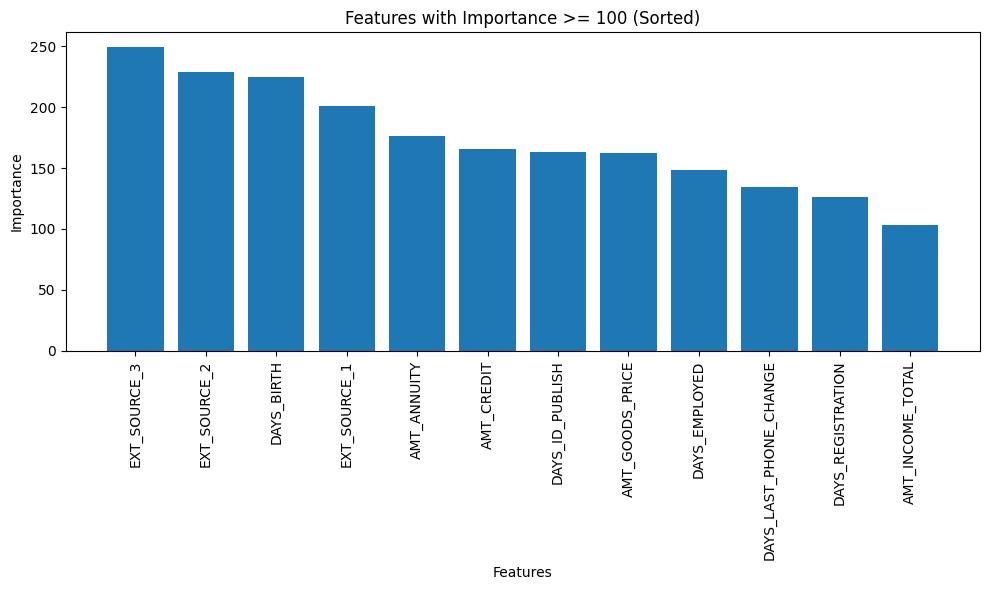

In [ ]:
# 特徴量の重要度の取得
feature_importance = model.feature_importances_

import numpy as np
import matplotlib.pyplot as plt

# 特徴量の値が100以上の特徴量を抽出
selected_features = X_train.columns[feature_importance >= 100]

# 特徴量の重要度を降順にソート
sorted_indices = np.argsort(feature_importance[feature_importance >= 100])[::-1]
sorted_features = selected_features[sorted_indices]

# 特徴量の値が100以上の特徴量を可視化
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_features)), feature_importance[feature_importance >= 100][sorted_indices])
plt.xticks(range(len(sorted_features)), sorted_features, rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Features with Importance >= 100 (Sorted)')
plt.tight_layout()
plt.show()

データ分析でのサンプリング
データの分布と特性:

1. 偏りのない一般的な特徴の分布の場合: 10,000件以上
分布に偏りや極端な値がある場合: 20,000件以上
クラスの不均衡がある場合: 各クラスに数千件以上のサンプルがあることが望ましい
分析目的:

1. 機械学習モデルのトレーニングや評価: 特徴量ごとに10倍以上のサンプルが望ましい（例: 特徴量数が10の場合、最低でも100件以上のサンプルがあることが望ましい）
特定の特徴量や目的変数に関心がある場合: 関連する特徴量や目的変数の分布や傾向を正確に捉えるために、数千件以上のサンプルが望ましい

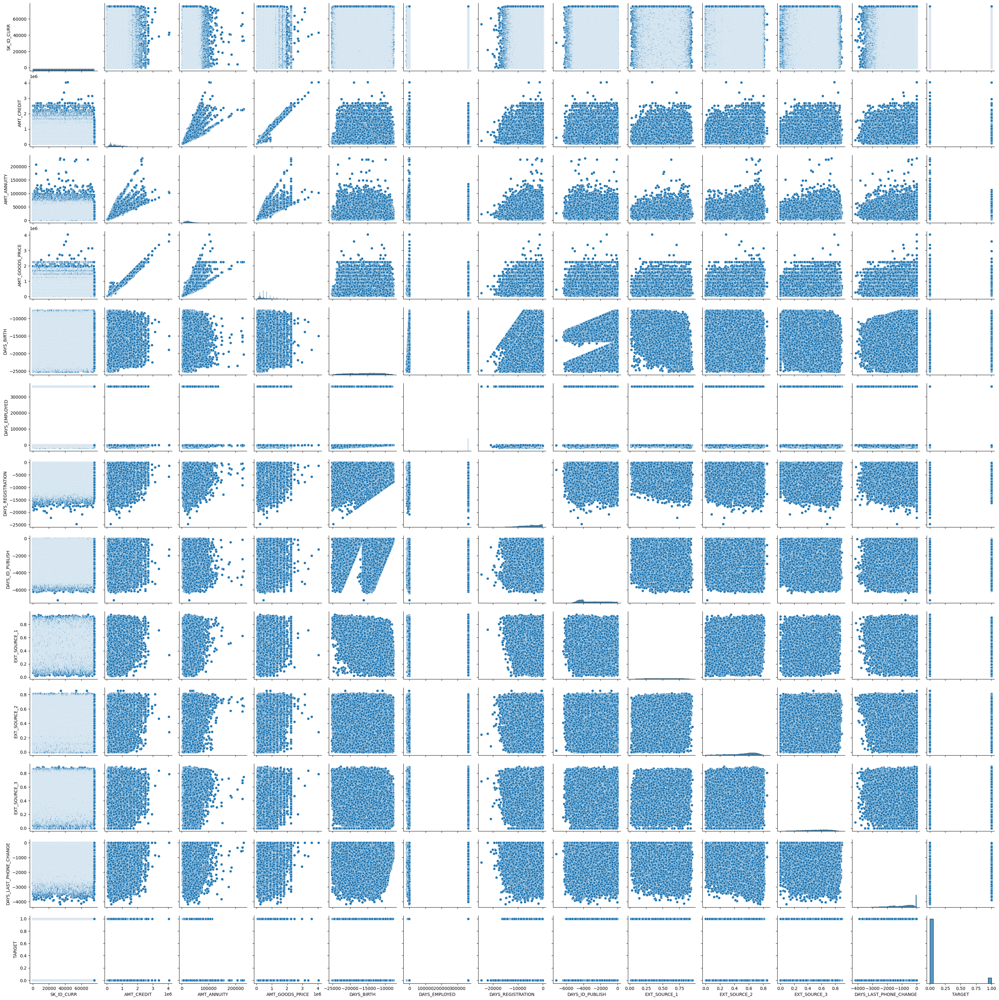

In [ ]:
import seaborn as sns

# データの一部を抽出
data_with_target = train_data[list(selected_features) + ['TARGET']]

# 特徴量間の散布図を作成
sns.pairplot(data_with_target, vars=list(selected_features) + ['TARGET'])
plt.show()

In [ ]:
import seaborn as sns

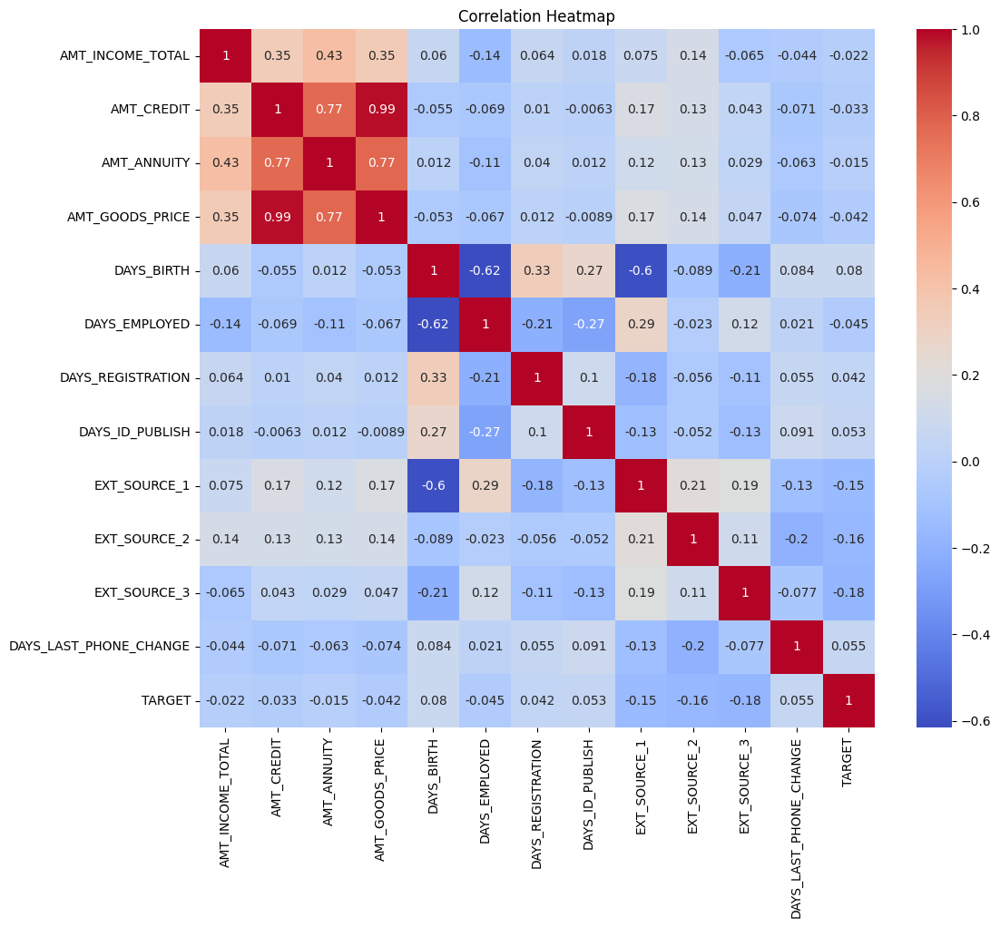

In [ ]:
data_with_target = train_data[list(selected_features) + ['TARGET']]
correlation_matrix = data_with_target.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
data_with_target.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75665 entries, 0 to 75664
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   SK_ID_CURR              75665 non-null  int64  
 1   AMT_CREDIT              75665 non-null  float64
 2   AMT_ANNUITY             75662 non-null  float64
 3   AMT_GOODS_PRICE         75585 non-null  float64
 4   DAYS_BIRTH              75665 non-null  int64  
 5   DAYS_EMPLOYED           75664 non-null  float64
 6   DAYS_REGISTRATION       75664 non-null  float64
 7   DAYS_ID_PUBLISH         75664 non-null  float64
 8   EXT_SOURCE_1            22970 non-null  float64
 9   EXT_SOURCE_2            75498 non-null  float64
 10  EXT_SOURCE_3            51289 non-null  float64
 11  DAYS_LAST_PHONE_CHANGE  75664 non-null  float64
 12  TARGET                  75665 non-null  int64  
dtypes: float64(10), int64(3)
memory usage: 7.5 MB


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score

test_data = test_data[selected_features]
# 目的変数と特徴量の分割
X = data_with_target.drop('TARGET', axis=1)
y = data_with_target['TARGET']

# 訓練データと検証データの分割
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# モデルの構築と学習
model = LGBMClassifier()
model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_valid, y_valid)], early_stopping_rounds=100, verbose=100)

# 訓練データと検証データでの予測結果
train_preds = model.predict_proba(X_train)[:, 1]
valid_preds = model.predict_proba(X_valid)[:, 1]

# 訓練データと検証データの評価指標（AUC）を計算
train_auc = roc_auc_score(y_train, train_preds)
valid_auc = roc_auc_score(y_valid, valid_preds)

print(f"Train AUC: {train_auc:.2f}")
print(f"Valid AUC: {valid_auc:.2f}")

# テストデータの予測
preds = model.predict_proba(test_data)[:, 1]

# 提出用ファイルの作成
submission = pd.read_csv('sample_submission.csv')
submission['TARGET']=preds
display(submission)
submission.to_csv('submission.csv', index=False)

/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	training's binary_logloss: 0.233255	valid_1's binary_logloss: 0.252927
Train AUC: 0.80
Valid AUC: 0.74


,SK_ID_CURR,TARGET
0,171202,0.035520
1,171203,0.238730
2,171204,0.139993
3,171205,0.210358
4,171206,0.222270
...,...,...
61495,232697,0.225234
61496,232698,0.057391
61497,232699,0.041223
61498,232700,0.133081


## データ分析

1. 目的変数
1. 説明変数の組み合わせで目的変数をどの程度説明できるか

## 他社の信用データ

In [ ]:
data_with_target[['EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3']].isnull().sum()

EXT_SOURCE_1    52695
EXT_SOURCE_2      167
EXT_SOURCE_3    24376
dtype: int64

In [ ]:
selected_features

Index(['SK_ID_CURR', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'DAYS_LAST_PHONE_CHANGE'],
      dtype='object')

In [ ]:
# SK_ID_CURR: 顧客ID
# AMT_CREDIT: クレジットの金額
# AMT_ANNUITY: 年金の金額
# AMT_GOODS_PRICE: 商品の価格
# DAYS_BIRTH: 誕生日からの日数
# DAYS_EMPLOYED: 雇用からの日数
# DAYS_REGISTRATION: 登録からの日数
# DAYS_ID_PUBLISH: 公表からの日数
# EXT_SOURCE_1: 外部データソース1
# EXT_SOURCE_2: 外部データソース2
# EXT_SOURCE_3: 外部データソース3
# DAYS_LAST_PHONE_CHANGE: 最後の電話番号の変更からの日数

In [ ]:
train_data = pd.read_csv('train.csv')
train_data[['AMT_CREDIT','TARGET']]

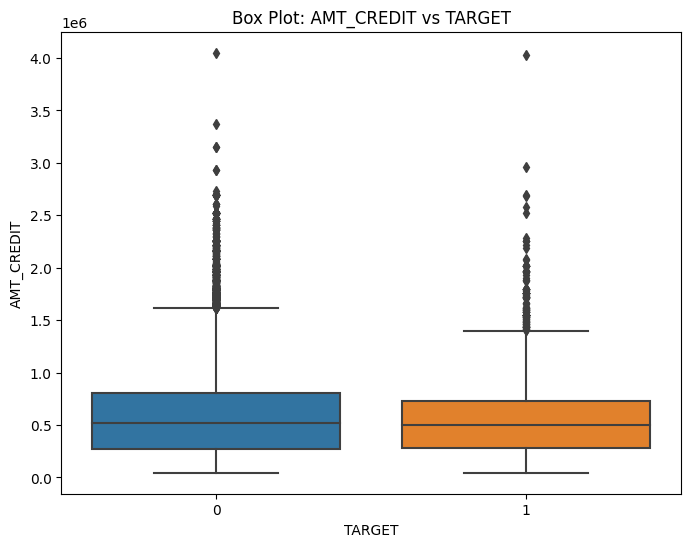

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.boxplot(data=train_data, x='TARGET', y='AMT_CREDIT')
plt.xlabel('TARGET')
plt.ylabel('AMT_CREDIT')
plt.title('Box Plot: AMT_CREDIT vs TARGET')
plt.show()

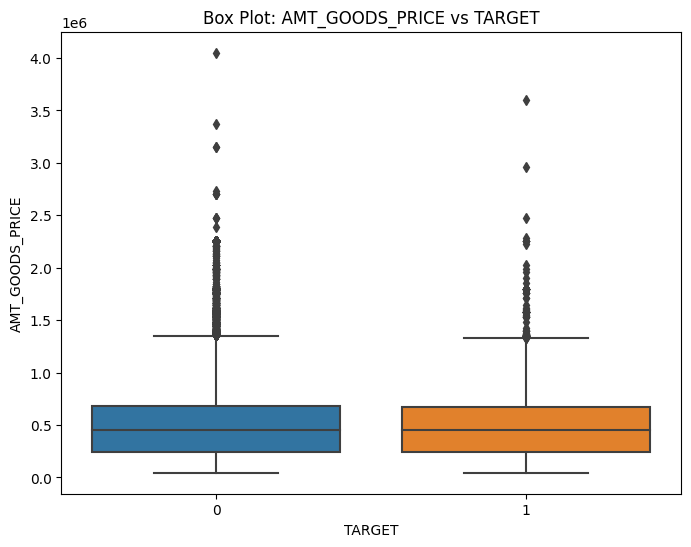

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.boxplot(data=train_data, x='TARGET', y='AMT_GOODS_PRICE')
plt.xlabel('TARGET')
plt.ylabel('AMT_GOODS_PRICE')
plt.title('Box Plot: AMT_GOODS_PRICE vs TARGET')
plt.show()

In [ ]:
train_data['DAYS_BIRTH'].describe()

count    75665.000000
mean    -16028.395427
std       4364.550895
min     -25196.000000
25%     -19665.000000
50%     -15766.000000
75%     -12410.000000
max      -7673.000000
Name: DAYS_BIRTH, dtype: float64

# gci4

In [ ]:
selected_features = X_train.columns[feature_importance >= 0]
len(selected_features)

12

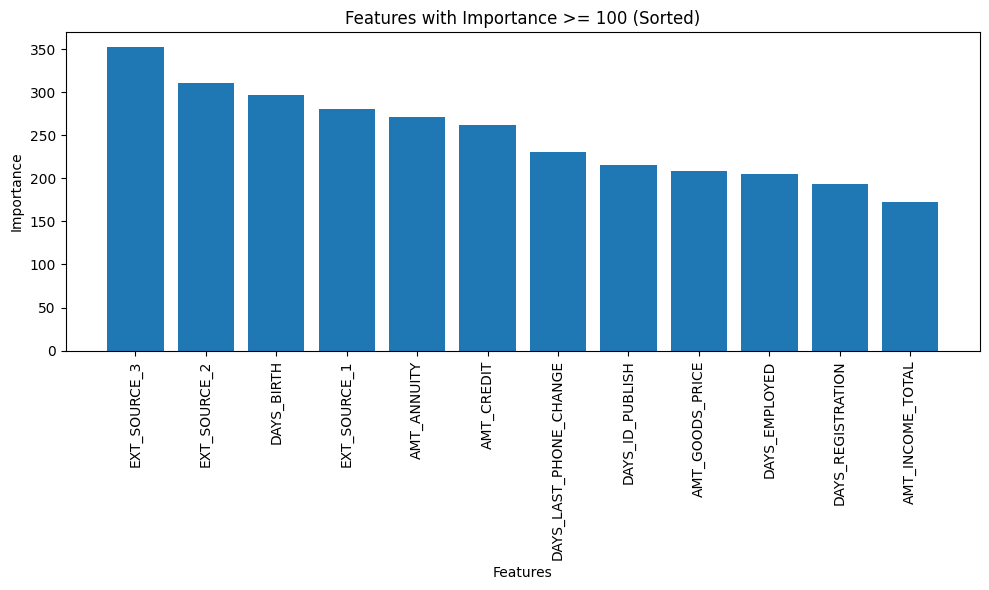

In [ ]:
# 特徴量の重要度の取得
feature_importance = model.feature_importances_

import numpy as np
import matplotlib.pyplot as plt

# 特徴量の値が50以上の特徴量を抽出
selected_features = X_train.columns[feature_importance >= 30]

# 特徴量の重要度を降順にソート
sorted_indices = np.argsort(feature_importance[feature_importance >= 50])[::-1]
sorted_features = selected_features[sorted_indices]

# 特徴量の値が100以上の特徴量を可視化
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_features)), feature_importance[feature_importance >= 50][sorted_indices])
plt.xticks(range(len(sorted_features)), sorted_features, rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Features with Importance >= 100 (Sorted)')
plt.tight_layout()
plt.show()

In [ ]:
len(selected_features)

26

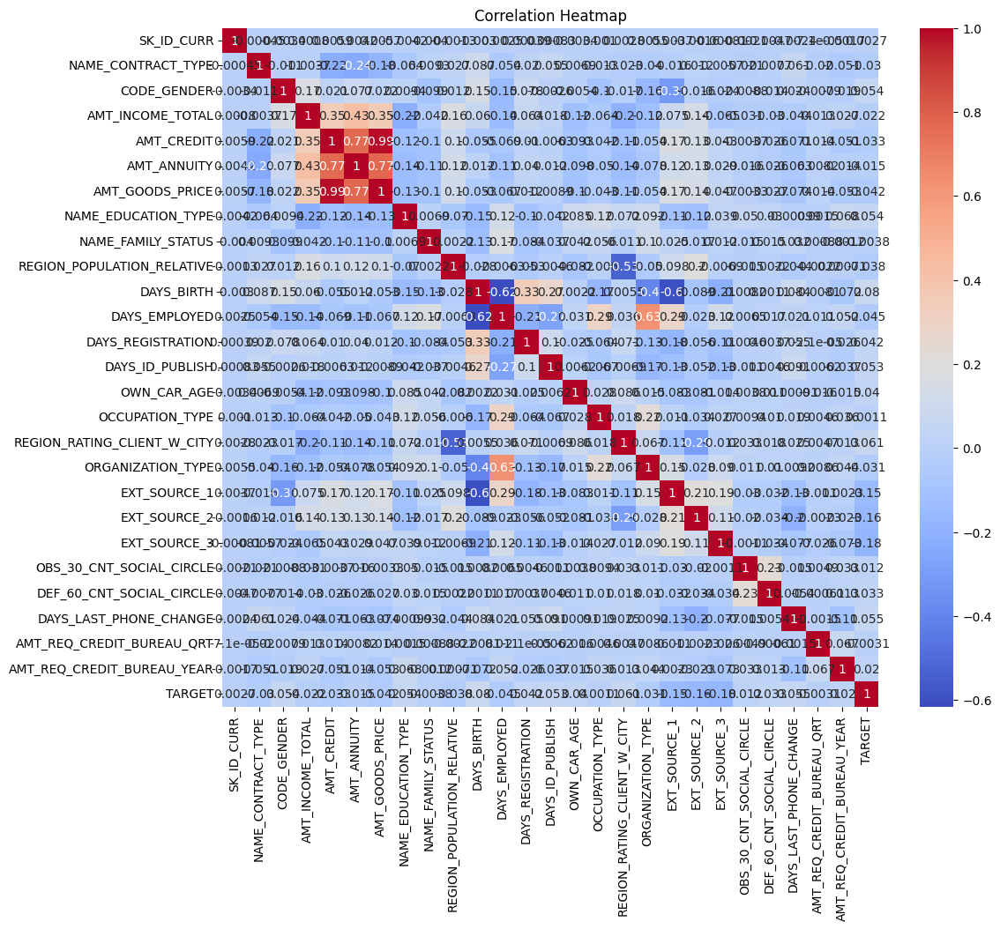

In [ ]:
data_with_target = train_data[list(selected_features) + ['TARGET']]
correlation_matrix = data_with_target.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

## 特徴量の数を絞る

In [ ]:
from matplotlib.colors import ListedColormap

def plot_boundary(model, X, Y, target, xlabel, ylabel):
    cmap_dots = ListedColormap(["#1f77b4","#ff7f0e","#2ca02c"])
    cmap_fills = ListedColormap(["#c6dcec","#ffdec2","#cae7ca"])
    plt.figure(figsize=(5,5))

    if model:
        XX,YY=np.meshgrid(
            np.linspace(X.min()-1, X.max()+1, 200),
            np.linspace(X.min()-1, X.max()+1, 200))
        pred = model.predict(np.c_[XX.ravel(), YY.ravel()]).reshape(XX.shape)
        plt.contour(XX,YY,pred,colors="gray")
    plt.scatter(X,Y,c=target,cmap=cmap_dots)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()



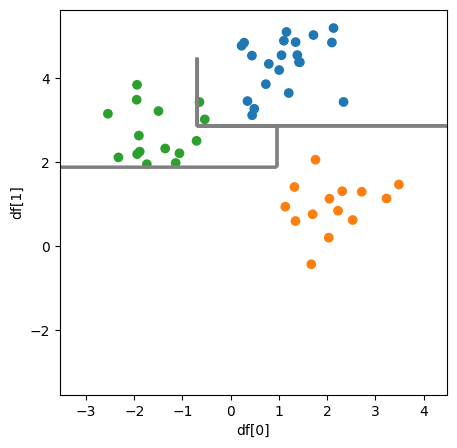

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import pandas as pd
import numpy as np

X,y = make_blobs(
    random_state=0,
    n_features=2,
    centers=3,
    cluster_std=0.6,
    n_samples=200
)

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=0)

model = DecisionTreeClassifier(max_depth=None, random_state=0)
model.fit(X_train, y_train)

pred = model.predict(X_test)
score = accuracy_score(y_test, pred)

df = pd.DataFrame(X_test)
plot_boundary(model, df[0],df[1],y_test,"df[0]","df[1]")

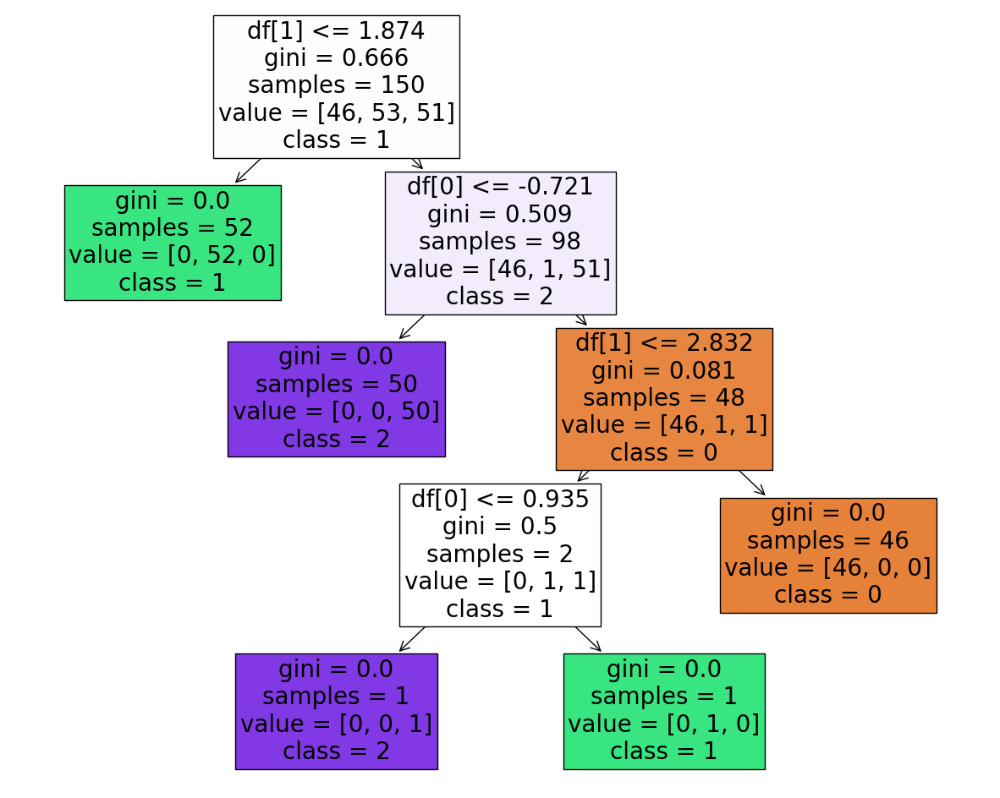

In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(15,12))
plot_tree(model, fontsize=20, filled=True,
          feature_names=["df[0]","df[1]"],
          class_names=["0","1","2"])
plt.show()

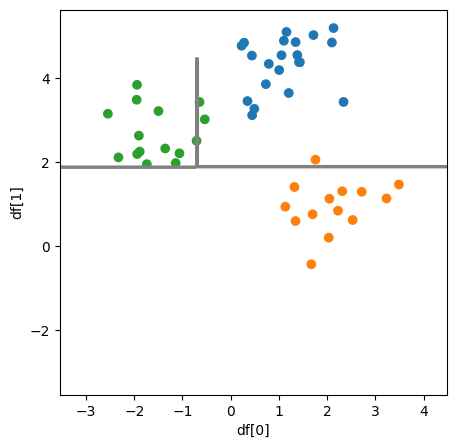

In [ ]:
model =DecisionTreeClassifier(max_depth=2,random_state=0)
model.fit(X_train, y_train)

pred = model.predict(X_test)
score = accuracy_score(y_test, pred)

df = pd.DataFrame(X_test)
plot_boundary(model,df[0],df[1],y_test,"df[0]","df[1]")

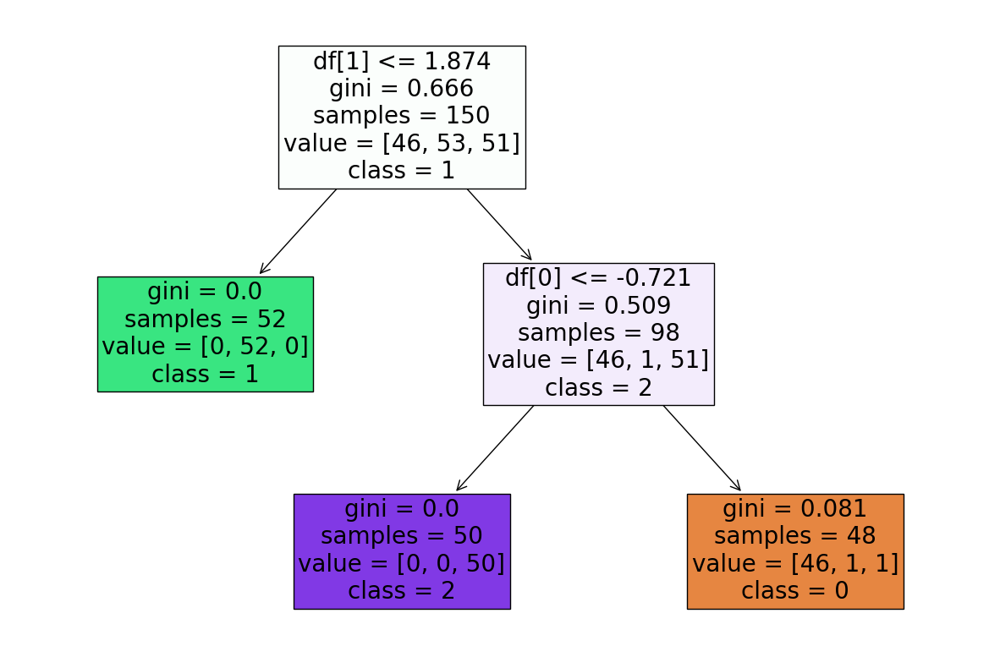

In [ ]:
from sklearn.tree import plot_tree

plt.figure(figsize=(15,10))
plot_tree(model,fontsize=20, filled=True,
          feature_names =["df[0]","df[1]"],
          class_names=["0","1","2"])
plt.show()

In [ ]:
df

,0,1
0,0.488382,3.268018
1,0.443599,3.115309
2,0.438990,4.535929
3,-1.939607,2.189436
4,-2.545768,3.150251
5,2.311023,1.303808
6,-1.062952,2.207554
7,-1.949724,3.483839
8,1.432893,4.376792
9,-1.942134,3.839708


# EDA

どのような前処理をするか決めるためにデータ分析をする

## 多重共線性を外す

## 箱ひげ図で外れ値が重なっている物を除外する

## 欠損値を適切に処理する：モデルやデータの特性を考慮する

## 間違い値の修正：明らかな間違いは適切に修正

対数変換や平方根変換などは、分布を正規化するのによく使用されます

# ChatGPT

自分がどのようにデータを見て行けば深く考えられるかを明確にする  
A. 全体から
1. カラム数を絞る
2. 目的変数との関係を確認する(独立と言えるかどうか)
3. 目的変数(カテゴリ)に対する説明変数の関係を確認する(カテゴリ:棒グラフ、数値:箱ひげ図)
4.

B. 部分から
1. 気になる変数から見ていく
1. 関連のありそうな変数を一緒に考える

## データ分析のための機械学習

データ分析
1. 最小限の前処理と決定木分析(LightGBM)で数を絞る
1. ヒストグラム(分布を見る)、散布図(数値データ同士)、箱ひげ図(目的変数(カテゴリーデータ)と数値データの比較で外れ値を検出)、
ペアプロットやヒートマップを見て相関の強い変数を確認する
1. 新しい特徴量を作る

In [ ]:
import pandas as pd
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [ ]:
y_col=list(train.columns)
for i in list(test.columns):
    y_col.remove(i)
y_col

['TARGET']

In [ ]:
data = pd.concat([train,test], axis=0)

In [ ]:
data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0.0,Cash loans,F,N,N,0,112500.0,755190.0,36328.5,...,NaN,0.0,0.0,0.0,0.0,-292.0,NaN,NaN,NaN,NaN
1,1,0.0,Cash loans,F,N,Y,0,225000.0,585000.0,16893.0,...,0.553165,0.0,0.0,0.0,0.0,-617.0,0.0,0.0,0.0,1.0
2,2,0.0,Cash loans,F,N,Y,0,54000.0,334152.0,18256.5,...,NaN,4.0,0.0,4.0,0.0,-542.0,NaN,NaN,NaN,NaN
3,3,0.0,Cash loans,F,N,Y,0,67500.0,152820.0,8901.0,...,0.767523,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,1.0,Cash loans,M,N,N,0,157500.0,271066.5,21546.0,...,0.669057,0.0,0.0,0.0,0.0,-1243.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61495,232697,NaN,Cash loans,F,Y,Y,0,315000.0,1288350.0,37800.0,...,0.307737,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,1.0,1.0
61496,232698,NaN,Cash loans,F,NaN,NaN,0,90000.0,273636.0,15408.0,...,0.434733,0.0,0.0,0.0,0.0,-2732.0,0.0,0.0,0.0,0.0
61497,232699,NaN,Cash loans,F,N,Y,0,144000.0,291384.0,26725.5,...,NaN,0.0,0.0,0.0,0.0,-615.0,0.0,0.0,1.0,0.0
61498,232700,NaN,Cash loans,F,N,Y,1,193500.0,746280.0,59094.0,...,NaN,2.0,0.0,2.0,0.0,-1610.0,0.0,0.0,1.0,3.0


In [ ]:
data.shape

(232702, 51)

In [ ]:
categorical_features=list(data.describe(include=['O']).columns)
print(categorical_features)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']


In [ ]:
from sklearn import preprocessing
labels={}
for column in categorical_features:
    # print(train[column].shape)
    le= preprocessing.LabelEncoder()
    le.fit(data[column].astype(str))
    label={column:list(le.classes_)}
    labels.update(label)
    data[column]=le.transform(data[column].astype(str))

In [ ]:
labels

{'NAME_CONTRACT_TYPE': ['Cash loans', 'Revolving loans'],
 'CODE_GENDER': ['F', 'M', 'XNA'],
 'FLAG_OWN_CAR': ['N', 'Y', 'nan'],
 'FLAG_OWN_REALTY': ['N', 'Y', 'nan'],
 'NAME_TYPE_SUITE': ['Children',
  'Family',
  'Group of people',
  'Other_A',
  'Other_B',
  'Spouse, partner',
  'Unaccompanied',
  'nan'],
 'NAME_INCOME_TYPE': ['Businessman',
  'Commercial associate',
  'Maternity leave',
  'Pensioner',
  'State servant',
  'Student',
  'Unemployed',
  'Working'],
 'NAME_EDUCATION_TYPE': ['Academic degree',
  'Higher education',
  'Incomplete higher',
  'Lower secondary',
  'Secondary / secondary special'],
 'NAME_FAMILY_STATUS': ['Civil marriage',
  'Married',
  'Separated',
  'Single / not married',
  'Unknown',
  'Widow'],
 'NAME_HOUSING_TYPE': ['Co-op apartment',
  'House / apartment',
  'Municipal apartment',
  'Office apartment',
  'Rented apartment',
  'With parents'],
 'OCCUPATION_TYPE': ['Accountants',
  'Cleaning staff',
  'Cooking staff',
  'Core staff',
  'Drivers',
  'HR

In [ ]:
train.shape

(171202, 51)

In [ ]:
train=data[:len(train)]
test=data[len(train):]

In [ ]:
if y_col[0] in categorical_features:
    categorical_features.remove(y_col[0])
print(categorical_features)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']


In [ ]:
features=list(data.columns)
features.remove(y_col[0])
print(features)

['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_

In [ ]:
train.shape

(171202, 51)

In [ ]:
X=train[features]
y=train[y_col[0]]

In [ ]:
X.shape

(171202, 50)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y,test_size=0.20, random_state=2)

In [ ]:
import lightgbm as lgb
# LightGBMのデータセットを作成します
train_data = lgb.Dataset(X_train, label=y_train, categorical_feature=categorical_features)
val_data = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

In [ ]:
y.nunique()

2

In [ ]:
# LightGBMのデータセットを作成するために、カテゴリカル変数を適切な形式に変換します
X_train[categorical_features] = X_train[categorical_features].astype('category')
X_val[categorical_features] = X_val[categorical_features].astype('category')

# LightGBMのデータセットを作成します
train_data = lgb.Dataset(X_train, label=y_train)
train_data.set_categorical_feature(categorical_features)

val_data = lgb.Dataset(X_val, label=y_val)
val_data.set_categorical_feature(categorical_features)

/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:2068: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_CONTRACT_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'NAME_INCOME_TYPE', 'NAME_TYPE_SUITE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']
  _log_warning('categorical_feature in Dataset is overridden.\n'


In [ ]:
# パラメータを指定します
params = {
    'objective': 'binary',
    'metric': 'auc'
}

# モデルの学習を行います
model = lgb.train(params, train_data, valid_sets=[train_data, val_data], early_stopping_rounds=10)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.398868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3630
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 49
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
[1]	training's auc: 0.710227	valid_1's auc: 0.704035
Training until validation scores don't improve for 10 rounds
[2]	training's auc: 0.716931	valid_1's auc: 0.708266


/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


[3]	training's auc: 0.72068	valid_1's auc: 0.711086
[4]	training's auc: 0.724993	valid_1's auc: 0.716277
[5]	training's auc: 0.727786	valid_1's auc: 0.717946
[6]	training's auc: 0.730626	valid_1's auc: 0.719897
[7]	training's auc: 0.733964	valid_1's auc: 0.721651
[8]	training's auc: 0.735349	valid_1's auc: 0.72317
[9]	training's auc: 0.737345	valid_1's auc: 0.724147
[10]	training's auc: 0.739388	valid_1's auc: 0.725372
[11]	training's auc: 0.742436	valid_1's auc: 0.728099
[12]	training's auc: 0.744243	valid_1's auc: 0.729373
[13]	training's auc: 0.745773	valid_1's auc: 0.730147
[14]	training's auc: 0.747754	valid_1's auc: 0.731298
[15]	training's auc: 0.749337	valid_1's auc: 0.732299
[16]	training's auc: 0.751354	valid_1's auc: 0.734206
[17]	training's auc: 0.753017	valid_1's auc: 0.734924
[18]	training's auc: 0.754466	valid_1's auc: 0.736104
[19]	training's auc: 0.755975	valid_1's auc: 0.736766
[20]	training's auc: 0.757822	valid_1's auc: 0.73776
[21]	training's auc: 0.759818	valid_1'

In [ ]:
# 特徴量の重要度を取得します
feature_importance = model.feature_importance()

# 重要度の結果を表示します
feature_names = X_train.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance}).sort_values(by='Importance', ascending=False)
print(importance_df)

                        Feature  Importance
37            ORGANIZATION_TYPE         237
40                 EXT_SOURCE_3         155
39                 EXT_SOURCE_2         125
38                 EXT_SOURCE_1         120
7                    AMT_CREDIT         103
9               AMT_GOODS_PRICE          85
16                   DAYS_BIRTH          78
19              DAYS_ID_PUBLISH          63
17                DAYS_EMPLOYED          61
8                   AMT_ANNUITY          59
27              OCCUPATION_TYPE          55
20                  OWN_CAR_AGE          55
45       DAYS_LAST_PHONE_CHANGE          41
18            DAYS_REGISTRATION          31
2                   CODE_GENDER          28
12          NAME_EDUCATION_TYPE          25
15   REGION_POPULATION_RELATIVE          21
30  REGION_RATING_CLIENT_W_CITY          18
1            NAME_CONTRACT_TYPE          18
42     DEF_30_CNT_SOCIAL_CIRCLE          18
0                    SK_ID_CURR          18
49   AMT_REQ_CREDIT_BUREAU_YEAR 

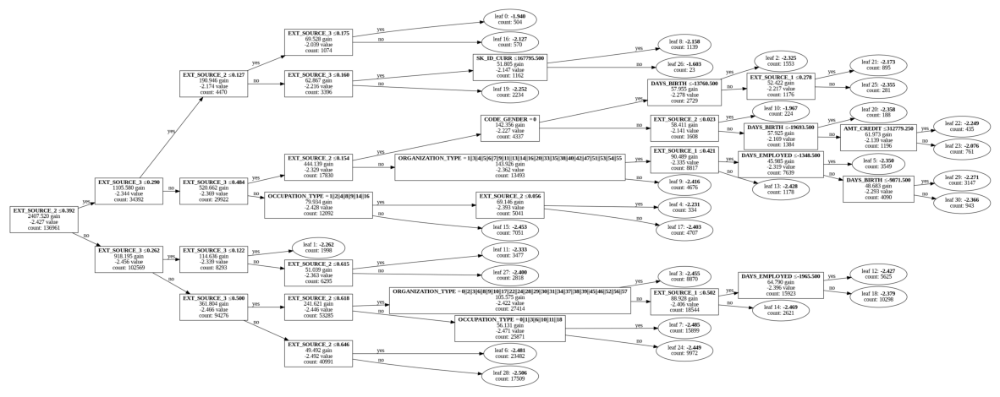

In [ ]:
import matplotlib.pyplot as plt
import graphviz
import pickle
# モデルを保存します
model.save_model('model.txt')

# モデルをロードします
loaded_model = lgb.Booster(model_file='model.txt')

# ツリーを可視化します
tree_index = 0  # 可視化したいツリーのインデックス
fig = lgb.plot_tree(loaded_model, tree_index=tree_index, figsize=(15, 10), show_info=['split_gain', 'internal_value', 'internal_count', 'leaf_count'])

# 画像ファイルとして保存します（dpiを指定して品質を調整）
fig.figure.savefig('tree_image.png', dpi=500)

# ツリーを表示します
plt.show()

## 重要度の上から20個を選ぶ

In [ ]:
importance_df[:20]

,Feature,Importance
37,ORGANIZATION_TYPE,237
40,EXT_SOURCE_3,155
39,EXT_SOURCE_2,125
38,EXT_SOURCE_1,120
7,AMT_CREDIT,103
9,AMT_GOODS_PRICE,85
16,DAYS_BIRTH,78
19,DAYS_ID_PUBLISH,63
17,DAYS_EMPLOYED,61
8,AMT_ANNUITY,59


In [ ]:
selected_features=importance_df[:20].Feature.values
selected_features

array(['ORGANIZATION_TYPE', 'EXT_SOURCE_3', 'EXT_SOURCE_2',
       'EXT_SOURCE_1', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'DAYS_BIRTH',
       'DAYS_ID_PUBLISH', 'DAYS_EMPLOYED', 'AMT_ANNUITY',
       'OCCUPATION_TYPE', 'OWN_CAR_AGE', 'DAYS_LAST_PHONE_CHANGE',
       'DAYS_REGISTRATION', 'CODE_GENDER', 'NAME_EDUCATION_TYPE',
       'REGION_POPULATION_RELATIVE', 'REGION_RATING_CLIENT_W_CITY',
       'NAME_CONTRACT_TYPE', 'DEF_30_CNT_SOCIAL_CIRCLE'], dtype=object)

In [ ]:
import seaborn as sns
# 選択した特徴量のデータを取得します
selected_data = train[selected_features]

# 目的変数を追加します
selected_data['TARGET'] = train['TARGET']

# ペアプロットを作成します
#sns.pairplot(selected_data, hue='TARGET')

<ipython-input-25-1c8bb1c57642>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_data['TARGET'] = train['TARGET']


In [ ]:
# 選択した特徴量のデータを取得します
selected_data = train[selected_features]

# 目的変数を追加します
selected_data['TARGET'] = train['TARGET']

<ipython-input-26-ba94449bbca3>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_data['TARGET'] = train['TARGET']


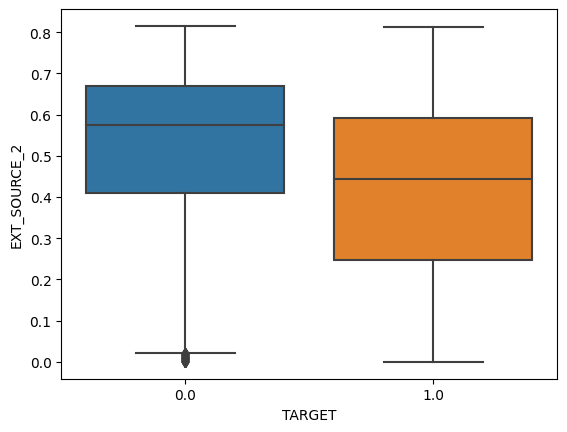

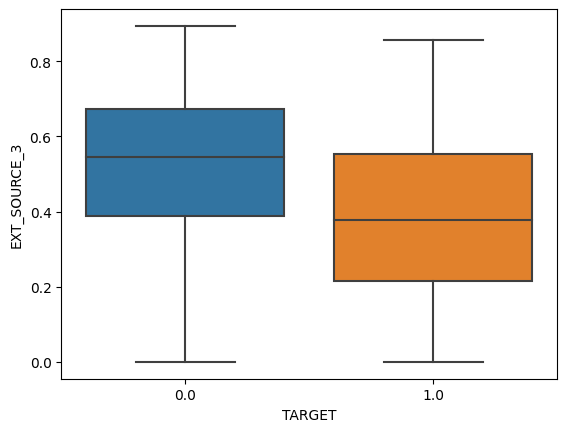

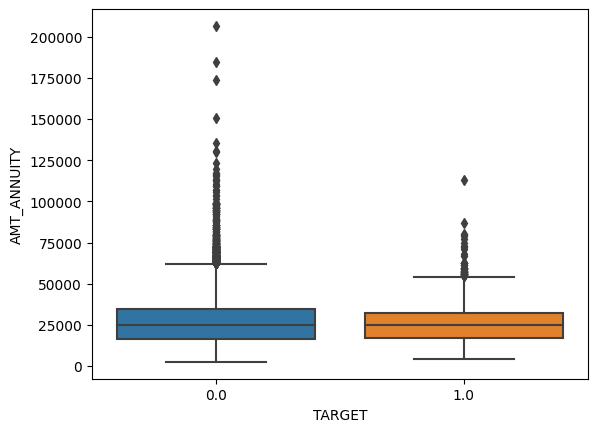

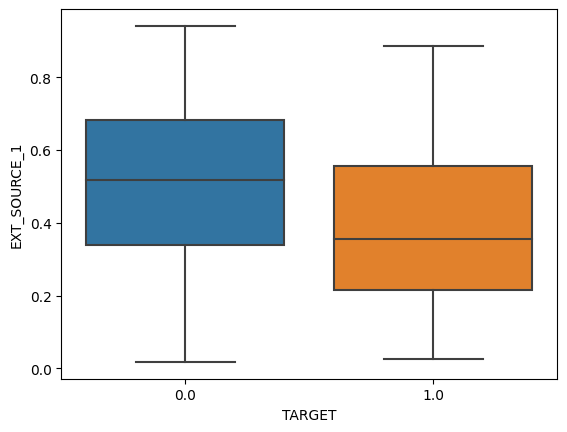

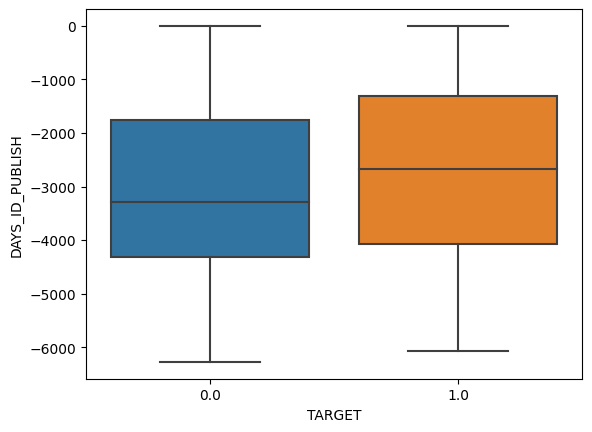

...

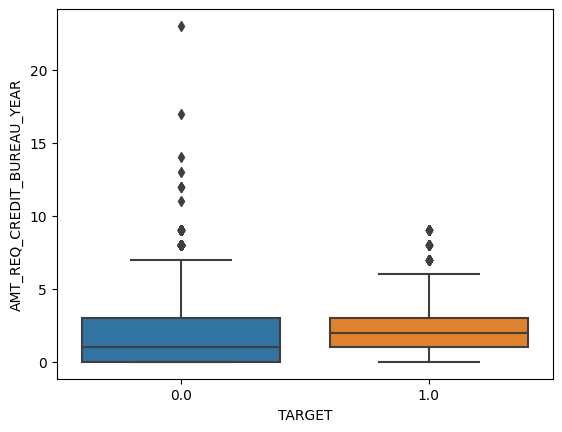

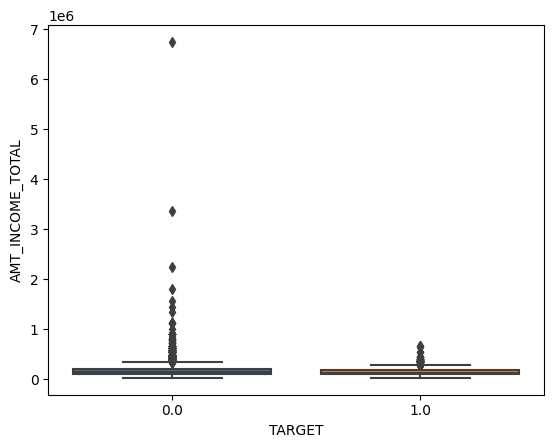

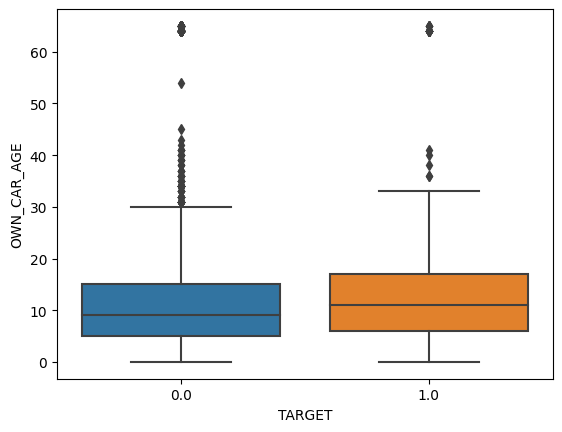

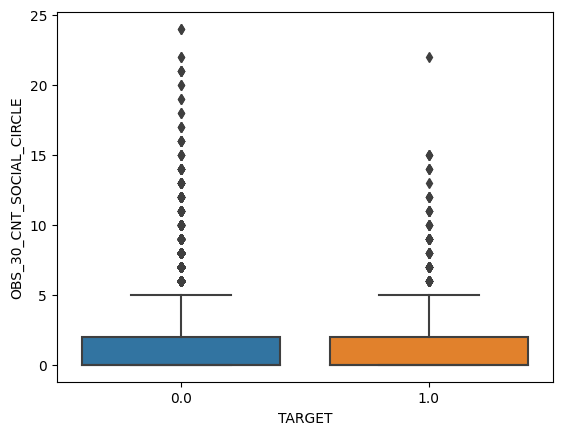

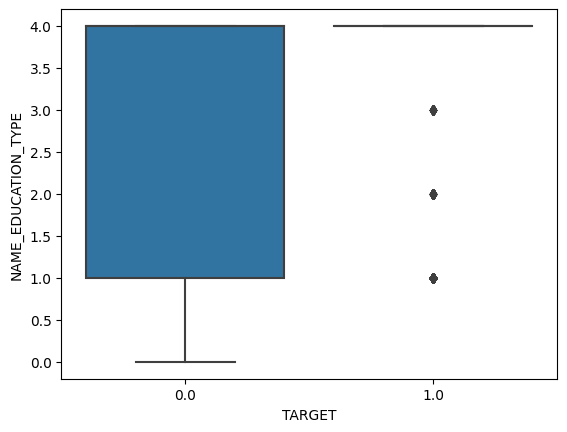

In [ ]:
import seaborn as sns

for nume in selected_data.describe().columns.drop('TARGET'):
    # カテゴリカルデータと数値データの組み合わせを含むDataFrameを作成します
    combined_data = selected_data[[nume, 'TARGET']].copy()
    combined_data['TARGET'] = combined_data['TARGET'].astype('category')

    # 箱ひげ図を作成します
    sns.boxplot(x='TARGET', y=nume, data=combined_data)
    plt.show()


## 外れ値の除去

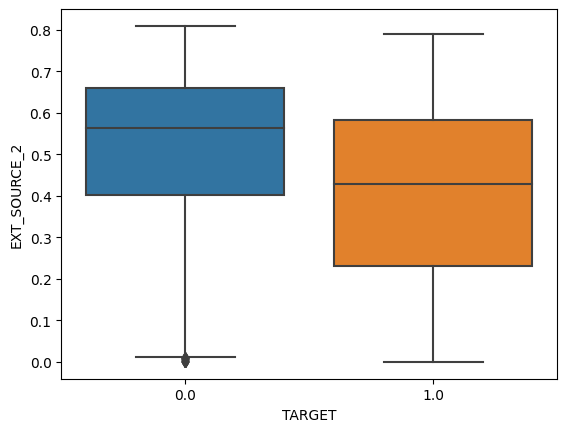

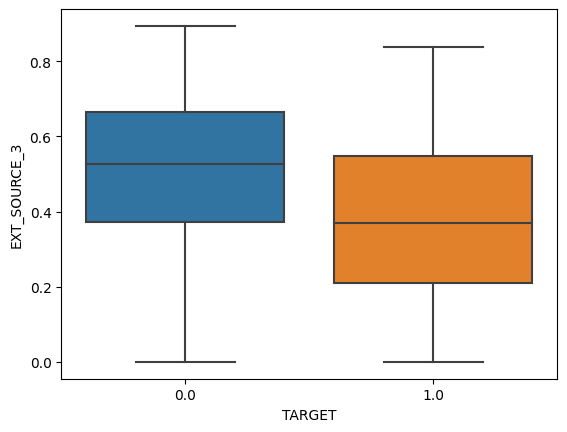

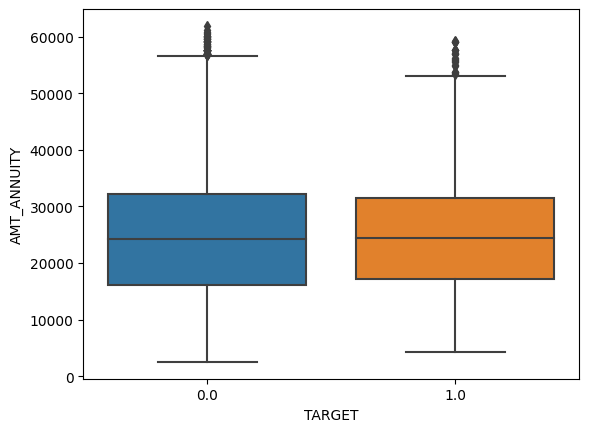

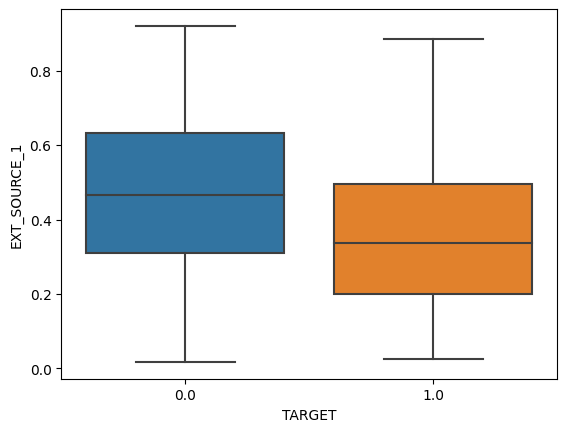

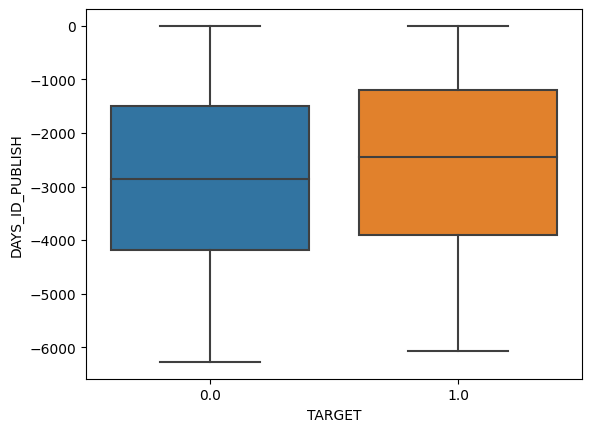

...

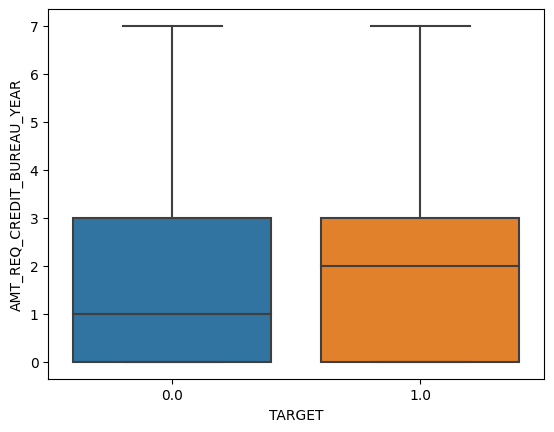

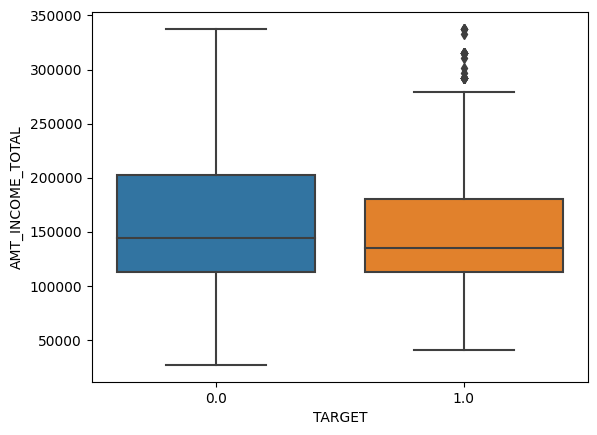

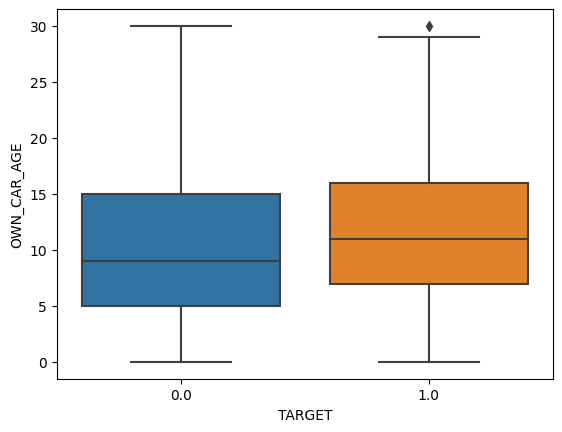

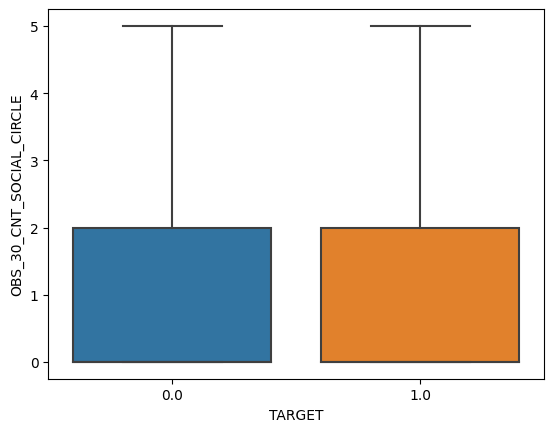

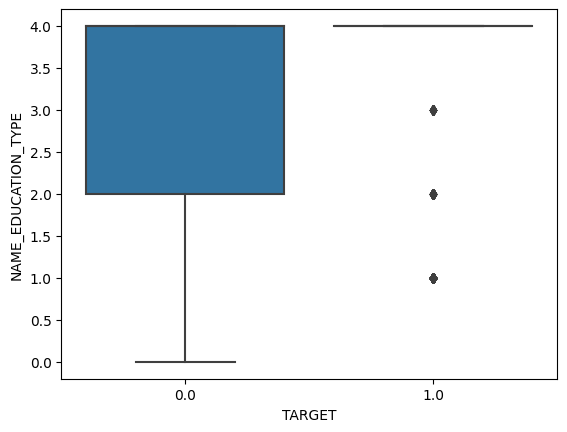

In [ ]:
import seaborn as sns

# 外れ値を取り除く関数
def remove_outliers(data, column, threshold=1.5):
    q1 = data[column].quantile(0.25)
    q3 = data[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - threshold * iqr
    upper_bound = q3 + threshold * iqr
    outlier_indices = data[(data[column] < lower_bound) | (data[column] > upper_bound)].index
    return outlier_indices

# 'TARGET'列以外の数値列を抽出
numerical_columns = selected_data.columns.drop('TARGET')

# 外れ値を取り除くためのインデックスを保持するリストを初期化
outlier_indices = []

# 各数値列に対して外れ値を取り除く
for column in numerical_columns:
    outlier_indices.extend(remove_outliers(selected_data, column))

# 重複を取り除いた外れ値のインデックスを取得
outlier_indices = list(set(outlier_indices))

# 外れ値を除去したデータを作成
filtered_data = selected_data.drop(outlier_indices)

# 各数値列に対して箱ひげ図を作成（外れ値を取り除いたデータ）
for column in numerical_columns:
    sns.boxplot(data=filtered_data, x='TARGET', y=column)
    plt.show()


In [ ]:
len(selected_data)

20280

In [ ]:
len(selected_data)-len(filtered_data)

7801

In [ ]:
import seaborn as sns
# ペアプロットを作成します
#sns.pairplot(filtered_data, hue='TARGET')

## 外れ値を取り除いた後のデータで学習

In [ ]:
filtered_features = list(filtered_data.columns)

In [ ]:
filtered_features.remove('TARGET')

In [ ]:
filtered_features

['EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'AMT_ANNUITY',
 'EXT_SOURCE_1',
 'DAYS_ID_PUBLISH',
 'DAYS_REGISTRATION',
 'DAYS_BIRTH',
 'ORGANIZATION_TYPE',
 'AMT_GOODS_PRICE',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_CREDIT',
 'SK_ID_CURR',
 'DAYS_EMPLOYED',
 'REGION_POPULATION_RELATIVE',
 'OCCUPATION_TYPE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'AMT_INCOME_TOTAL',
 'OWN_CAR_AGE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'NAME_EDUCATION_TYPE']

In [ ]:
filtered_data.shape

(12479, 21)

In [ ]:
X=filtered_data[filtered_features]
y=filtered_data[['TARGET']]

In [ ]:
X.shape

(12479, 20)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y,test_size=0.20, random_state=2)

In [ ]:
import lightgbm as lgb
# LightGBMのデータセットを作成します
train_data = lgb.Dataset(X_train, label=y_train, categorical_feature=categorical_features)
val_data = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

In [ ]:
y.nunique()

TARGET    2
dtype: int64

In [ ]:
# LightGBMのデータセットを作成します
train_data = lgb.Dataset(X_train, label=y_train)
val_data = lgb.Dataset(X_val, label=y_val)

In [ ]:
# パラメータを指定します
params = {
    'objective': 'binary',
    'metric': 'auc'
}

# モデルの学習を行います
model = lgb.train(params, train_data, valid_sets=[train_data, val_data], early_stopping_rounds=10)

[LightGBM] [Info] Number of positive: 961, number of negative: 9022
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3341
[LightGBM] [Info] Number of data points in the train set: 9983, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.096264 -> initscore=-2.239447
[LightGBM] [Info] Start training from score -2.239447
[1]	training's auc: 0.712977	valid_1's auc: 0.687845
Training until validation scores don't improve for 10 rounds
[2]	training's auc: 0.752691	valid_1's auc: 0.704018
[3]	training's auc: 0.763276	valid_1's auc: 0.700739
[4]	training's auc: 0.781384	valid_1's auc: 0.696695
[5]	training's auc: 0.788318	valid_1's auc: 0.698332
[6]	training's auc: 0.797455	valid_1's auc: 0.69781
[7]	training's auc: 0.806776	valid_1's auc: 0.701995
[8]	training

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


In [ ]:
# [52]	training's auc: 0.792496	valid_1's auc: 0.749651

In [ ]:
# 特徴量の重要度を取得します
feature_importance = model.feature_importance()

# 重要度の結果を表示します
feature_names = X_train.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance}).sort_values(by='Importance', ascending=False)
print(importance_df)

                       Feature  Importance
1                 EXT_SOURCE_3          10
0                 EXT_SOURCE_2           8
3                 EXT_SOURCE_1           7
12               DAYS_EMPLOYED           7
2                  AMT_ANNUITY           4
6                   DAYS_BIRTH           4
4              DAYS_ID_PUBLISH           3
8              AMT_GOODS_PRICE           3
9       DAYS_LAST_PHONE_CHANGE           3
17                 OWN_CAR_AGE           2
19         NAME_EDUCATION_TYPE           2
11                  SK_ID_CURR           1
7            ORGANIZATION_TYPE           1
13  REGION_POPULATION_RELATIVE           1
14             OCCUPATION_TYPE           1
16            AMT_INCOME_TOTAL           1
5            DAYS_REGISTRATION           1
10                  AMT_CREDIT           1
15  AMT_REQ_CREDIT_BUREAU_YEAR           0
18    OBS_30_CNT_SOCIAL_CIRCLE           0


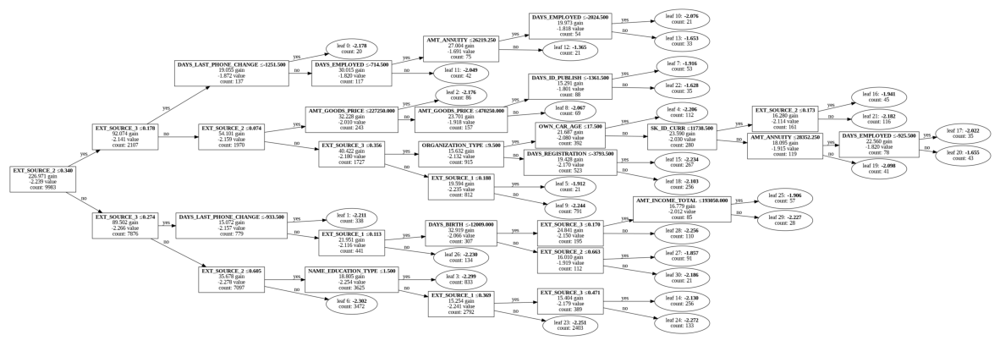

In [ ]:
import matplotlib.pyplot as plt
import graphviz
import pickle
# モデルを保存します
model.save_model('model2.txt')

# モデルをロードします
loaded_model = lgb.Booster(model_file='model2.txt')

# ツリーを可視化します
tree_index = 0  # 可視化したいツリーのインデックス
fig = lgb.plot_tree(loaded_model, tree_index=tree_index, figsize=(15, 10), show_info=['split_gain', 'internal_value', 'internal_count', 'leaf_count'])

# 画像ファイルとして保存します（dpiを指定して品質を調整）
fig.figure.savefig('tree_image2.png', dpi=500)

# ツリーを表示します
plt.show()

## 目的変数との関係

In [ ]:
import pandas as pd
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [ ]:
y_col=list(train.columns)
for i in list(test.columns):
    y_col.remove(i)
y_col

['TARGET']

In [ ]:
print(train.shape)
print(test.shape)

(33796, 51)
(30464, 50)


In [ ]:
data = pd.concat([train,test], axis=0)

In [ ]:
data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0.0,Cash loans,F,N,N,0,112500.0,755190.0,36328.5,...,NaN,0.0,0.0,0.0,0.0,-292.0,NaN,NaN,NaN,NaN
1,1,0.0,Cash loans,F,N,Y,0,225000.0,585000.0,16893.0,...,0.553165,0.0,0.0,0.0,0.0,-617.0,0.0,0.0,0.0,1.0
2,2,0.0,Cash loans,F,N,Y,0,54000.0,334152.0,18256.5,...,NaN,4.0,0.0,4.0,0.0,-542.0,NaN,NaN,NaN,NaN
3,3,0.0,Cash loans,F,N,Y,0,67500.0,152820.0,8901.0,...,0.767523,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,1.0,Cash loans,M,N,N,0,157500.0,271066.5,21546.0,...,0.669057,0.0,0.0,0.0,0.0,-1243.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30459,201661,NaN,Revolving loans,F,N,Y,2,90000.0,270000.0,13500.0,...,0.680139,1.0,1.0,1.0,0.0,-350.0,0.0,0.0,0.0,0.0
30460,201662,NaN,Cash loans,F,N,Y,2,135000.0,942300.0,30528.0,...,0.786267,4.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0
30461,201663,NaN,Cash loans,F,NaN,NaN,0,180000.0,239850.0,23850.0,...,0.368969,0.0,0.0,0.0,0.0,-813.0,0.0,0.0,2.0,2.0
30462,201664,NaN,Cash loans,M,N,N,0,180000.0,450000.0,30073.5,...,0.332851,0.0,0.0,0.0,0.0,-1085.0,0.0,0.0,1.0,0.0


In [ ]:
list(feature_names[:10])+y_col

['EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'AMT_ANNUITY',
 'EXT_SOURCE_1',
 'DAYS_ID_PUBLISH',
 'DAYS_REGISTRATION',
 'DAYS_BIRTH',
 'ORGANIZATION_TYPE',
 'AMT_GOODS_PRICE',
 'DAYS_LAST_PHONE_CHANGE',
 'TARGET']

In [ ]:
data = data[list(feature_names[:10])+y_col]
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 64260 entries, 0 to 30463
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   EXT_SOURCE_2            64132 non-null  float64
 1   EXT_SOURCE_3            43694 non-null  float64
 2   AMT_ANNUITY             64256 non-null  float64
 3   EXT_SOURCE_1            19398 non-null  float64
 4   DAYS_ID_PUBLISH         64259 non-null  float64
 5   DAYS_REGISTRATION       64259 non-null  float64
 6   DAYS_BIRTH              64259 non-null  float64
 7   ORGANIZATION_TYPE       64258 non-null  object 
 8   AMT_GOODS_PRICE         64205 non-null  float64
 9   DAYS_LAST_PHONE_CHANGE  64258 non-null  float64
 10  TARGET                  33796 non-null  float64
dtypes: float64(10), object(1)
memory usage: 5.9+ MB


In [ ]:
ategorical_columns = []
numerical_columns = []

# 各カラムのデータ型を判定し、カテゴリカルデータと数値データを分類
for column in data.columns:
    if data[column].dtype == 'object' or data[column].nunique() <= 10:
        categorical_columns.append(column)
    else:
        numerical_columns.append(column)

In [ ]:
import seaborn as sns
sns.set(font_scale=1.2)  # 文字の表示サイズを調整

# カテゴリカルデータの可視化（棒グラフ）
for column in categorical_columns:
        # プロットのサイズを指定
    plt.figure(figsize=(15, 6))
    plot=sns.countplot(x=column, data=data)
    # x軸のラベルを回転させる
    plot.set_xticklabels(plot.get_xticklabels(), rotation=45)
    plt.show()

# 数値データの可視化（箱ひげ図）
for column in numerical_columns:
    sns.boxplot(x=column, data=data)
    plt.show()

In [ ]:
import seaborn as sns

# カテゴリカルデータと数値データの組み合わせを含むDataFrameを作成します
combined_data = pd.concat([data['カテゴリカルデータ'], data['数値データ']], axis=1)

# 箱ひげ図を作成します
sns.boxplot(x='カテゴリカルデータ', y='数値データ', data=combined_data)

In [ ]:
import seaborn as sns

# カテゴリカルデータ同士の関係を含むDataFrameを作成します
cat_data = data[['カテゴリカルデータ1', 'カテゴリカルデータ2', 'カテゴリカルデータ3']]

# カテゴリカルデータ同士の関係を棒グラフで可視化します
sns.countplot(data=cat_data)

In [ ]:
data[:len(train)]

In [ ]:
filtered_data

In [ ]:
selected_train=data[:len(train)]
selected_test=data[len(train):]

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# 学歴ごとのデフォルトリスクの割合を計算
default_rates = train.groupby('ORGANIZATION_TYPE')['TARGET'].mean().reset_index()

# 棒グラフで可視化
sns.barplot(x='ORGANIZATION_TYPE', y='TARGET', data=default_rates)
plt.xlabel('ORGANIZATION_TYPE')
plt.ylabel('TARGET')
plt.title('TARGET_RATE of ORGANIZATION_TYPE')
plt.show()

In [ ]:
cross_tab = pd.crosstab(train['ORGANIZATION_TYPE'], train['TARGET'])

# クロス集計結果を表示
print(cross_tab)

train：元の訓練データ
test：元のテストデータ
selected：重要度上位20
filtered：外れ値除去後


# 外れ値前後

In [ ]:
# 	Feature	Importance
# 37	ORGANIZATION_TYPE	237
# 40	EXT_SOURCE_3	155
# 39	EXT_SOURCE_2	125
# 38	EXT_SOURCE_1	120
# 7	AMT_CREDIT	103
# 9	AMT_GOODS_PRICE	85
# 16	DAYS_BIRTH	78
# 19	DAYS_ID_PUBLISH	63
# 17	DAYS_EMPLOYED	61
# 8	AMT_ANNUITY	59
# 27	OCCUPATION_TYPE	55
# 20	OWN_CAR_AGE	55
# 45	DAYS_LAST_PHONE_CHANGE	41
# 18	DAYS_REGISTRATION	31
# 2	CODE_GENDER	28
# 12	NAME_EDUCATION_TYPE	25
# 15	REGION_POPULATION_RELATIVE	21
# 30	REGION_RATING_CLIENT_W_CITY	18
# 1	NAME_CONTRACT_TYPE	18
# 42	DEF_30_CNT_SOCIAL_CIRCLE	18

In [ ]:
#                         Feature  Importance
# 1                  EXT_SOURCE_3         160
# 2                  EXT_SOURCE_2         138
# 3                  EXT_SOURCE_1         137
# 9                   AMT_ANNUITY         130
# 6                    DAYS_BIRTH         121
# 4                    AMT_CREDIT         108
# 8                 DAYS_EMPLOYED         104
# 5               AMT_GOODS_PRICE         100
# 12       DAYS_LAST_PHONE_CHANGE          84
# 7               DAYS_ID_PUBLISH          78
# 13            DAYS_REGISTRATION          68
# 11                  OWN_CAR_AGE          67
# 16   REGION_POPULATION_RELATIVE          50
# 0             ORGANIZATION_TYPE          38
# 15          NAME_EDUCATION_TYPE          33
# 10              OCCUPATION_TYPE          27
# 14                  CODE_GENDER          27
# 17  REGION_RATING_CLIENT_W_CITY           0
# 18           NAME_CONTRACT_TYPE           0
# 19     DEF_30_CNT_SOCIAL_CIRCLE           0

# 上位20位に対して気になるデータを見ていく

## traindataとtestdataの比較

In [ ]:
selected_features

In [ ]:
import seaborn as sns
for feature_name in selected_features:
    if feature_name == 'TARGET':
        continue
    else:
        # TRAINデータの特徴量分布
        sns.histplot(data=train, x=feature_name, kde=True, label='TRAIN')
        # TESTデータの特徴量分布
        sns.histplot(data=test, x=feature_name, kde=True, label='TEST')

        plt.xlabel(f'{feature_name}')
        plt.ylabel('count')
        plt.title('TRAIN vs TEST distribution_of_features')
        plt.legend()
        plt.show()

In [ ]:
import seaborn as sns

# TRAINデータとTESTデータの特徴量の相関行列
train_corr = train.corr()
test_corr = test.corr()

# ヒートマップで相関関係を可視化
plt.figure(figsize=(10, 8))
sns.heatmap(train_corr, annot=False, cmap='coolwarm', square=True)
plt.title('TRAIN corrilation_of_feartures')
plt.show()

plt.figure(figsize=(10, 8))
sns.heatmap(test_corr, annot=False, cmap='coolwarm', square=True)
plt.title('TEST corrilation_of_features')
plt.show()

## 目的変数との関係(有意差があるかどうか？)

## 目的変数との関係2(相関係数：どのくらい関係があるか)

In [ ]:
selected_features

### カテゴリの種類の比較と統計量の比較(単純比較)

In [ ]:
import seaborn as sns
# カテゴリの種類の比較
for feature in selected_features:
    if train[feature].dtype == 'object':
        train_categories = set(train[feature].unique())
        test_categories = set(test[feature].unique())

        # 一致しているかどうかを確認
        if train_categories == test_categories:
            print(f"{feature}の種類は一致しています")
        else:
            print(f"{feature}の種類に差異があります")
    else:
        # 統計量の比較
        train_mean = train[feature].mean()
        test_mean = test[feature].mean()

        train_std = train[feature].std()
        test_std = test[feature].std()

        print("Trainデータ:")
        print(f"平均: {train_mean}")
        print(f"標準偏差: {train_std}")

        print("\nTestデータ:")
        print(f"平均: {test_mean}")
        print(f"標準偏差: {test_std}")

        # 分布の可視化
        sns.histplot(train[feature], label='Train')
        sns.histplot(test[feature], label='Test')
        plt.legend()
        plt.show()

KS検定（Kolmogorov-Smirnov検定）: 2つのサンプルの累積分布関数（CDF）の差を比較し、分布の差異を検定する方法です。
与えられた結果から、EXT_SOURCE_3の分布について、trainデータとtestデータの間に統計的に有意な差異があることが示されました。p値が非常に小さく、有意水準（通常は0.05や0.01など）を下回っていることから、分布の差異が偶然の結果ではなく、真の差異を反映している可能性が高いことを示しています。

具体的には、p-valueが1.7863277658329006e-15と非常に小さいため、帰無仮説（trainデータとtestデータの分布が同じである）を棄却することができます。つまり、EXT_SOURCE_3の分布はtrainデータとtestデータで異なっていると言えます。

この結果を予測にどのように解釈するかは、具体的なモデルや目的によります。一般的には、trainデータとtestデータの分布が異なる場合、モデルは訓練データに過剰に適合してしまい、未知のデータ（testデータや実際の予測）に対して効果的な予測ができない可能性があります。したがって、trainデータとtestデータの分布が類似している方が予測の良さにつながると言える場合があります。

## 説明変数と目的変数の関係(T検定：数値データ、カイ2乗検定：カテゴリカルデータ)

In [ ]:
len(selected_features)

In [ ]:
import numpy as np

for feature in selected_features:
    if np.issubdtype(train[feature].dtype, np.number):
        # 数値データの場合の処理
        group1 = train[train['TARGET'] == 0][feature].dropna()
        group2 = train[train['TARGET'] == 1][feature].dropna()
        stat, p = stats.ttest_ind(group1, group2, equal_var=False)
        print(f"{feature} (Numerical):")
        print(f"T-statistic: {stat}")
        print(f"P-value: {p}")
    else:
        # カテゴリカルデータの場合の処理
        cross_tab = pd.crosstab(train[feature].dropna(), train['TARGET'].dropna())
        stat, p, _, _ = stats.chi2_contingency(cross_tab)
        print(f"{feature} (Categorical):")
        print(f"Chi-square statistic: {stat}")
        print(f"P-value: {p}")

上記の結果をもとに、各変数と目的変数（TARGET）の関連性を判断することができます。

カテゴリカルデータの場合（Chi-square検定）：

ORGANIZATION_TYPE：統計的に有意な関連があります（p-value < 0.05）。  
OCCUPATION_TYPE：統計的に有意な関連があります（p-value < 0.05）。  
CODE_GENDER：統計的に有意な関連があります（p-value < 0.05）。  
NAME_EDUCATION_TYPE：統計的に有意な関連があります（p-value < 0.05）。  
NAME_CONTRACT_TYPE：統計的に有意な関連があります（p-value < 0.05）。  
数値データの場合（T検定）：

EXT_SOURCE_3：統計的に有意な関連があります（p-value < 0.05）。  
EXT_SOURCE_2：統計的に有意な関連があります（p-value < 0.05）。  
EXT_SOURCE_1：統計的に有意な関連があります（p-value < 0.05）。  
AMT_CREDIT：統計的に有意な関連があります（p-value < 0.05）。  
AMT_GOODS_PRICE：統計的に有意な関連があります（p-value < 0.05）。  
DAYS_BIRTH：統計的に有意な関連があります（p-value < 0.05）。  
DAYS_ID_PUBLISH：統計的に有意な関連があります（p-value < 0.05）。  
DAYS_EMPLOYED：統計的に有意な関連があります（p-value < 0.05）。  
AMT_ANNUITY：統計的に有意な関連があります（p-value < 0.05）。  
OWN_CAR_AGE：統計的に有意な関連があります（p-value < 0.05）。  
DAYS_LAST_PHONE_CHANGE：統計的に有意な関連があります（p-value < 0.05）。  
DAYS_REGISTRATION：統計的に有意な関連があります（p-value < 0.05）。  
REGION_POPULATION_RELATIVE：統計的に有意な関連があります（p-value < 0.05）。  
REGION_RATING_CLIENT_W_CITY：統計的に有意な関連があります（p-value < 0.05）。  
DEF_30_CNT_SOCIAL_CIRCLE：統計的に有意な関連があります（p-value < 0.05）。  
上記の結果から、TARGETと各変数の間に統計的に有意な関連があることが示されています。これは、カテゴリカルデータと数値データの両方の変数において、目的変数との関連性があることを示しています。

# 重要度が高い20のデータ同士の独立の関係(ピアソンの相関係数、カイ二乗検定)

In [ ]:
train[selected_features[10:]]

In [ ]:
import itertools
import scipy.stats as stats
selected_features=selected_features[10:]
combinations = list(itertools.combinations(selected_features, 2))
significances=[]
for i, (feature1, feature2) in enumerate(combinations, 1):
    significance=""
    if np.issubdtype(train[feature1].dtype, np.number) and np.issubdtype(train[feature2].dtype, np.number):
        # 数値データ同士の独立の検定（相関係数）
        data = train[[feature1, feature2]].dropna().replace([np.inf, -np.inf], np.nan).dropna()
        correlation, p = stats.pearsonr(data[feature1], data[feature2])
        if p < 0.05:
            significance = "Significant"
        else:
            significance = "Not Significant"
        print(f"Combination {i}/{len(combinations)}: {feature1} vs {feature2} (Numerical)")
        print(f"Pearson's correlation coefficient: {correlation}")
        print(f"P-value: {p}")
        print(f"Significance: {significance}")
    elif np.issubdtype(train[feature1].dtype, object) and np.issubdtype(train[feature2].dtype, object):
        # カテゴリカルデータ同士の独立の検定（カイ二乗検定）
        cross_tab = pd.crosstab(train[feature1].dropna(), train[feature2].dropna())
        stat, p, _, _ = stats.chi2_contingency(cross_tab)
        if p < 0.05:
            significance = "Significant"
        else:
            significance = "Not Significant"
        print(f"Combination {i}/{len(combinations)}: {feature1} vs {feature2} (Categorical)")
        print(f"Chi-square statistic: {stat}")
        print(f"P-value: {p}")
        print(f"Significance: {significance}")

    if significance == "Significant":
        significances.append(f"{feature1}x{feature2}")

In [ ]:
significances

## 特徴量エンジニアリング(num,cat)

数値データ同士の乗算による新しい特徴量の作成  
カテゴリカルデータ同士のクロス集計に基づく新しい特徴量の作成


In [ ]:
train[selected_features][:3]

In [ ]:
len(significances)

In [ ]:
train[selected_features]

In [ ]:
train[selected_features].fillna(0)

In [ ]:
for i in range(len(selected_features)):
    for j in range(i+1, len(selected_features)):
        num_feature = selected_features[i]
        cat_feature = selected_features[j]

        if np.issubdtype(train[num_feature].dtype, np.number) and np.issubdtype(train[cat_feature].dtype, object):
            # 数値データの欠損値をカテゴリカルデータで集計して埋める
            aggregated_data = train.groupby(cat_feature)[num_feature].transform('mean')
            train[f'{num_feature}_by_{cat_feature}'] = aggregated_data

        if np.issubdtype(train[cat_feature].dtype, object) and np.issubdtype(train[num_feature].dtype, np.number):
            # カテゴリカルデータの欠損値を数値データで集計して埋める
            #print(num_feature, cat_feature)
            try:
                aggregated_data = train.groupby(num_feature)[cat_feature].transform(lambda x: x.mode().iat[0] if len(x) > 0 else np.nan)
                train[f'{cat_feature}_by_{num_feature}'] = aggregated_data
            except:
                train[f'{cat_feature}_by_{num_feature}'] = np.nan

In [ ]:
for i in range(len(selected_features)):
    for j in range(i+1, len(selected_features)):
        feature1 = selected_features[i]
        feature2 = selected_features[j]
        if feature1!=feature2:
            if np.issubdtype(train[feature1].dtype, np.number) and np.issubdtype(train[feature2].dtype, np.number):
                new_feature = f'{feature1}_x_{feature2}'
                train[new_feature] = train[feature1] * train[feature2]

            if np.issubdtype(train[feature1].dtype, object) and np.issubdtype(train[feature2].dtype, object):
                cross_tab = pd.crosstab(train[feature1].fillna("Unknown"), train[feature2].fillna("Unknown"))
                new_feature = f'{feature1}_x_{feature2}'
                train[new_feature] = train.apply(lambda x: cross_tab.loc[x[feature1], x[feature2]] if x[feature1] in cross_tab.index and x[feature2] in cross_tab.columns else np.nan, axis=1)


In [ ]:
train.shape

In [ ]:
len(train.columns)

In [ ]:
train = pd.read_csv('train.csv')
train.head()

In [ ]:
train.columns

In [ ]:
train[['ORGANIZATION_TYPE','OCCUPATION_TYPE']]

In [ ]:
org_occ_mapping = train.groupby('ORGANIZATION_TYPE')['OCCUPATION_TYPE'].unique().to_dict()

for organization_type, occupation_types in org_occ_mapping.items():
    print(f"ORGANIZATION_TYPE: {organization_type}")
    print(f"OCCUPATION_TYPE: {occupation_types}")
    print()


In [ ]:
pivot_table = train.pivot_table(index='ORGANIZATION_TYPE', columns='OCCUPATION_TYPE', aggfunc=len, fill_value=0)

In [ ]:
display(pivot_table)

# 機械的に増やしながらスコアを確認する

1. スコアを出した時に重要な物を確認できるようにする
1. 機械的に新しい特徴量を作る
1. ログを残す

In [ ]:
data[selected_features]

,ORGANIZATION_TYPE,EXT_SOURCE_3,EXT_SOURCE_2,EXT_SOURCE_1,AMT_CREDIT,AMT_GOODS_PRICE,DAYS_BIRTH,DAYS_ID_PUBLISH,DAYS_EMPLOYED,AMT_ANNUITY,OCCUPATION_TYPE,OWN_CAR_AGE,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,CODE_GENDER,NAME_EDUCATION_TYPE,REGION_POPULATION_RELATIVE,REGION_RATING_CLIENT_W_CITY,NAME_CONTRACT_TYPE,DEF_30_CNT_SOCIAL_CIRCLE
0,39,NaN,0.372591,NaN,755190.0,675000.0,-9233,-522,-878,36328.5,3,NaN,-292.0,-333.0,0,1,0.010032,2,0,0.0
1,57,0.553165,0.449567,NaN,585000.0,585000.0,-20148,-3436,365243,16893.0,18,NaN,-617.0,-4469.0,0,4,0.008019,2,0,0.0
2,35,NaN,0.569503,NaN,334152.0,270000.0,-18496,-2050,-523,18256.5,3,NaN,-542.0,-3640.0,0,4,0.004960,2,0,0.0
3,57,0.767523,0.105235,NaN,152820.0,135000.0,-24177,-3951,365243,8901.0,18,NaN,0.0,-4950.0,0,3,0.005002,3,0,0.0
4,5,0.669057,0.202490,0.342344,271066.5,234000.0,-10685,-3226,-697,21546.0,4,NaN,-1243.0,-5101.0,1,4,0.006296,3,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61495,51,0.307737,0.018172,0.263678,1288350.0,1125000.0,-11430,-2705,-792,37800.0,10,12.0,-1.0,-9772.0,0,1,0.007020,2,0,0.0
61496,42,0.434733,0.668578,NaN,273636.0,247500.0,-17181,-668,-839,15408.0,14,NaN,-2732.0,-5125.0,0,1,0.006671,2,0,0.0
61497,5,NaN,0.574151,0.510226,291384.0,270000.0,-14515,-4795,-722,26725.5,0,NaN,-615.0,-7225.0,0,1,0.018801,2,0,0.0
61498,33,NaN,0.226714,0.353295,746280.0,675000.0,-16914,-231,-8756,59094.0,18,NaN,-1610.0,-5233.0,0,1,0.002042,3,0,0.0


In [ ]:
selected_features

array(['ORGANIZATION_TYPE', 'EXT_SOURCE_3', 'EXT_SOURCE_2',
       'EXT_SOURCE_1', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'DAYS_BIRTH',
       'DAYS_ID_PUBLISH', 'DAYS_EMPLOYED', 'AMT_ANNUITY',
       'OCCUPATION_TYPE', 'OWN_CAR_AGE', 'DAYS_LAST_PHONE_CHANGE',
       'DAYS_REGISTRATION', 'CODE_GENDER', 'NAME_EDUCATION_TYPE',
       'REGION_POPULATION_RELATIVE', 'REGION_RATING_CLIENT_W_CITY',
       'NAME_CONTRACT_TYPE', 'DEF_30_CNT_SOCIAL_CIRCLE'], dtype=object)

In [ ]:
data[selected_features].info()

In [ ]:
list(data[selected_features].columns)

['ORGANIZATION_TYPE',
 'EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'EXT_SOURCE_1',
 'AMT_CREDIT',
 'AMT_GOODS_PRICE',
 'DAYS_BIRTH',
 'DAYS_ID_PUBLISH',
 'DAYS_EMPLOYED',
 'AMT_ANNUITY',
 'OCCUPATION_TYPE',
 'OWN_CAR_AGE',
 'DAYS_LAST_PHONE_CHANGE',
 'DAYS_REGISTRATION',
 'CODE_GENDER',
 'NAME_EDUCATION_TYPE',
 'REGION_POPULATION_RELATIVE',
 'REGION_RATING_CLIENT_W_CITY',
 'NAME_CONTRACT_TYPE',
 'DEF_30_CNT_SOCIAL_CIRCLE']

In [ ]:
selected_features=importance_df[:10].Feature.values
selected_features

array(['ORGANIZATION_TYPE', 'EXT_SOURCE_3', 'EXT_SOURCE_2',
       'EXT_SOURCE_1', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'DAYS_BIRTH',
       'DAYS_ID_PUBLISH', 'DAYS_EMPLOYED', 'AMT_ANNUITY'], dtype=object)

In [ ]:
import numpy as np

# 数値データ同士の交差特徴量の作成(今回はカテゴリカルデータも全て量的データとして扱う)

def create_cross_features(df, y_col):
    features = list(df.columns)  # 数値データの特徴量リスト
    try:
        features.remove(y_col)
    except:
        pass
    #print(features)
    add_features=[]

    for i in range(len(features)):
        for j in range(i+1, len(features)):
            feature1 = features[i]
            feature2 = features[j]
            new_feature = f'{feature1}_x_{feature2}'
            # 交差特徴量の作成（例: 数値データ同士の積）
            df[feature1] = df[feature1].astype(float)
            df[feature2] = df[feature2].astype(float)
            df[new_feature] = df[feature1] * df[feature2]
            add_features.append(new_feature)

    return df, add_features

# データフレームに適用
a_selected_data, add_features = create_cross_features(data[selected_features], y_col[0])

<ipython-input-25-2625a00bb3b1>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[feature1] = df[feature1].astype(float)
<ipython-input-25-2625a00bb3b1>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[feature2] = df[feature2].astype(float)
<ipython-input-25-2625a00bb3b1>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/sta

In [ ]:
a_selected_data

,ORGANIZATION_TYPE,EXT_SOURCE_3,EXT_SOURCE_2,EXT_SOURCE_1,AMT_CREDIT,AMT_GOODS_PRICE,DAYS_BIRTH,DAYS_ID_PUBLISH,DAYS_EMPLOYED,AMT_ANNUITY,...,AMT_GOODS_PRICE_x_DAYS_BIRTH,AMT_GOODS_PRICE_x_DAYS_ID_PUBLISH,AMT_GOODS_PRICE_x_DAYS_EMPLOYED,AMT_GOODS_PRICE_x_AMT_ANNUITY,DAYS_BIRTH_x_DAYS_ID_PUBLISH,DAYS_BIRTH_x_DAYS_EMPLOYED,DAYS_BIRTH_x_AMT_ANNUITY,DAYS_ID_PUBLISH_x_DAYS_EMPLOYED,DAYS_ID_PUBLISH_x_AMT_ANNUITY,DAYS_EMPLOYED_x_AMT_ANNUITY
0,39.0,NaN,0.372591,NaN,755190.0,675000.0,-9233.0,-522.0,-878.0,36328.5,...,-6.232275e+09,-3.523500e+08,-5.926500e+08,2.452174e+10,4819626.0,8.106574e+06,-335421040.5,4.583160e+05,-18963477.0,-3.189642e+07
1,57.0,0.553165,0.449567,NaN,585000.0,585000.0,-20148.0,-3436.0,365243.0,16893.0,...,-1.178658e+10,-2.010060e+09,2.136672e+11,9.882405e+09,69228528.0,-7.358916e+09,-340360164.0,-1.254975e+09,-58044348.0,6.170050e+09
2,35.0,NaN,0.569503,NaN,334152.0,270000.0,-18496.0,-2050.0,-523.0,18256.5,...,-4.993920e+09,-5.535000e+08,-1.412100e+08,4.929255e+09,37916800.0,9.673408e+06,-337672224.0,1.072150e+06,-37425825.0,-9.548150e+06
3,57.0,0.767523,0.105235,NaN,152820.0,135000.0,-24177.0,-3951.0,365243.0,8901.0,...,-3.263895e+09,-5.333850e+08,4.930780e+10,1.201635e+09,95523327.0,-8.830480e+09,-215199477.0,-1.443075e+09,-35167851.0,3.251028e+09
4,5.0,0.669057,0.202490,0.342344,271066.5,234000.0,-10685.0,-3226.0,-697.0,21546.0,...,-2.500290e+09,-7.548840e+08,-1.630980e+08,5.041764e+09,34469810.0,7.447445e+06,-230219010.0,2.248522e+06,-69507396.0,-1.501756e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61495,51.0,0.307737,0.018172,0.263678,1288350.0,1125000.0,-11430.0,-2705.0,-792.0,37800.0,...,-1.285875e+10,-3.043125e+09,-8.910000e+08,4.252500e+10,30918150.0,9.052560e+06,-432054000.0,2.142360e+06,-102249000.0,-2.993760e+07
61496,42.0,0.434733,0.668578,NaN,273636.0,247500.0,-17181.0,-668.0,-839.0,15408.0,...,-4.252298e+09,-1.653300e+08,-2.076525e+08,3.813480e+09,11476908.0,1.441486e+07,-264724848.0,5.604520e+05,-10292544.0,-1.292731e+07
61497,5.0,NaN,0.574151,0.510226,291384.0,270000.0,-14515.0,-4795.0,-722.0,26725.5,...,-3.919050e+09,-1.294650e+09,-1.949400e+08,7.215885e+09,69599425.0,1.047983e+07,-387920632.5,3.461990e+06,-128148772.5,-1.929581e+07
61498,33.0,NaN,0.226714,0.353295,746280.0,675000.0,-16914.0,-231.0,-8756.0,59094.0,...,-1.141695e+10,-1.559250e+08,-5.910300e+09,3.988845e+10,3907134.0,1.480990e+08,-999515916.0,2.022636e+06,-13650714.0,-5.174271e+08


In [ ]:
len(add_features)

45

In [ ]:
train.shape

(171202, 51)

In [ ]:
X=a_selected_data[:len(train)]
y=train[y_col]

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y,test_size=0.20, random_state=2)

In [ ]:
# LightGBMのデータセットを作成するために、カテゴリカル変数を適切な形式に変換します
# X_train[categorical_features] = X_train[categorical_features].astype('category')
# X_val[categorical_features] = X_val[categorical_features].astype('category')

# LightGBMのデータセットを作成します
train_data = lgb.Dataset(X_train, label=y_train)
#train_data.set_categorical_feature(categorical_features)

val_data = lgb.Dataset(X_val, label=y_val)
#val_data.set_categorical_feature(categorical_features)

In [ ]:
# パラメータを指定します
params = {
    'objective': 'binary',
    'metric': 'auc',
}
#call_backs = [early_stopping, verbose]
# モデルの学習を行います
model = lgb.train(params, train_data, valid_sets=[train_data, val_data], early_stopping_rounds=100)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.646578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 44386
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 210
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
[1]	training's auc: 0.712312	valid_1's auc: 0.70566
Training until validation scores don't improve for 100 rounds
[2]	training's auc: 0.720323	valid_1's auc: 0.713181
[3]	training's auc: 0.723911	valid_1's auc: 0.71822
[4]	training's auc: 0.728856	valid_1's auc: 0.722537
[5]	training's auc: 0.731682	valid_1's auc: 0.724093
[6]	training's auc: 0.73434	valid_1's auc: 0.725492
[7]	training's auc: 0.736744	valid_1's auc: 0.727349
[8]	training's auc: 0.739341	valid_1's auc: 0.729548
[9]	training's a

In [ ]:
len(a_selected_data.columns)

55

In [ ]:
a=pd.read_csv('train.csv')
a.columns

In [ ]:
len(selected_features)

20

In [ ]:
len(add_features)

190

In [ ]:
import logging

def setup_logger(logger_name, log_file, level=logging.INFO):
    logger = logging.getLogger(logger_name)
    logger.setLevel(level)

    file_handler = logging.FileHandler(log_file)
    file_handler.setLevel(level)

    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    file_handler.setFormatter(formatter)

    logger.handlers.clear()
    logger.addHandler(file_handler)

    return logger

In [ ]:
base_features

array(['ORGANIZATION_TYPE', 'EXT_SOURCE_3', 'EXT_SOURCE_2',
       'EXT_SOURCE_1', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'DAYS_BIRTH',
       'DAYS_ID_PUBLISH', 'DAYS_EMPLOYED', 'AMT_ANNUITY',
       'OCCUPATION_TYPE', 'OWN_CAR_AGE', 'DAYS_LAST_PHONE_CHANGE',
       'DAYS_REGISTRATION', 'CODE_GENDER', 'NAME_EDUCATION_TYPE',
       'REGION_POPULATION_RELATIVE', 'REGION_RATING_CLIENT_W_CITY',
       'NAME_CONTRACT_TYPE', 'DEF_30_CNT_SOCIAL_CIRCLE'], dtype=object)

In [ ]:
import itertools
a=[]
# 特徴量エンジニアリングによって生成された変数のリスト
base_features = selected_features.tolist()
engineered_features = add_features  # 生成された変数のリストを記述してください

# ベース特徴量との組み合わせも含めたすべての特徴量のリストを作成
all_features = base_features + engineered_features
#all_features = all_features[:5]
# 変数の組み合わせの数を指定（1つずつ増やす場合は range(1, len(all_features)+1)）
num_combinations = range(1, len(all_features)+1)
for num_vars in num_combinations:
    combinations = list(itertools.combinations(all_features, num_vars))
    for combo in combinations:
        a.append(list(combo))

In [ ]:
a

In [ ]:
import itertools
import lightgbm as lgb
from sklearn.metrics import roc_auc_score
import logging

# ロガーの設定
logger = setup_logger(__name__, 'performance.log')

# 特徴量エンジニアリングによって生成された変数のリスト
base_features = selected_features.tolist()
engineered_features = add_features  # 生成された変数のリストを記述してください

# ベース特徴量との組み合わせも含めたすべての特徴量のリストを作成
all_features = base_features + engineered_features
#all_features = all_features[:5]
# 変数の組み合わせの数を指定（1つずつ増やす場合は range(1, len(all_features)+1)）
num_combinations = range(1, len(all_features)+1)

# 変数の組み合わせごとに性能指標を記録する辞書
performance_metrics = {}

# モデルのパラメータ設定
params = {
    'objective': 'binary',
    'metric': 'auc',
    'force_row_wise': True,
}

best_train_auc = {}
best_val_auc = {}

# 空のコールバック関数
def empty_callback(env):
    pass

# 変数の組み合わせごとにモデルを学習して性能指標を記録
for num_vars in num_combinations:
    best_train_auc[num_vars] = 0.0
    best_val_auc[num_vars] = 0.0
    combinations = list(itertools.combinations(all_features, num_vars))
    for combo in combinations:
        graduated_features = list(combo)
        print(graduated_features)
        #訓練データの作成
        X=a_selected_data[:len(train)]
        y=train[y_col]
        X_train, X_val, y_train, y_val = train_test_split(X, y,test_size=0.20, random_state=2)
        # モデルの学習データを作成
        train_data = lgb.Dataset(X_train, label=y_train, free_raw_data=False)
        # モデルの検証データを作成
        val_data = lgb.Dataset(X_val, label=y_val, free_raw_data=False)

        # モデルの学習を行う
        callbacks = [lgb.early_stopping(10), empty_callback]
        model = lgb.train(params, train_data, valid_sets=[train_data, val_data], callbacks=callbacks)

        # モデルの予測結果を取得
        y_pred = model.predict(X_val)

        # 性能指標の計算
        train_auc = roc_auc_score(y_train, model.predict(X_train))
        val_auc = roc_auc_score(y_val, y_pred)

        # ベストなスコアの更新時に記録を残す
        if val_auc > best_val_auc[num_vars]:
            best_train_auc[num_vars] = train_auc
            best_val_auc[num_vars] = val_auc
            best_features = graduated_features

    # ベストなスコアをログに記録
    logger.info(f"Best Performance ({num_vars} Variables): Train AUC = {best_train_auc[num_vars]:.2f}, Validation AUC = {best_val_auc[num_vars]:.2f}, Features = {best_features}")


['ORGANIZATION_TYPE']
[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Info] Total Bins 44386
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 210
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[46]	training's auc: 0.792711	valid_1's auc: 0.747722
['EXT_SOURCE_3']
[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Info] Total Bins 44386
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 210
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[46]	training's auc: 0.792711	valid_1's auc

KeyboardInterrupt: ignored

In [ ]:
import lightgbm as lgb

# ログを書き込むファイルのパス
log_file = "lgbm_log.txt"

# データセットとパラメータの設定

params = {
    'objective': 'binary',
    'metric': 'auc',
    'verbose': 50
    'force_row_wise': True,
}

# ログファイルを開いて初期化
with open(log_file, 'w') as f:
    f.write('')

best_train_auc = {}
best_val_auc = {}

base_features = selected_features.tolist()
# forループで学習とログの追記を行う
with open(log_file, "a") as f:
    for feature in add_features:
        print(feature)
        # パラメータの設定と特徴量の選択
        all_features = base_features
        all_features.append(feature)
        train=selected_data
        test=data[len(train):]
        #print(type(parameters))
        X=train[all_features]
        y=train[y_col]
        X_train, X_val, y_train, y_val = train_test_split(X, y,test_size=0.20, random_state=2)
        train_data = lgb.Dataset(X_train, label=y_train)
        val_data = lgb.Dataset(X_val, label=y_val)
        # モデルの構築と評価
        # パラメータを指定します
        params = {
            'objective': 'binary',
            'metric': 'auc',
            'verbose': 50,
        }

        # モデルの学習を行います
        model = lgb.train(params, train_data, valid_sets=[train_data, val_data], early_stopping_rounds=10)
        # モデルの予測結果を取得
        y_pred = model.predict(X_val)

        # 性能指標の計算
        train_auc = roc_auc_score(y_train, model.predict(X_train))
        val_auc = roc_auc_score(y_val, y_pred)

        # ベストなスコアの更新時に記録を残す
        if val_auc > best_val_auc[num_vars]:
            best_train_auc[num_vars] = train_auc
            best_val_auc[num_vars] = val_auc
            best_features = selected_features

        # ログ情報を取得しファイルに書き込む
        # log = f"Iteration: {i}, Train Loss: {model.best_score['training']['auc']}, Valid Loss: {model.best_score['valid_1']['auc']}\n"
        # f.write(log)
    # ベストなスコアをログに記録
    logger.info(f"Best Performance ({num_vars} Variables): Train AUC = {best_train_auc[num_vars]:.2f}, Validation AUC = {best_val_auc[num_vars]:.2f}, Features = {best_features}")


In [ ]:
# ベース特徴量との組み合わせも含めたすべての特徴量のリストを作成
all_features = base_features + add_features
#all_features = all_features[:5]
# 変数の組み合わせの数を指定（1つずつ増やす場合は range(1, len(all_features)+1)）
num_combinations = range(1, len(all_features)+1)
a=[]
for num_vars in num_combinations:
    combinations = list(itertools.combinations(all_features, num_vars))
    for combo in combinations:
        a.append(combo)

In [ ]:
import itertools
import lightgbm as lgb
from sklearn.metrics import roc_auc_score
import logging

# ロガーの設定
logger = setup_logger(__name__, 'performance.log')

# 特徴量エンジニアリングによって生成された変数のリスト
engineered_features = add_features  # 生成された変数のリストを記述してください

# ベース特徴量との組み合わせも含めたすべての特徴量のリストを作成
all_features = base_features + engineered_features
#all_features = all_features[:5]
# 変数の組み合わせの数を指定（1つずつ増やす場合は range(1, len(all_features)+1)）
num_combinations = range(1, len(all_features)+1)

# 変数の組み合わせごとに性能指標を記録する辞書
performance_metrics = {}

# モデルのパラメータ設定
params = {
    'objective': 'binary',
    'metric': 'auc',
    'force_row_wise': True,
}

best_train_auc = {}
best_val_auc = {}

# 空のコールバック関数
def empty_callback(env):
    pass

# 変数の組み合わせごとにモデルを学習して性能指標を記録
for num_vars in num_combinations:
    best_train_auc[num_vars] = 0.0
    best_val_auc[num_vars] = 0.0
    combinations = list(itertools.combinations(all_features, num_vars))
    for combo in combinations:
        selected_features = list(combo)
        #訓練データの作成
        X=selected_data #train[selected_features]
        y=train[y_col]
        X_train, X_val, y_train, y_val = train_test_split(X, y,test_size=0.20, random_state=2)
        # モデルの学習データを作成
        train_data = lgb.Dataset(X_train, label=y_train, free_raw_data=False)
        # モデルの検証データを作成
        val_data = lgb.Dataset(X_val, label=y_val, free_raw_data=False)

        # モデルの学習を行う
        callbacks = [lgb.early_stopping(10), empty_callback]
        model = lgb.train(params, train_data, valid_sets=[train_data, val_data], callbacks=callbacks)

        # モデルの予測結果を取得
        y_pred = model.predict(X_val)

        # 性能指標の計算
        train_auc = roc_auc_score(y_train, model.predict(X_train))
        val_auc = roc_auc_score(y_val, y_pred)

        # ベストなスコアの更新時に記録を残す
        if val_auc > best_val_auc[num_vars]:
            best_train_auc[num_vars] = train_auc
            best_val_auc[num_vars] = val_auc
            best_features = selected_features

    # ベストなスコアをログに記録
    logger.info(f"Best Performance ({num_vars} Variables): Train AUC = {best_train_auc[num_vars]:.2f}, Validation AUC = {best_val_auc[num_vars]:.2f}, Features = {best_features}")


ストリーミング出力は最後の 5000 行に切り捨てられました。
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[1]	training's auc: 1	valid_1's auc: 1
[LightGBM] [Info] Number of positive: 1289, number of negative: 14935
[LightGBM] [Info] Total Bins 49301
[LightGBM] [Info] Number of data points in the train set: 16224, number of used features: 211
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.079450 -> initscore=-2.449841
[LightGBM] [Info] Start training from score -2.449841
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

KeyboardInterrupt: ignored

# 分析

In [ ]:
import pandas as pd

# 1. 顧客情報
train['CNT_CHILDREN_BIN'] = pd.cut(train['CNT_CHILDREN'], bins=[-1, 0, 2, train['CNT_CHILDREN'].max()], labels=['0', '1-2', '3+'])
train['NAME_INCOME_TYPE_CODE'] = train['NAME_INCOME_TYPE'].map({'Unemployed': 0, 'Employee': 1, 'Business Owner': 2})

# 2. 収入関連
train['INCOME_PER_PERSON'] = train['AMT_INCOME_TOTAL'] / train['CNT_FAM_MEMBERS']
train['MEAN_INCOME_BY_TYPE'] = train.groupby('NAME_INCOME_TYPE')['AMT_INCOME_TOTAL'].transform('mean')

# 3. クレジット関連
train['CREDIT_RATIO'] = train['AMT_CREDIT'] / train['AMT_INCOME_TOTAL']
train['LOAN_PRICE_RATIO'] = train['AMT_CREDIT'] / train['AMT_GOODS_PRICE']

# 4. 住居関連
train['NAME_TYPE_SUITE_BINARY'] = (train['NAME_TYPE_SUITE'] != 'Unaccompanied').astype(int)
train['NAME_HOUSING_TYPE_BINARY'] = (train['NAME_HOUSING_TYPE'] != 'Rented apartment').astype(int)

# 5. 個人情報
train['AGE'] = train['DAYS_BIRTH'] // -365
train['DAYS_EMPLOYED'] = train['DAYS_EMPLOYED'].apply(lambda x: x if x > 0 else pd.NaT)
train['DAYS_REGISTRATION'] = abs(train['DAYS_REGISTRATION']).fillna(0)

# 6. 連絡手段
train['PHONE_FLAG'] = (train['FLAG_MOBIL'] + train['FLAG_EMP_PHONE'] + train['FLAG_WORK_PHONE'] + train['FLAG_CONT_MOBILE'] + train['FLAG_PHONE']).clip(0, 1)
train['EMAIL_FLAG'] = train['FLAG_EMAIL'].astype(int)

# 7. 職業関連
#train = pd.get_dummies(train, columns=['OCCUPATION_TYPE'])

# 8. 家族関連
train['CNT_FAM_MEMBERS_BIN'] = pd.cut(train['CNT_FAM_MEMBERS'], bins=[-1, 1, 2, train['CNT_FAM_MEMBERS'].max()], labels=['1', '2', '3+'])

# 9. 地域評価
train['REGION_RATING_DIFF'] = train['REGION_RATING_CLIENT'] - train['REGION_RATING_CLIENT_W_CITY']

# 10. 住所関連
train['ADDRESS_MATCH_FLAG'] = (train['REG_REGION_NOT_LIVE_REGION'] + train['REG_REGION_NOT_WORK_REGION']).clip(0, 1)
train['WORK_ADDRESS_MATCH_FLAG'] = (train['REG_CITY_NOT_LIVE_CITY'] + train['REG_CITY_NOT_WORK_CITY']).clip(0, 1)

# 11. 外部データソース
train['EXT_SOURCE_1_2_PRODUCT'] = train['EXT_SOURCE_1'] * train['EXT_SOURCE_2']
train['EXT_SOURCE_1_3_PRODUCT'] = train['EXT_SOURCE_1'] * train['EXT_SOURCE_3']

# 12. ソーシャルサークル
train['OBS_DEF_SOCIAL_CIRCLE_SUM'] = train['OBS_30_CNT_SOCIAL_CIRCLE'] + train['OBS_60_CNT_SOCIAL_CIRCLE']
train['DEF_SOCIAL_CIRCLE_SUM'] = train['DEF_30_CNT_SOCIAL_CIRCLE'] + train['DEF_60_CNT_SOCIAL_CIRCLE']

# 13. その他
train['DAYS_LAST_PHONE_CHANGE'] = abs(train['DAYS_LAST_PHONE_CHANGE']).fillna(0)
train['TOTAL_REQ_CREDIT_BUREAU'] = train[['AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']].sum(axis=1)

# 上記の特徴量エンジニアリングを行ったデータフレームを新しい変数に代入する
engineered_train = train.copy()


In [ ]:
engineered_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EMAIL_FLAG,CNT_FAM_MEMBERS_BIN,REGION_RATING_DIFF,ADDRESS_MATCH_FLAG,WORK_ADDRESS_MATCH_FLAG,EXT_SOURCE_1_2_PRODUCT,EXT_SOURCE_1_3_PRODUCT,OBS_DEF_SOCIAL_CIRCLE_SUM,DEF_SOCIAL_CIRCLE_SUM,TOTAL_REQ_CREDIT_BUREAU
0,0,0,Cash loans,F,N,N,0,112500.0,755190.0,36328.5,...,0,2,0,1,1,NaN,NaN,0.0,0.0,0.0
1,1,0,Cash loans,F,N,Y,0,225000.0,585000.0,16893.0,...,0,2,0,0,0,NaN,NaN,0.0,0.0,1.0
2,2,0,Cash loans,F,N,Y,0,54000.0,334152.0,18256.5,...,0,2,0,0,0,NaN,NaN,8.0,0.0,0.0
3,3,0,Cash loans,F,N,Y,0,67500.0,152820.0,8901.0,...,0,1,0,0,0,NaN,NaN,0.0,0.0,0.0
4,4,1,Cash loans,M,N,N,0,157500.0,271066.5,21546.0,...,0,2,0,0,1,0.069321,0.229048,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171197,171197,0,Cash loans,M,NaN,NaN,0,83250.0,404325.0,20772.0,...,0,2,0,0,1,NaN,NaN,0.0,0.0,1.0
171198,171198,0,Cash loans,F,Y,Y,0,247500.0,601470.0,29065.5,...,0,1,1,0,0,NaN,NaN,0.0,0.0,6.0
171199,171199,0,Cash loans,F,N,N,2,292500.0,1237684.5,49216.5,...,1,3+,0,0,0,NaN,NaN,4.0,2.0,1.0
171200,171200,0,Cash loans,M,Y,N,0,112500.0,239850.0,25186.5,...,0,1,0,0,1,0.132256,NaN,0.0,0.0,0.0


In [ ]:
train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0,Cash loans,F,N,N,0,112500.0,755190.0,36328.5,...,NaN,0.0,0.0,0.0,0.0,-292.0,NaN,NaN,NaN,NaN
1,1,0,Cash loans,F,N,Y,0,225000.0,585000.0,16893.0,...,0.553165,0.0,0.0,0.0,0.0,-617.0,0.0,0.0,0.0,1.0
2,2,0,Cash loans,F,N,Y,0,54000.0,334152.0,18256.5,...,NaN,4.0,0.0,4.0,0.0,-542.0,NaN,NaN,NaN,NaN
3,3,0,Cash loans,F,N,Y,0,67500.0,152820.0,8901.0,...,0.767523,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,1,Cash loans,M,N,N,0,157500.0,271066.5,21546.0,...,0.669057,0.0,0.0,0.0,0.0,-1243.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171197,171197,0,Cash loans,M,NaN,NaN,0,83250.0,404325.0,20772.0,...,0.768808,0.0,0.0,0.0,0.0,-2341.0,0.0,0.0,1.0,0.0
171198,171198,0,Cash loans,F,Y,Y,0,247500.0,601470.0,29065.5,...,NaN,0.0,0.0,0.0,0.0,-1688.0,0.0,0.0,1.0,5.0
171199,171199,0,Cash loans,F,N,N,2,292500.0,1237684.5,49216.5,...,0.758393,2.0,1.0,2.0,1.0,-515.0,0.0,0.0,0.0,1.0
171200,171200,0,Cash loans,M,Y,N,0,112500.0,239850.0,25186.5,...,NaN,0.0,0.0,0.0,0.0,-1133.0,NaN,NaN,NaN,NaN


In [ ]:
categorical_features=list(engineered_train.describe(include=['O']).columns)
print(categorical_features)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'DAYS_EMPLOYED', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']


In [ ]:
from sklearn import preprocessing
labels={}
for column in categorical_features:
    # print(train[column].shape)
    le= preprocessing.LabelEncoder()
    le.fit(engineered_train[column].astype(str))
    label={column:list(le.classes_)}
    labels.update(label)
    engineered_train[column]=le.transform(engineered_train[column].astype(str))

In [ ]:
labels

{'NAME_CONTRACT_TYPE': ['Cash loans', 'Revolving loans'],
 'CODE_GENDER': ['F', 'M', 'XNA'],
 'FLAG_OWN_CAR': ['N', 'Y', 'nan'],
 'FLAG_OWN_REALTY': ['N', 'Y', 'nan'],
 'NAME_TYPE_SUITE': ['Children',
  'Family',
  'Group of people',
  'Other_A',
  'Other_B',
  'Spouse, partner',
  'Unaccompanied',
  'nan'],
 'NAME_INCOME_TYPE': ['Businessman',
  'Commercial associate',
  'Maternity leave',
  'Pensioner',
  'State servant',
  'Student',
  'Unemployed',
  'Working'],
 'NAME_EDUCATION_TYPE': ['Academic degree',
  'Higher education',
  'Incomplete higher',
  'Lower secondary',
  'Secondary / secondary special'],
 'NAME_FAMILY_STATUS': ['Civil marriage',
  'Married',
  'Separated',
  'Single / not married',
  'Unknown',
  'Widow'],
 'NAME_HOUSING_TYPE': ['Co-op apartment',
  'House / apartment',
  'Municipal apartment',
  'Office apartment',
  'Rented apartment',
  'With parents'],
 'OCCUPATION_TYPE': ['Accountants',
  'Cleaning staff',
  'Cooking staff',
  'Core staff',
  'Drivers',
  'HR

In [ ]:
engineered_train.shape

(171202, 71)

In [ ]:
train.shape

(171202, 71)

In [ ]:
train=engineered_train[:len(train)]
test=engineered_train[len(train):]

In [ ]:
if y_col[0] in categorical_features:
    categorical_features.remove(y_col[0])
print(categorical_features)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'DAYS_EMPLOYED', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']


In [ ]:
features=list(engineered_train.columns)
features.remove(y_col[0])
print(features)

['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_

In [ ]:
len(features)

70

In [ ]:
X=train[features]
y=train[y_col[0]]

In [ ]:
X.shape

(171202, 70)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y,test_size=0.20, random_state=2)

In [ ]:
import lightgbm as lgb
# LightGBMのデータセットを作成します
train_data = lgb.Dataset(X_train, label=y_train, categorical_feature=categorical_features)
val_data = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

In [ ]:
y.nunique()

2

In [ ]:
# LightGBMのデータセットを作成するために、カテゴリカル変数を適切な形式に変換します
X_train[categorical_features] = X_train[categorical_features].astype('category')
X_val[categorical_features] = X_val[categorical_features].astype('category')

# LightGBMのデータセットを作成します
train_data = lgb.Dataset(X_train, label=y_train)
train_data.set_categorical_feature(categorical_features)

val_data = lgb.Dataset(X_val, label=y_val)
val_data.set_categorical_feature(categorical_features)

/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:2068: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['CODE_GENDER', 'DAYS_EMPLOYED', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_CONTRACT_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'NAME_INCOME_TYPE', 'NAME_TYPE_SUITE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']
  _log_warning('categorical_feature in Dataset is overridden.\n'


In [ ]:
# パラメータを指定します
params = {
    'objective': 'binary',
    'metric': 'auc'
}

# モデルの学習を行います
model = lgb.train(params, train_data, valid_sets=[train_data, val_data], early_stopping_rounds=10)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')


[LightGBM] [Info] Number of positive: 11108, number of negative: 125853
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.161478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4816
[LightGBM] [Info] Number of data points in the train set: 136961, number of used features: 67
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081103 -> initscore=-2.427449
[LightGBM] [Info] Start training from score -2.427449
[1]	training's auc: 0.706643	valid_1's auc: 0.700532
Training until validation scores don't improve for 10 rounds


/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


[2]	training's auc: 0.714688	valid_1's auc: 0.70571
[3]	training's auc: 0.722297	valid_1's auc: 0.710968
[4]	training's auc: 0.726767	valid_1's auc: 0.716193
[5]	training's auc: 0.729167	valid_1's auc: 0.719203
[6]	training's auc: 0.732538	valid_1's auc: 0.722234
[7]	training's auc: 0.735147	valid_1's auc: 0.723918
[8]	training's auc: 0.73787	valid_1's auc: 0.72594
[9]	training's auc: 0.740628	valid_1's auc: 0.728523
[10]	training's auc: 0.742948	valid_1's auc: 0.730135
[11]	training's auc: 0.745063	valid_1's auc: 0.730449
[12]	training's auc: 0.747401	valid_1's auc: 0.731587
[13]	training's auc: 0.748921	valid_1's auc: 0.732923
[14]	training's auc: 0.750738	valid_1's auc: 0.734017
[15]	training's auc: 0.752563	valid_1's auc: 0.735067
[16]	training's auc: 0.754075	valid_1's auc: 0.736428
[17]	training's auc: 0.755487	valid_1's auc: 0.737441
[18]	training's auc: 0.757382	valid_1's auc: 0.738312
[19]	training's auc: 0.758666	valid_1's auc: 0.738919
[20]	training's auc: 0.760498	valid_1's

In [ ]:
#[52]	training's auc: 0.792496	valid_1's auc: 0.749651

In [ ]:
# 特徴量の重要度を取得します
feature_importance = model.feature_importance()

# 重要度の結果を表示します
feature_names = X_train.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance}).sort_values(by='Importance', ascending=False)
print(importance_df)

                        Feature  Importance
37            ORGANIZATION_TYPE         222
40                 EXT_SOURCE_3         135
39                 EXT_SOURCE_2         116
55             LOAN_PRICE_RATIO          93
16                   DAYS_BIRTH          72
..                          ...         ...
33  LIVE_REGION_NOT_WORK_REGION           0
24             FLAG_CONT_MOBILE           0
51        NAME_INCOME_TYPE_CODE           0
50             CNT_CHILDREN_BIN           0
36      LIVE_CITY_NOT_WORK_CITY           0

[70 rows x 2 columns]


In [ ]:
importance_df[:20]

,Feature,Importance
37,ORGANIZATION_TYPE,222
40,EXT_SOURCE_3,135
39,EXT_SOURCE_2,116
55,LOAN_PRICE_RATIO,93
16,DAYS_BIRTH,72
9,AMT_GOODS_PRICE,69
38,EXT_SOURCE_1,68
19,DAYS_ID_PUBLISH,62
8,AMT_ANNUITY,60
27,OCCUPATION_TYPE,55


In [ ]:
train['ORGANIZATION_TYPE'].value_counts()

Business Entity Type 3    37943
XNA                       30898
Self-employed             21340
Other                      9272
Medicine                   6272
Business Entity Type 2     5923
Government                 5721
School                     4991
Trade: type 7              4336
Kindergarten               3866
Construction               3700
Business Entity Type 1     3322
Transport: type 4          3004
Industry: type 9           1893
Trade: type 3              1885
Industry: type 3           1833
Security                   1816
Housing                    1613
Industry: type 11          1505
Military                   1452
Bank                       1385
Agriculture                1338
Police                     1279
Transport: type 2          1212
Postal                     1185
Security Ministries        1105
Trade: type 2              1035
Restaurant                 1018
Services                    872
University                  779
Industry: type 7            777
Transpor

In [ ]:
train['OCCUPATION_TYPE'].isnull().sum()

53745

In [ ]:
train[train['OCCUPATION_TYPE'].isnull()]["ORGANIZATION_TYPE"].value_counts()

XNA                       30897
Business Entity Type 3     8029
Other                      2893
Self-employed              1980
Business Entity Type 2     1241
Government                 1147
School                      824
Business Entity Type 1      717
Medicine                    600
Transport: type 4           524
Construction                346
Industry: type 11           292
Military                    291
Industry: type 9            282
Kindergarten                274
Industry: type 3            262
Security Ministries         261
Trade: type 7               238
Housing                     235
Agriculture                 197
University                  174
Transport: type 2           147
Police                      146
Trade: type 3               143
Hotel                       141
Bank                        135
Industry: type 7            127
Security                    123
Restaurant                   96
Industry: type 4             93
Industry: type 1             81
Electric

In [ ]:
train[(train['ORGANIZATION_TYPE'] == "XNA") & (train['OCCUPATION_TYPE'] == "Cleaning staff")]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
94963,94963,0,Revolving loans,F,NaN,NaN,0,94500.0,135000.0,6750.0,...,0.160489,3.0,1.0,3.0,1.0,-1462.0,0.0,0.0,0.0,0.0


In [ ]:
len(train[train['ORGANIZATION_TYPE']=="XNA"])

30898

In [ ]:
train.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60

In [ ]:
org_data = train[['TARGET', 'ORGANIZATION_TYPE']]
org_groups = org_data.groupby('ORGANIZATION_TYPE').mean()
org_groups_sorted = org_groups.sort_values(by='TARGET', ascending=False)
org_groups_sorted

,TARGET
ORGANIZATION_TYPE,
Transport: type 3,0.161631
Industry: type 8,0.125000
Realtor,0.123967
Restaurant,0.117878
Cleaning,0.109589
Construction,0.108649
Industry: type 3,0.105292
Security,0.104626
Agriculture,0.102392


## クラスタリング

In [ ]:
import pandas as pd
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [ ]:
y_col=list(train.columns)
for i in list(test.columns):
    y_col.remove(i)
y_col

['TARGET']

In [ ]:
data = pd.concat([train,test], axis=0)

In [ ]:
data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0.0,Cash loans,F,N,N,0,112500.0,755190.0,36328.5,...,NaN,0.0,0.0,0.0,0.0,-292.0,NaN,NaN,NaN,NaN
1,1,0.0,Cash loans,F,N,Y,0,225000.0,585000.0,16893.0,...,0.553165,0.0,0.0,0.0,0.0,-617.0,0.0,0.0,0.0,1.0
2,2,0.0,Cash loans,F,N,Y,0,54000.0,334152.0,18256.5,...,NaN,4.0,0.0,4.0,0.0,-542.0,NaN,NaN,NaN,NaN
3,3,0.0,Cash loans,F,N,Y,0,67500.0,152820.0,8901.0,...,0.767523,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,1.0,Cash loans,M,N,N,0,157500.0,271066.5,21546.0,...,0.669057,0.0,0.0,0.0,0.0,-1243.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61495,232697,NaN,Cash loans,F,Y,Y,0,315000.0,1288350.0,37800.0,...,0.307737,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,1.0,1.0
61496,232698,NaN,Cash loans,F,NaN,NaN,0,90000.0,273636.0,15408.0,...,0.434733,0.0,0.0,0.0,0.0,-2732.0,0.0,0.0,0.0,0.0
61497,232699,NaN,Cash loans,F,N,Y,0,144000.0,291384.0,26725.5,...,NaN,0.0,0.0,0.0,0.0,-615.0,0.0,0.0,1.0,0.0
61498,232700,NaN,Cash loans,F,N,Y,1,193500.0,746280.0,59094.0,...,NaN,2.0,0.0,2.0,0.0,-1610.0,0.0,0.0,1.0,3.0


In [ ]:
data.shape

(179644, 51)

In [ ]:
categorical_features=list(data.describe(include=['O']).columns)
print(categorical_features)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']


In [ ]:
from sklearn import preprocessing
labels={}
for column in categorical_features:
    # print(train[column].shape)
    le= preprocessing.LabelEncoder()
    le.fit(data[column].astype(str))
    label={column:list(le.classes_)}
    labels.update(label)
    data[column]=le.transform(data[column].astype(str))

In [ ]:
train=data[:len(train)]
test=data[len(train):]

In [ ]:
train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0.0,0,0,0,0,0,112500.0,755190.0,36328.5,...,NaN,0.0,0.0,0.0,0.0,-292.0,NaN,NaN,NaN,NaN
1,1,0.0,0,0,0,1,0,225000.0,585000.0,16893.0,...,0.553165,0.0,0.0,0.0,0.0,-617.0,0.0,0.0,0.0,1.0
2,2,0.0,0,0,0,1,0,54000.0,334152.0,18256.5,...,NaN,4.0,0.0,4.0,0.0,-542.0,NaN,NaN,NaN,NaN
3,3,0.0,0,0,0,1,0,67500.0,152820.0,8901.0,...,0.767523,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,1.0,0,1,0,0,0,157500.0,271066.5,21546.0,...,0.669057,0.0,0.0,0.0,0.0,-1243.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118139,118139,0.0,0,0,0,1,0,90000.0,675000.0,19867.5,...,NaN,1.0,0.0,1.0,0.0,-2063.0,0.0,0.0,1.0,3.0
118140,118140,0.0,0,0,2,2,0,58500.0,57564.0,5737.5,...,0.138513,0.0,0.0,0.0,0.0,-2577.0,0.0,0.0,0.0,1.0
118141,118141,0.0,0,0,1,1,2,112500.0,292500.0,18823.5,...,0.328063,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
118142,118142,0.0,0,0,2,2,0,157500.0,865854.0,38268.0,...,0.691021,0.0,0.0,0.0,0.0,-309.0,0.0,0.0,0.0,2.0


In [ ]:
from sklearn.impute import SimpleImputer
# 欠損値補完のためのSimpleImputerのインスタンスを作成
imputer = SimpleImputer(strategy='mean')

# DataFrameのカラム名を保持
columns = train.columns

# 欠損値を補完したndarrayを取得
imputed_data = imputer.fit_transform(train)

# 再度DataFrameに変換
data_imputed = pd.DataFrame(imputed_data, columns=columns)

In [ ]:
data_imputed.shape

(118144, 51)

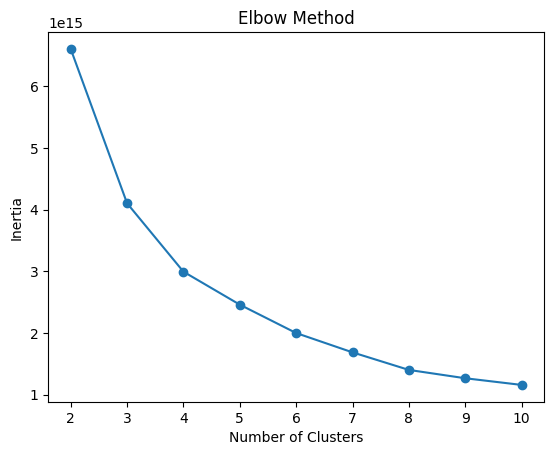

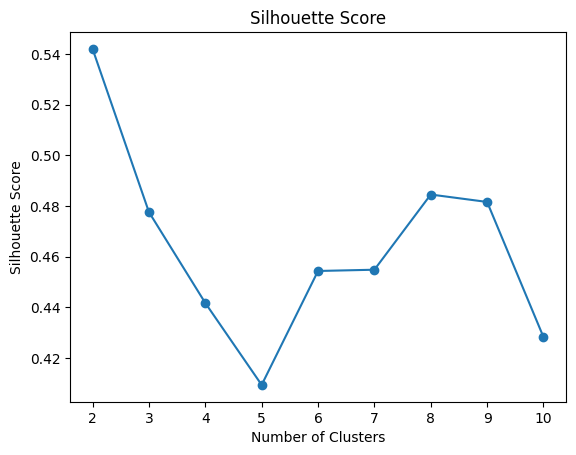

KMeans(n_clusters=5, n_init=10, random_state=42)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# クラスタリング対象の特徴量を選択
features = list(data_imputed.columns)

# クラスタリングのためのデータセットを作成
X = data_imputed[features][:50000]

# クラスタ数の範囲を指定
min_clusters = 2
max_clusters = 10

# エルボーメソッドとシルエットスコアを用いてクラスタ数を自動選択
silhouette_scores = []
inertias = []
for k in range(min_clusters, max_clusters+1):
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(X)
    inertia = kmeans.inertia_
    inertias.append(inertia)
    if k > 1:
        silhouette_avg = silhouette_score(X, kmeans.labels_)
        silhouette_scores.append(silhouette_avg)

# エルボープロットの作成
plt.plot(range(min_clusters, max_clusters+1), inertias, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

# シルエットスコアのプロット
plt.plot(range(2, max_clusters+1), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.show()

# シルエットスコアが最大となるクラスタ数を選択
best_cluster_index = np.argmax(silhouette_scores)
best_cluster_num = 5#best_cluster_index + min_clusters

# 最適なクラスタ数で再度クラスタリングを実施
kmeans = KMeans(n_clusters=best_cluster_num, n_init=10, random_state=42)
kmeans.fit(X)

# クラスタリング結果の可視化などの後続の処理を行う
# ...


In [ ]:
series = pd.Series(kmeans.labels_)

# カテゴリの出現回数を取得
value_counts = series.value_counts()
value_counts

3    18421
1    13608
0    11982
2     4822
4     1167
dtype: int64

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

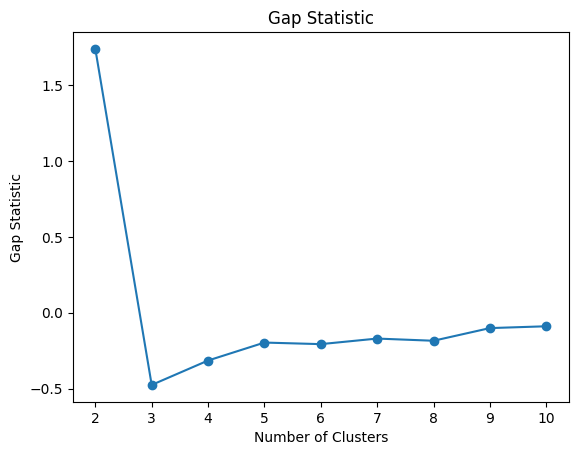

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=2, random_state=42)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs

# クラスタリングのためのデータセットを作成
X = data_imputed[features][:50000]

# クラスタ数の範囲を指定
min_clusters = 2
max_clusters = 10

# クラスタ数ごとのK-meansクラスタリングを実施
inertias = []
for k in range(min_clusters, max_clusters+1):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia = kmeans.inertia_
    inertias.append(inertia)

# Gap統計量の計算
gaps = []
for k in range(min_clusters, max_clusters+1):
    gap = np.log(inertias[k - min_clusters]) - np.log(inertias[k - min_clusters - 1])
    gaps.append(gap)

# エルボープロットの作成
plt.plot(range(min_clusters, max_clusters+1), gaps, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Gap Statistic')
plt.title('Gap Statistic')
plt.show()

# Gap統計量が最大となるクラスタ数を選択
best_cluster_index = np.argmax(gaps)
best_cluster_num = best_cluster_index + min_clusters

# 最適なクラスタ数で再度K-meansクラスタリングを実施
kmeans = KMeans(n_clusters=best_cluster_num, random_state=42)
kmeans.fit(X)

# クラスタリング結果の可視化などの後続の処理を行う
# ...


# 業務改善提案

ローンの返済能力を見極めたい  
13項目で考える。

1. 顧客情報:  
'SK_ID_CURR': 顧客ID  
'TARGET': ターゲット（返済困難なクライアントを示す目的変数）
 'NAME_CONTRACT_TYPE': 契約タイプの名称  
 'CODE_GENDER': 性別のコード  
 'FLAG_OWN_CAR': 自動車所有フラグ  
 'FLAG_OWN_REALTY': 不動産所有フラグ  
 'CNT_CHILDREN': 子供の数  
1. 収入関連:  
'AMT_INCOME_TOTAL': 収入総額  
'NAME_INCOME_TYPE': 収入のタイプ  
1. クレジット関連:  
'AMT_CREDIT': クレジット総額  
'AMT_ANNUITY': 年金総額  
'AMT_GOODS_PRICE': 商品価格総額  
1. 住居関連:  
'NAME_TYPE_SUITE': 同行者のタイプ  
'NAME_HOUSING_TYPE': 住居のタイプ  
1. 個人情報:  
'REGION_POPULATION_RELATIVE': 地域の人口相対値  
'DAYS_BIRTH': 生年月日からの経過日数  
'DAYS_EMPLOYED': 雇用日数（負の値は無効な値)
 'DAYS_REGISTRATION': 登録日数  
 'DAYS_ID_PUBLISH': 公表日数  
 'OWN_CAR_AGE': 自動車の年齢  
1. 連絡手段:  
'FLAG_MOBIL': 携帯電話所有フラグ  
'FLAG_EMP_PHONE': 勤務先電話所有フラグ  
'FLAG_WORK_PHONE': 勤務先携帯電話所有フラグ  'FLAG_CONT_MOBILE': 連絡可能な携帯電話所有フラグ  
'FLAG_PHONE': 自宅電話所有フラグ  'FLAG_EMAIL': メール所有フラグ  
1. 職業関連:  
'ORGANIZATION_TYPE':業界
'OCCUPATION_TYPE': 職業タイプ
1. 家族関連:  
'CNT_FAM_MEMBERS': 家族の人数
地域評価:
'REGION_RATING_CLIENT': 地域の評価（クライアントが属する地域の統計的な情報）  
'REGION_RATING_CLIENT_W_CITY': 都市を考慮した地域の評価  
1. 住所関連:  
'REG_REGION_NOT_LIVE_REGION': 住所が申請地域と一致しないフラグ

 'REG_REGION_NOT_WORK_REGION': 勤務地が申請地域と一致しないフラグ  
 'LIVE_REGION_NOT_WORK_REGION': 勤務地が居住地域と一致しないフラグ  
 'REG_CITY_NOT_LIVE_CITY': 住所が居住都市と一致しないフラグ
  
  'REG_CITY_NOT_WORK_CITY': 勤務地が居住都市と一致しないフラグ
'LIVE_CITY_NOT_WORK_CITY': 勤務地が居住都市と一致しないフラグ1. 外部データソース:  
'EXT_SOURCE_1': 外部データソース1  
'EXT_SOURCE_2': 外部データソース2'  
EXT_SOURCE_3': 外部データソース3  
1. ソーシャルサークル:  
'OBS_30_CNT_SOCIAL_CIRCLE': ソーシャルサークルでの30日間観察された人数  
'DEF_30_CNT_SOCIAL_CIRCLE': ソーシャルサークルでの30日間デフォルトした人数  
'OBS_60_CNT_SOCIAL_CIRCLE': ソーシャルサークルでの60日間観察された人数  
'DEF_60_CNT_SOCIAL_CIRCLE': ソーシャルサークルでの60日間デフォルトした人数  
1. その他:  
'DAYS_LAST_PHONE_CHANGE': 最後の電話変更からの経過日数  
'AMT_REQ_CREDIT_BUREAU_HOUR': クレジット情報機関への問い合わせ数（過去1時間）  
'AMT_REQ_CREDIT_BUREAU_MON': クレジット情報機関への問い合わせ数（過去1ヶ月）  
'AMT_REQ_CREDIT_BUREAU_QRT': クレジット情報機関への問い合わせ数（過去3ヶ月）  
'AMT_REQ_CREDIT_BUREAU_YEAR': クレジット情報機関への問い合わせ数（過去1年）  

以上が特徴量の分類の一例です。ただし、具体的な分類方法はデータや目的によって異なる場合がありますので、必要に応じてカスタマイズしてください。
これらのデータを上の分類を考慮して特徴量エンジニアリングするとどのような特徴量が出来ますか？

ChatGPT
以下は特徴量エンジニアリングの一例です。各分類に基づいて、新しい特徴量を作成する方法を示します。
1. 顧客情報:  
顧客の子供の数をバケット化する（例: 0, 1-2, 3以上）収入のタイプを数値化する（例: 0 - 無職, 1 - 従業員, 2 - 経営者）  
1. 収入関連:  
収入総額を家族の人数で割った1人当たりの収入を計算する収入のタイプごとに平均収入を計算する  
1. クレジット関連:  
クレジット総額を収入総額で割ったクレジット比率を計算するクレジット総額を商品価格総額で割ったローンの価格比率を計算する  
1. 住居関連:  
同行者のタイプをバイナリ特徴量にエンコードする（例: 0 - 同行者なし, 1 - 同行者あり）住居のタイプをバイナリ特徴量にエンコードする（例: 0 - レンタル住宅, 1 - 分譲住宅）  
1. 個人情報:  
生年月日から年齢を計算する雇用日数を絶対値に変換し、無効な値を欠損値に変換する登録日数を絶対値に変換し、欠損値を0で埋める  
1. 連絡手段:  
携帯電話所有フラグと自宅電話所有フラグを合算して、電話所有フラグを作成するメール所有フラグをバイナリ特徴量にエンコードする（例: 0 - メールなし, 1 - メールあり）  
1. 職業関連:  
職業タイプをOne-Hotエンコーディングする  
1. 家族関連:  
家族の人数をバケット化する（例: 1, 2, 3以上）  
1. 地域評価:  
地域の評価を地域の評価の平均値からの差として計算する  
1. 住所関連:  
住所が申請地域と一致しないフラグと勤務地が申請地域と一致しないフラグを合算して、住所一致フラグを作成する勤務地が居住地域と一致しないフラグと勤務地が居住都市と一致しないフラグを合算して、勤務地一致フラグを作成する  
1. 外部データソース:  
外部データソース1と外部データソース2の積を計算する外部データソース1と外部データソース3の積を計算する  
1. ソーシャルサークル:  
ソーシャルサークルでの30日間観察された人数とソーシャルサークルでの60日間観察された人数の合計を計算するソーシャルサークルでの30日間デフォルトした人数とソーシャルサークルでの60日間デフォルトした人数の合計を計算する  
1. その他:  
最後の電話変更からの経過日数を絶対値に変換し、欠損値を0で埋めるクレジット情報機関への問い合わせ数（過去1時間）からクレジット情報機関への問い合わせ数（過去1年）の合計を計算する

In [ ]:
import pandas as pd

# 1. 顧客情報
train['CNT_CHILDREN_BIN'] = pd.cut(train['CNT_CHILDREN'], bins=[-1, 0, 2, train['CNT_CHILDREN'].max()], labels=['0', '1-2', '3+'])
train['NAME_INCOME_TYPE_CODE'] = train['NAME_INCOME_TYPE'].map({'Unemployed': 0, 'Employee': 1, 'Business Owner': 2})

# 2. 収入関連
train['INCOME_PER_PERSON'] = train['AMT_INCOME_TOTAL'] / train['CNT_FAM_MEMBERS']
train['MEAN_INCOME_BY_TYPE'] = train.groupby('NAME_INCOME_TYPE')['AMT_INCOME_TOTAL'].transform('mean')

# 3. クレジット関連
train['CREDIT_RATIO'] = train['AMT_CREDIT'] / train['AMT_INCOME_TOTAL']
train['LOAN_PRICE_RATIO'] = train['AMT_CREDIT'] / train['AMT_GOODS_PRICE']

# 4. 住居関連
train['NAME_TYPE_SUITE_BINARY'] = (train['NAME_TYPE_SUITE'] != 'Unaccompanied').astype(int)
train['NAME_HOUSING_TYPE_BINARY'] = (train['NAME_HOUSING_TYPE'] != 'Rented apartment').astype(int)

# 5. 個人情報
train['AGE'] = train['DAYS_BIRTH'] // -365
train['DAYS_EMPLOYED'] = train['DAYS_EMPLOYED'].apply(lambda x: x if x > 0 else pd.NaT)
train['DAYS_REGISTRATION'] = abs(train['DAYS_REGISTRATION']).fillna(0)

# 6. 連絡手段
train['PHONE_FLAG'] = (train['FLAG_MOBIL'] + train['FLAG_EMP_PHONE'] + train['FLAG_WORK_PHONE'] + train['FLAG_CONT_MOBILE'] + train['FLAG_PHONE']).clip(0, 1)
train['EMAIL_FLAG'] = train['FLAG_EMAIL'].astype(int)

# 7. 職業関連
train = pd.get_dummies(train, columns=['OCCUPATION_TYPE'])

# 8. 家族関連
train['CNT_FAM_MEMBERS_BIN'] = pd.cut(train['CNT_FAM_MEMBERS'], bins=[-1, 1, 2, train['CNT_FAM_MEMBERS'].max()], labels=['1', '2', '3+'])

# 9. 地域評価
train['REGION_RATING_DIFF'] = train['REGION_RATING_CLIENT'] - train['REGION_RATING_CLIENT_W_CITY']

# 10. 住所関連
train['ADDRESS_MATCH_FLAG'] = (train['REG_REGION_NOT_LIVE_REGION'] + train['REG_REGION_NOT_WORK_REGION']).clip(0, 1)
train['WORK_ADDRESS_MATCH_FLAG'] = (train['REG_CITY_NOT_LIVE_CITY'] + train['REG_CITY_NOT_WORK_CITY']).clip(0, 1)

# 11. 外部データソース
train['EXT_SOURCE_1_2_PRODUCT'] = train['EXT_SOURCE_1'] * train['EXT_SOURCE_2']
train['EXT_SOURCE_1_3_PRODUCT'] = train['EXT_SOURCE_1'] * train['EXT_SOURCE_3']

# 12. ソーシャルサークル
train['OBS_DEF_SOCIAL_CIRCLE_SUM'] = train['OBS_30_CNT_SOCIAL_CIRCLE'] + train['OBS_60_CNT_SOCIAL_CIRCLE']
train['DEF_SOCIAL_CIRCLE_SUM'] = train['DEF_30_CNT_SOCIAL_CIRCLE'] + train['DEF_60_CNT_SOCIAL_CIRCLE']

# 13. その他
train['DAYS_LAST_PHONE_CHANGE'] = abs(train['DAYS_LAST_PHONE_CHANGE']).fillna(0)
train['TOTAL_REQ_CREDIT_BUREAU'] = train[['AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']].sum(axis=1)

# 上記の特徴量エンジニアリングを行ったデータフレームを新しい変数に代入する
engineered_train = train.copy()

上記の特徴量エンジニアリングは、ローンの返済能力を予測するための情報を抽出することを目的としています。以下に、各特徴量がデータ分析やソリューションの提案にどのように寄与できるかを示します。
1. 顧客情報:  
子供の数や収入のタイプなど、個人の状況を反映した特徴量を追加しています。これにより、家族構成や収入源などが返済能力に与える影響を理解することができます。  
1. 収入関連:  
収入に関連する特徴量を追加しています。個人の収入レベルや収入の分布などは、ローンの返済能力に直接影響を与える可能性があります。  
1. クレジット関連:  
クレジットに関連する特徴量を追加しています。クレジットの総額や商品価格との比率などは、借り入れの範囲や借入額に関連しています。  
1. 住居関連:  
住居に関連する特徴量を追加しています。同行者の有無や住居のタイプは、生活環境や財政状況に影響を与える要素です。  
1. 個人情報:  
生年月日や雇用期間などの個人情報を追加しています。これにより、個人の年齢や雇用状況が返済能力に与える影響を分析することができます。  
 1連絡手段:  
携帯電話やメールの所有フラグなど、連絡手段に関連する特徴量を追加しています。これにより、顧客とのコミュニケーションの容易さやアクセス性が返済能力に影響を与えるかどうかを評価できます。  
1. 職業関連:  
職業タイプに関連する特徴量を追加しています。職業は収入や雇用の安定性に密接に関連しており、返済能力に重要な要素です。  
1. 家族関連:  
家族の人数や家族構成に関連する特徴量を追加しています。家族のサイズや構成は、家計や負債返済能力に影響を与える可能性があります。  
1. 地域関連:  
地域の評価や住所の一致フラグなど、地域に関連する特徴量を追加しています。地域の統計的な情報や住所の一致は、返済能力に影響を与える可能性があります。  
1. 外部データソース:  
外部データソースからの情報を追加しています。これにより、個人の信用履歴や信用スコアなどの情報を活用し、返済能力を予測することができます。  

これらの特徴量は、ローンの返済能力を評価するための予測モデルの構築や、返済困難なクライアントを特定するための分析に活用できます。また、これらの特徴量を利用してソリューションを提案することも可能です。例えば、返済能力が低いと予測される顧客に対しては、適切な返済計画や支援策を提案することができます。

特徴量から得られる情報に基づいて、以下のような人に分類することができる可能性があります。ただし、具体的な分類や提案については、データの具体的な内容や特徴量の重要性によって異なるため、詳細な分析が必要です。
1. 返済能力が高いと予測される人:クラスタリングしたい(+事例)  
収入が安定しており、クレジット総額や商品価格との比率が適切な範囲内に収まっている人家族構成が安定しており、連絡手段や職業が安定している人外部データソースからの情報が良好であり、信用履歴や信用スコアが高い人  
1. 返済能力が低いと予測される人:クラスタリングしたい  
収入が不安定で、クレジット総額や商品価格との比率が高い人家族構成が複雑であり、連絡手段や職業が不安定な人外部データソースからの情報が悪く、信用履歴や信用スコアが低い人  
具体的な貸付や返済計画の提案については、以下のようなことが考えられますが、これらは一般的な提案の例であり、実際の状況に合わせて適切な提案を行う必要があります。
1. 返済能力が高い人への提案:  
より高額の貸付を提案することができるかもしれません。返済期間が短く、金利が低い貸付を提案することができるかもしれません。  
1. 返済能力が低い人への提案:  
返済計画の見直しや返済期間の延長を提案することができるかもしれません。支払い負担を軽減するための支援策や追加のサポートを提案することができるかもしれません。

ただし、これらの提案はあくまで参考として考えられるものであり、実際の判断や提案には個別の状況や法的な制約などを考慮する必要があります。

1. 可視化の目的を明確化する:  
可視化の目的や伝えたいメッセージを明確にします。データの特徴や関係性を示すのか、傾向やパターンを強調するのか、比較や分布を示すのか、など具体的な目的を定めます。  
1. 可視化の種類を選択する:  
データの性質や可視化の目的に応じて、適切な可視化手法を選択します。例えば、棒グラフや折れ線グラフ、ヒストグラム、散布図、箱ひげ図、ヒートマップなど、適切なグラフやチャートを選びます。  
1. 可視化を作成する:   
選んだ可視化手法を使用してデータをグラフやチャートに変換し、資料に埋め込む形で可視化を作成します。可視化にはPythonのデータ可視化ライブラリ（例：Matplotlib、Seaborn、Plotly）やビジュアライゼーションツール（例：Tableau、Power BI）を使用することができます。  
1. 視覚的な要素を工夫する:  
可視化を見やすく、分かりやすくするために、軸ラベルやタイトル、凡例の追加、色やマーカーの選択、グリッド線の表示など、視覚的な要素に工夫を加えます。  
1. 説明や解釈を付加する:  
可視化を利用してデータの解釈や説明を行うために、キャプション、注釈、説明文などを追加します。データの背景や文脈を説明し、視覚化された情報の意味を明確にします。  
1. 資料の体裁を整える:  
可視化を含む資料全体の体裁を整えます。レイアウトやフォント、色の統一性、グラフの配置などを調整し、資料が一貫性を持ち、読みやすい形式になるようにします。  
1. 資料の共有とフィードバックの収集:  
作成した資料を適切な形式（プレゼンテーション、レポート、ダッシュボードなど）で共有し、フィードバックを収集します。他の人の意見や視点を取り入れながら、資料を改善することができます。  

以上の手順を順番に実施することで、データを基にした納得感のある資料を作成し、可視化を効果的に活用することができます。

具体的な例として、ローンの返済能力を分析し、それを可視化する手順を示します。  
1. データの準備:  
必要な特徴量を選択します。例えば、収入総額（AMT_INCOME_TOTAL）、クレジット総額（AMT_CREDIT）、年金総額（AMT_ANNUITY）、職業タイプ（OCCUPATION_TYPE）、外部データソース1（EXT_SOURCE_1）などが含まれる特徴量を選択します。データの前処理を行います。欠損値の処理やカテゴリカル変数のエンコーディングなどを適用し、データを整えます。  
1. 可視化の目的を明確化する:  
ローンの返済能力に影響を与える要素や関係性を可視化し、傾向やパターンを把握することが目的です。例えば、「収入と返済能力の関係を明らかにする」「職業タイプと返済能力の関連を可視化する」といった目的を設定します。  
1. 可視化の種類を選択する:  
収入と返済能力の関係を示すためには、散布図や箱ひげ図などが適しています。収入をX軸に、返済能力をY軸にとってデータをプロットし、その関係性を可視化します。職業タイプと返済能力の関連を示すためには、棒グラフや箱ひげ図を使用することができます。職業タイプごとの返済能力の分布や統計量を可視化します。  
1. 可視化を作成する:  
選んだ可視化手法に基づいて、データをグラフやチャートに変換し可視化を作成します。例えば、MatplotlibやSeabornを使用して散布図や箱ひげ図を作成することができます。収入と返済能力の関係を示す散布図や回帰直線、職業タイプごとの返済能力の箱ひげ図などを作成します。  
1. 視覚的な要素を工夫する:  
軸ラベル、タイトル、凡例などの追加、色やマーカーの選択などを通じて、可視化をわかりやすく、魅力的にすることができます。フォントやサイズ、レイアウトなどもデザインに配慮し、資料全体の統一感を持たせます。  
1. 解釈と共有:  
可視化結果を解釈し、分析結果を説明します。例えば、収入と返済能力の関係が正の相関を持つことを示し、高収入層の返済能力がより高いことを観察した場合、それを適切な文脈で解釈します。可視化をプレゼンテーション、レポート、ダッシュボードなどの形式で共有し、読み手に理解しやすく、説得力のある情報を提供します。  

以上の手順を参考に、適切な可視化手法を選択し、ローンの返済能力に関するデータ分析結果を効果的に可視化することができます。

# ローンの返済能力を分析し、それを可視化

In [ ]:
import seaborn as sns

# バケット化された子供の数ごとの顧客数を集計
child_bucket_counts = df['CHILDREN_BUCKET'].value_counts()

# バープロットを作成
sns.barplot(x=child_bucket_counts.index, y=child_bucket_counts.values)
plt.xlabel('Number of Children')
plt.ylabel('Number of Customers')
plt.title('Number of Customers by Number of Children')

# グラフを表示
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# 収入のタイプごとの平均収入を計算
income_type_mean_income = df.groupby('INCOME_TYPE')['AMT_INCOME_TOTAL'].mean()

# バープロットを作成
income_type_mean_income.plot(kind='bar')
plt.xlabel('Income Type')
plt.ylabel('Mean Income')
plt.title('Mean Income by Income Type')

# グラフを表示
plt.show()


In [ ]:
import seaborn as sns

# クレジット比率を計算
df['CREDIT_RATIO'] = df['AMT_CREDIT'] / df['AMT_INCOME_TOTAL']

# ヒストグラムを作成
sns.histplot(df['CREDIT_RATIO'])
plt.xlabel('Credit Ratio')
plt.ylabel('Number of Customers')
plt.title('Distribution of Credit Ratio')

# グラフを表示
plt.show()


# LightGBM+AdvarsarialValidation(kfold)

## ベースモデルの作成

In [ ]:
import pandas as pd
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [ ]:
target = list(train.columns)
for remove_col in list(test.columns):
    target.remove(remove_col)

In [ ]:
target

['TARGET']

In [ ]:
features = list(train.columns)
features.remove(target[0])

In [ ]:
features

['SK_ID_CURR',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHA

In [ ]:
categorical_features = list(train.describe(include='O').columns)

In [ ]:
categorical_features

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'ORGANIZATION_TYPE']

In [ ]:
data = pd.concat([train,test])

In [ ]:
data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,0.0,Cash loans,F,N,N,0.0,112500.0,755190.0,36328.5,...,NaN,0.0,0.0,0.0,0.0,-292.0,NaN,NaN,NaN,NaN
1,1,0.0,Cash loans,F,N,Y,0.0,225000.0,585000.0,16893.0,...,0.553165,0.0,0.0,0.0,0.0,-617.0,0.0,0.0,0.0,1.0
2,2,0.0,Cash loans,F,N,Y,0.0,54000.0,334152.0,18256.5,...,NaN,4.0,0.0,4.0,0.0,-542.0,NaN,NaN,NaN,NaN
3,3,0.0,Cash loans,F,N,Y,0.0,67500.0,152820.0,8901.0,...,0.767523,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,1.0,Cash loans,M,N,N,0.0,157500.0,271066.5,21546.0,...,0.669057,0.0,0.0,0.0,0.0,-1243.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6759,177961,NaN,Cash loans,M,Y,N,0.0,112500.0,265851.0,18904.5,...,0.581484,0.0,0.0,0.0,0.0,-220.0,0.0,0.0,0.0,0.0
6760,177962,NaN,Cash loans,F,N,Y,0.0,112500.0,298728.0,15381.0,...,0.438281,0.0,0.0,0.0,0.0,-419.0,0.0,0.0,2.0,2.0
6761,177963,NaN,Cash loans,F,N,Y,0.0,135000.0,148707.0,14616.0,...,0.661024,0.0,0.0,0.0,0.0,-253.0,0.0,0.0,0.0,3.0
6762,177964,NaN,Cash loans,F,N,Y,1.0,112500.0,614574.0,19953.0,...,0.722393,1.0,0.0,1.0,0.0,-692.0,0.0,0.0,0.0,2.0


In [ ]:
from sklearn import preprocessing
labels={}
for column in categorical_features:
    # print(train[column].shape)
    le= preprocessing.LabelEncoder()
    le.fit(data[column].astype(str))
    label={column:list(le.classes_)}
    labels.update(label)
    data[column]=le.transform(data[column].astype(str))

In [ ]:
train = data[:len(train)]
test = data[len(train):]

In [ ]:
X = train[features]
y = train[target]

In [ ]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split

# データの分割
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# LightGBMのデータセットを作成
lgb_train = lgb.Dataset(X_train, label=y_train)
lgb_valid = lgb.Dataset(X_valid, label=y_valid)

In [ ]:
# LightGBMのパラメータ設定
params = {
    'objective': 'binary',
    'metric': 'auc',
    'verbose': -1
}

# early stoppingコールバックの設定
early_stopping = lgb.early_stopping(stopping_rounds=100)

# log_evaluationコールバックの設定
log_evaluation = lgb.log_evaluation(period=30)

# LightGBMモデルの学習
model = lgb.train(params, lgb_train, num_boost_round=1000,
                  valid_sets=[lgb_train, lgb_valid],
                  early_stopping_rounds=10,
                  callbacks=[early_stopping, log_evaluation])

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


Training until validation scores don't improve for 100 rounds
[30]	training's auc: 0.999363	valid_1's auc: 0.66581


## AdvarsarialValidation(RandomForest)

In [ ]:
X_train = X.copy()
y = y.copy()
X_test = test[features].copy()

In [ ]:
# 訓練データの平均値を計算
mean_train = X_train.mean()

# 訓練データとテストデータの両方の欠損値を訓練データの平均値で補完
X_train = X_train.fillna(mean_train)
X_test = X_test.fillna(mean_train)

### 訓練データとテストデータを分類するモデルを作成

In [ ]:
# 必要なライブラリをインポートします
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
import numpy as np
import pandas as pd

# 仮定: X_trainとX_testは訓練データとテストデータを表すデータフレームです

# 訓練データとテストデータを結合します
X_adv = pd.concat([X_train, X_test], axis=0)
y_adv = np.hstack((np.zeros(X_train.shape[0]), np.ones(X_test.shape[0])))

# 予測のための空の配列を作成します
predictions = np.zeros(y_adv.shape[0])

# StratifiedKFoldオブジェクトを初期化します
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 各フォールドについてループします
for fold, (train_idx, valid_idx) in enumerate(skf.split(X_adv, y_adv)):
    # データを分割します
    X_train_fold = X_adv.iloc[train_idx]
    y_train_fold = y_adv[train_idx]
    X_valid_fold = X_adv.iloc[valid_idx]
    y_valid_fold = y_adv[valid_idx]

    # モデルを初期化してフィットさせます
    model = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=42)
    model.fit(X_train_fold, y_train_fold)

    # 予測を行います
    predictions[valid_idx] = model.predict_proba(X_valid_fold)[:, 1]

# AUCスコアを計算します
auc_score = roc_auc_score(y_adv, predictions)
print(f"AUC Score: {auc_score}")


AUC Score: 0.9999999999999999


## adversarial validation2:datasetとmodelの学習を分けたコード

In [ ]:
X_train = X.copy()
y = y.copy()
X_test = test[features].copy()

In [ ]:
# 訓練データの平均値を計算
mean_train = X_train.mean()

# 訓練データとテストデータの両方の欠損値を訓練データの平均値で補完
X_train = X_train.fillna(mean_train)
X_test = X_test.fillna(mean_train)

In [ ]:
# 訓練データとテストデータを結合します
X_adv = pd.concat([X_train, X_test], axis=0)
y_adv = np.hstack((np.zeros(X_train.shape[0]), np.ones(X_test.shape[0])))

In [ ]:
# 予測のための空の配列を作成します
predictions = np.zeros(y_adv.shape[0])

# StratifiedKFoldオブジェクトを初期化します
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [ ]:
# from sklearn.model_selection import train_test_split

# # データをトレーニングデータとテストデータに分割
# X_train, X_test, y_train, y_test = train_test_split(X_adv, y_adv, test_size=0.2, random_state=42)

In [ ]:
# 各フォールドのトレーニングデータとバリデーションデータを格納するリストを初期化
train_data_set = []
valid_idxes = []
# 各フォールドについてループします
for fold, (train_idx, valid_idx) in enumerate(skf.split(X_adv, y_adv)):
    # データを分割します
    X_train_fold = X_adv.iloc[train_idx]
    y_train_fold = y_adv[train_idx]
    X_valid_fold = X_adv.iloc[valid_idx]
    y_valid_fold = y_adv[valid_idx]

    train_data_set.append(((X_train_fold, y_train_fold),(X_valid_fold, y_valid_fold)))
    valid_idxes.append(valid_idx)

In [ ]:
# 各フォールドについてモデルの学習を行う
for (train_data, valid_data), valid_idx in zip(train_data_set, valid_idxes):
    # トレーニングデータを取り出す
    X_train_fold, y_train_fold = train_data
    # バリデーションデータを取り出す
    X_valid_fold, y_valid_fold = valid_data
    # モデルを初期化してフィットさせます
    model = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=42)
    model.fit(X_train_fold, y_train_fold)

    # 予測を行い、結果を格納
    predictions[valid_idx] = model.predict_proba(X_valid_fold)[:, 1]

In [ ]:
# AUCスコアを計算します
auc_score = roc_auc_score(y_adv, predictions)
print(f"AUC Score: {auc_score}")

AUC Score: 0.9999999999999999


#### 解説：AUCが1.0は問題ないか？(ChatGPT Plus)

Adversarial Validationのモデル（つまり、訓練データとテストデータを区別するモデル）のAUCが1.0となるということは、訓練データとテストデータが完全に異なる分布から抽出されたことを意味します。つまり、このモデルは訓練データとテストデータを完全に区別できる能力を持つことを示しています。

この結果は必ずしも問題を示すわけではありませんが、注意が必要です。なぜなら、訓練データとテストデータが大きく異なる分布から抽出されている場合、訓練データで学習したモデルがテストデータに対して良い性能を発揮しない可能性があるからです。つまり、過学習のリスクが高まります。

一方で、Adversarial ValidationのモデルのAUCが1.0に近い場合、それはデータの前処理や特徴エンジニアリングのステップを見直す良い機会かもしれません。例えば、訓練データにしか存在しない特徴やテストデータにしか存在しない特徴がある場合、それらはモデルが訓練データとテストデータを区別するのを助け、AUCを1.0に近づける可能性があります。

したがって、Adversarial ValidationのモデルのAUCが1.0となること自体は問題ではありませんが、それが引き起こす可能性のある問題（過学習や特徴の不均衡など）に対して注意を払い、適切な対策を講じることが重要です。

### AdversarialValidationを使った学習

#### 閾値を定義して訓練データとテストデータに分割

In [ ]:
np.median(predictions[:X_train.shape[0]])

0.94

In [ ]:
pd.Series(predictions[:X_train.shape[0]] <= threshold).value_counts()

NameError: ignored

In [ ]:
X_train.shape

(8122, 50)

In [ ]:
X_train_new.shape

NameError: ignored

In [ ]:
from scipy.optimize import minimize
from sklearn.metrics import f1_score

# 目的関数（マイナスの F1 スコアを最小化）
def objective(threshold):
    y_pred = (y_pred_proba > threshold).astype(int)
    f1 = f1_score(y_valid_fold, y_pred)
    return -f1

# 初期閾値を設定
initial_threshold = 0.5

# 最適化を実行
result = minimize(objective, initial_threshold, bounds=[(0, 1)])

# 最適な閾値を取得
best_threshold = result.x[0]
best_f1_score = -result.fun

print(f"Best F1 Score: {best_f1_score}")
print(f"Best Threshold: {best_threshold}")


Best F1 Score: 1.0
Best Threshold: 0.5


In [ ]:
thresholds = np.linspace(0, 1, 100)  # 0から1までの閾値を100等分した値を試す
f1_scores = []

# 各閾値に対して F1 スコアを計算
for threshold in thresholds:
    y_pred = (y_pred_proba > threshold).astype(int)
    f1_scores.append(f1_score(y_valid_fold, y_pred))

# 最大の F1 スコアとそのインデックスを取得
best_f1_score = np.max(f1_scores)
best_threshold = thresholds[np.argmax(f1_scores)]

print(f"Best F1 Score: {best_f1_score}")
print(f"Best Threshold: {best_threshold}")


Best F1 Score: 1.0
Best Threshold: 0.17171717171717174


In [ ]:
# しきい値を定義（ここでは中央値を使用）
threshold = best_threshold#np.median(predictions[:X_train.shape[0]])

# 訓練用と検証用のマスク
train_mask = predictions[:X_train.shape[0]] <= threshold
val_mask = predictions[:X_train.shape[0]] > threshold

# 新しい訓練用と検証用のセット
X_train_new = X_train[train_mask]
y_train_new = y[train_mask[:X_train.shape[0]]]
X_val_new = X_train[val_mask]
y_val_new = y[val_mask[:X_train.shape[0]]]

# データセットを再作成
lgb_train = lgb.Dataset(X_train_new, y_train_new, categorical_feature=categorical_features, free_raw_data=False)
lgb_valid = lgb.Dataset(X_val_new, y_val_new, reference=lgb_train, categorical_feature=categorical_features, free_raw_data=False)

In [ ]:
X_train_new.shape

(3388, 50)

#### 学習

In [ ]:
# パラメータ
params = {
    'objective': 'binary',
    'metric': 'auc',
    'verbose': -1
}

# early stoppingコールバックの設定
early_stopping = lgb.early_stopping(stopping_rounds=100)

# log_evaluationコールバックの設定
log_evaluation = lgb.log_evaluation(period=30)

# LightGBMを訓練します
model = lgb.train(
    params,
    lgb_train,
    valid_sets=[lgb_train, lgb_valid],
    valid_names=['train', 'valid'],
    num_boost_round=1000,
    callbacks=[early_stopping, log_evaluation]
)

/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/usr/local/lib/python3.10/dist-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 100 rounds
[30]	train's auc: 0.995632	valid's auc: 1
[60]	train's auc: 1	valid's auc: 1
[90]	train's auc: 1	valid's auc: 1
Early stopping, best iteration is:
[1]	train's auc: 0.808927	valid's auc: 1


In [ ]:
#[60]	training's auc: 0.805554	valid_1's auc: 0.74603

### 解説：Adversarial Validationの目的と効果(ChatGPTPlus)

Adversarial Validationの目的は、訓練データとテストデータの分布が可能な限り近くなるようにデータセットを再分割することにあります。これにより、モデルが訓練データに過学習し、テストデータに対する予測性能が低下するリスクを軽減することができます。

そのため、Adversarial Validationによる分割は、単純なランダム分割やStratifiedKFoldによる分割と比較して、以下のような利点があります：

1. 訓練データとテストデータの分布の違いを具体的に捉えることができます。Adversarial Validationは、訓練データとテストデータの間で特徴の分布がどの程度異なるかを数値化します。これにより、モデルがテストデータに対してどの程度適合可能かを予測するための具体的な指標を提供します。

2. 分布の違いに基づいてデータを分割することができます。Adversarial Validationの予測スコアをしきい値として使用することで、訓練データとテストデータの間の分布の違いを直接考慮したデータ分割を行うことができます。これにより、モデルがテストデータに対する予測性能を最大化するためのより適切なデータ分割が可能になります。

したがって、訓練データとテストデータの分布が大きく異なる場合や、モデルの汎化性能を最大化することが重要な場合には、Adversarial Validationによるデータ分割を検討すると良いでしょう。

# データ分析と機械学習

## データ分析

### 回帰分析と決定木分析

## 機械学習

### 勾配ブースティング木とkfold

# 市場調査

https://docs.google.com/presentation/d/1OSzua-DzofH5Lib1QcOCJczM3WePgMnM/edit#slide=id.p3